In [62]:
import scipy.io as sio
import numpy as np
from sklearn.preprocessing import RobustScaler,MinMaxScaler,StandardScaler,Normalizer,QuantileTransformer
from keras.models import Model
from keras.layers import Dense,Input
import pandas as pd
from sklearn.metrics.pairwise import *
import matlab
import matlab.engine
from scipy.stats import *
from scipy.spatial.distance import *
from scipy.sparse.csgraph import laplacian
from numpy.linalg import eig
import hdbscan

import rcc
from sklearn.decomposition import *
import keras.backend as K
from scipy.spatial.distance import *
from sklearn.neighbors import *

from keras.optimizers import *
from sklearn.model_selection import *
from keras.layers import Lambda,Dropout,Embedding
from keras.utils import multi_gpu_model
from keras import regularizers
from IPython.display import SVG
from sklearn.cluster.bicluster import SpectralCoclustering
from sklearn.metrics import consensus_score
from sklearn import metrics
import scipy.cluster.hierarchy as hc
from sklearn.metrics import *
from keras.utils.vis_utils import model_to_dot
import os
import seaborn as sns
from sklearn.manifold import TSNE,Isomap,LocallyLinearEmbedding
import umap
from scipy.cluster.hierarchy import *
from sklearn.cluster import *
from scipy.spatial import distance_matrix
import matplotlib.pyplot as plt
import tensorflow as tf
import keras
from keras.constraints import *
from keras.regularizers import *
from keras.layers import *

from keras.initializers import *
activa = 'relu'
dp_rate = 0.5
low_dim = 128
l2_penalty = 0
l1_penalty = 1e-5
os.environ["CUDA_VISIBLE_DEVICES"]="1"
# data_mat = sio.loadmat('/home/yzy/SIMS/0801liver_data.mat')
# data_mat = sio.loadmat('/home/yzy/SIMS/data_mat_0614_2.mat')
# data_mat = sio.loadmat('/home/yzy/SIMS/data_mat_hunyang14_0827.mat')
# data_mat = sio.loadmat('/home/yzy/SIMS/data_mat_0911_withlabel.mat')
# data_mat = sio.loadmat('/home/yzy/SIMS/data_mat_zuzhi_0918.mat')
# data_mat = sio.loadmat('/home/yzy/SIMS/data_mat_0925.mat')

# 0928的混养，2个batch，无cell type，br和i在最后两列
# data_mat = sio.loadmat('/home/yzy/SIMS/datamat_0928hunyang_2batch.mat')

# 1001的混养数据，四类
# data_mat = sio.loadmat('/home/yzy/SIMS/datamat_1001cellline_4batch_last2dimbri.mat')



# data_mat = sio.loadmat('/home/yzy/SIMS/0713liver_data.mat')

data_mat=data_mat['data_mat']

# num_features = 286
num_features = 274
img_size = 256
def majorvote_clustering(pixel_data,pixel_belonging,k,norm=False):
    num_cells = np.max(cell_idx)
    pixel_cluster_label = KMeans(n_clusters=k).fit_predict(pixel_data)
    tmp,pixel_label_count = np.unique(pixel_cluster_label,return_counts=True)
    rst = []
    for ith_cell in range(num_cells):
        ith_cell+=1
        label_count = np.zeros(shape=(k,))
        unique_labels,label_count_tmp = np.unique(pixel_cluster_label[pixel_belonging==ith_cell],return_counts=True)
        label_count[unique_labels] = label_count_tmp
        if norm==True:
            label_count = label_count/pixel_label_count
        rst.append(np.argmax(label_count))
    return np.array(rst)

def reset_weights(model):
    session = K.get_session()
#     k=0
    for layer in model.layers: 
#         print(k)
        if hasattr(layer, 'kernel_initializer'):
            layer.kernel.initializer.run(session=session)
#             k+=1

def label2CM(label):
    label_sz = label.shape[0]
    rst = np.zeros(shape=(label_sz,label_sz))
    for i in range(label_sz):
        for j in range(i+1):
            if label[i]<0 or label[j]<0:
                continue
            if label[i]==label[j]:
                rst[i,j] = 1
                rst[j,i] = 1
    return rst
            
def get_matter_img(matter_idx,batch_num):
    data = batch_dict[batch_num]
    pos = pos_dict[batch_num]
    sorted_idx = np.argsort(pos)
    sorted_data = data[sorted_idx,matter_idx]
    return sorted_data.reshape((256,256))

def ind2ij(ind,size,axis):
    i,j=divmod(ind-1,size)
    i+=1
    j+=1
    return np.array([i,j])[axis]

def cal_square_dist(idx1,idx2,size):
    i1,j1=divmod(idx1-1,size)
    i1 +=1
    j1 +=1
    i2,j2=divmod(idx2-1,size)
    i2+=1
    j2+=1
    return (i1-i2)**2+(j1-j2)**2
def get_labeling(label,cell_idx):
#     y是cell-rela的细胞对应的标签
#     print('pred_y',np.unique(label))
    labeling = np.zeros(shape=(65536,1))
    b = cell_idx.copy()
    num_cells = label.shape[0]
    for i in range(num_cells):
        b[b==i+1] = label[i] + 1
#     print(cell_pos)
#     print('b',np.unique(b))
#     cell_pos = cell_pos.astype('int')
    labeling[cell_pos.astype('int')-1,0] = b
    
    return labeling

def numpy2mat(numpy_mat):
    list_mat = list(map(lambda x:list(x),numpy_mat))
    return matlab.double(list_mat)
def SIMLR(data_x,k):
    data_x = numpy2mat(data_x)
    [cur_label, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(data_x,k,10.0,nargout=8)
    y_SIMLR = np.array(cur_label)[:,0]
    return y_SIMLR
def ClustRF(data_x,k):
    data_x = numpy2mat(data_x)
    [y_ClustRF,affinity_mat] = eng.ClustRF(data_x,'adaptive',k,nargout=2)    
    y_ClustRF = np.array(y_ClustRF)[:,0]
    return y_ClustRF
def SSR(data_x,k):
    data_x = numpy2mat(data_x)
    [y_SSR] = eng.simplexSC(data_x,k,10.0)
    y_SSR = np.array(y_SSR)
    return y_SSR
def RMKKM(data_x,k):
#     data_x：numpyarray；
#     k：float，e.g，2.0
    kernel_list = []
    gaussian_ts = [0.01,0.05,0.1,1,10,50,100]
    poly_as = [0,1]
    poly_bs = [2,4]

    # 先是gaussian kernel，
    max_dist = np.max(pdist(data_x,'euclidean'))
    for gaussian_t in gaussian_ts:
        delta = gaussian_t*max_dist
        gamma = 1/(2*np.square(delta))
        cur_kernel = rbf_kernel(data_x,gamma=gamma)
        kernel_list.append(cur_kernel)

    # 再是poly kernel
    for i in range(len(poly_as)):
        poly_a = poly_as[i]
        poly_b = poly_bs[i]
        cur_kernel = polynomial_kernel(data_x,coef0=poly_a,degree=poly_b)
        kernel_list.append(cur_kernel)

    #cosine kernel
    kernel_list.append(cosine_similarity(data_x))

    kernel_list = list(map(lambda m:numpy2mat(m),kernel_list))
    rst = eng.RMKKM(kernel_list,k,'gamma',0.5, 'maxiter', 50, 'replicates', 1,nargout=1)
    y_RMKKM=np.array(rst)[:,0]
    return y_RMKKM

def SC3(data_x,k,transformations=['PCA']):
    # data_x = rep
    # k=3
    # transformations = ['PCA','Laplacian']
    k = int(k)
    d_range_low = np.max([np.floor(data_x.shape[0]*0.04),1])
    d_range_high = np.ceil(data_x.shape[0]*0.07)
    d_range = np.arange(d_range_low,d_range_high+1)
    distance_metrics = ['euclidean','pearson','spearman']
    kmeans_input_pool = []
    kmeans_label_list = []
    CM = np.zeros(shape=(data_x.shape[0],data_x.shape[0]))
    for distance_metric in distance_metrics:
        if distance_metric=='euclidean':
            dist_mat = squareform(pdist(data_x,'euclidean'))
        elif distance_metric=='pearson':
            dist_mat = squareform(pdist(data_x,'correlation'))
        elif distance_metric=='spearman':
            dist_mat = 1-spearmanr(np.transpose(data_x))[0]
        for transformation in transformations:
            if transformation=='PCA':
                trans_dist_mat = PCA(n_components=int(d_range_high)).fit_transform(dist_mat)
            elif transformation=='Laplacian':
                simi_mat = np.exp(-dist_mat/(np.max(dist_mat)))
                graph_lap = laplacian(simi_mat,normed=True,return_diag=False)
                eig_value,eig_vector = eig(graph_lap)
                trans_dist_mat = eig_vector[:,np.flip(np.argsort(eig_value),axis=0)[0:int(d_range_high)]]
            for d in d_range:
                cur_input = trans_dist_mat[:,0:int(d)]
                kmeans_input_pool.append(cur_input)
    for kmeans_input in kmeans_input_pool:
        cur_y = KMeans(k).fit_predict(kmeans_input)
        kmeans_label_list.append(cur_y)
        cur_CM = label2CM(cur_y)
        CM = CM + cur_CM
    CM = CM/np.max(CM)
    y_SC3=AgglomerativeClustering(n_clusters=k,affinity='precomputed',linkage='complete').fit_predict(1-CM)

    return y_SC3


In [2]:
num_cells

NameError: name 'num_cells' is not defined

In [486]:
# 无label,br和i在最后两列的情况
from sklearn.metrics.pairwise import euclidean_distances
import pickle
batch_dict = {}
batch_dict_robust = {}
batch_dict_minmax = {}
batch_dict_standard = {}
batch_dict_134 = {}
batch_dict_norm = {}
batch_dict_norm_standard = {}
batch_dict_standard_norm = {}
label_dict = {}
bri_dict = {}
cell_dict = {}
pos_dict = {}
cell_weight_dict = {}
FE_dict={}
for i in range(2):
    print(i)
    cur_data = data_mat[data_mat[:,0]==i+1,3:num_features+3]
#     cur_data_134 = cur_data/cur_data[:,91][:,None]
#     cur_data_134 = cur_data/cur_data[:,96-2][:,None]
    cur_data_134 = cur_data/cur_data[:,93-2][:,None]

    cur_data_robust = RobustScaler().fit_transform(cur_data)
    cur_data_minmax = MinMaxScaler().fit_transform(cur_data)
    cur_data_standard = StandardScaler().fit_transform(cur_data)
    cur_data_norm = Normalizer().fit_transform(cur_data)
    cur_data_norm_standard = StandardScaler().fit_transform(cur_data_norm)
    cur_data_standard_norm = Normalizer().fit_transform(cur_data_standard)
    batch_dict[i+1] = cur_data
    batch_dict_134[i+1] = cur_data_134
    batch_dict_robust[i+1] = cur_data_robust
    batch_dict_minmax[i+1] = cur_data_minmax
    batch_dict_standard[i+1] = cur_data_standard
    batch_dict_norm[i+1] = cur_data_norm
    batch_dict_norm_standard[i+1] = cur_data_norm_standard
    batch_dict_standard_norm[i+1] = cur_data_standard_norm
    cell_dict[i+1] = data_mat[data_mat[:,0]==i+1,1]
    cur_batch_idx = data_mat[data_mat[:,0]==i+1,2]
    label_dict[i+1] = np.ones(shape=cur_batch_idx.shape)
    bri_dict[i+1] = data_mat[data_mat[:,0]==i+1,-2:]
   
    pos_dict[i+1] = cur_batch_idx

0


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:23: RuntimeWarning: divide by zero encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:23: RuntimeWarning: invalid value encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


1


In [488]:
bri_dict[1].shape

(65536, 2)

In [352]:
# 无label的情况
from sklearn.metrics.pairwise import euclidean_distances
import pickle
batch_dict = {}
batch_dict_robust = {}
batch_dict_minmax = {}
batch_dict_standard = {}
batch_dict_134 = {}
batch_dict_norm = {}
batch_dict_norm_standard = {}
batch_dict_standard_norm = {}
label_dict = {}
cell_dict = {}
pos_dict = {}
cell_weight_dict = {}
FE_dict={}
for i in range(14):
    print(i)
    cur_data = data_mat[data_mat[:,0]==i+1,3:num_features+3]
#     cur_data_134 = cur_data/cur_data[:,91][:,None]
#     cur_data_134 = cur_data/cur_data[:,96-2][:,None]
    cur_data_134 = cur_data/cur_data[:,93-2][:,None]

    cur_data_robust = RobustScaler().fit_transform(cur_data)
    cur_data_minmax = MinMaxScaler().fit_transform(cur_data)
    cur_data_standard = StandardScaler().fit_transform(cur_data)
    cur_data_norm = Normalizer().fit_transform(cur_data)
    cur_data_norm_standard = StandardScaler().fit_transform(cur_data_norm)
    cur_data_standard_norm = Normalizer().fit_transform(cur_data_standard)
    batch_dict[i+1] = cur_data
    batch_dict_134[i+1] = cur_data_134
    batch_dict_robust[i+1] = cur_data_robust
    batch_dict_minmax[i+1] = cur_data_minmax
    batch_dict_standard[i+1] = cur_data_standard
    batch_dict_norm[i+1] = cur_data_norm
    batch_dict_norm_standard[i+1] = cur_data_norm_standard
    batch_dict_standard_norm[i+1] = cur_data_standard_norm
    cell_dict[i+1] = data_mat[data_mat[:,0]==i+1,1]
    cur_batch_idx = data_mat[data_mat[:,0]==i+1,2]
    label_dict[i+1] = np.ones(shape=cur_batch_idx.shape)
    
   
    pos_dict[i+1] = cur_batch_idx

0


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:22: RuntimeWarning: divide by zero encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:22: RuntimeWarning: invalid value encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


1
2
3
4
5
6
7


KeyboardInterrupt: 

In [2]:
# 有label的情况

from sklearn.metrics.pairwise import euclidean_distances
import pickle
batch_dict = {}
batch_dict_robust = {}
batch_dict_minmax = {}
batch_dict_standard = {}
batch_dict_134 = {}
batch_dict_norm = {}
batch_dict_norm_standard = {}
batch_dict_standard_norm = {}
label_dict = {}
cell_dict = {}
pos_dict = {}
cell_weight_dict = {}
FE_dict={}
for i in range(4):
    print(i)
    cur_data = data_mat[data_mat[:,0]==i+1,4:num_features+4]
    cur_data_134 = cur_data/cur_data[:,96-2][:,None]
    cur_data_robust = RobustScaler().fit_transform(cur_data)
    cur_data_minmax = MinMaxScaler().fit_transform(cur_data)
    cur_data_standard = StandardScaler().fit_transform(cur_data)
    cur_data_norm = Normalizer().fit_transform(cur_data)
    cur_data_norm_standard = StandardScaler().fit_transform(cur_data_norm)
    cur_data_standard_norm = Normalizer().fit_transform(cur_data_standard)
    batch_dict[i+1] = cur_data
    batch_dict_134[i+1] = cur_data_134
    batch_dict_robust[i+1] = cur_data_robust
    batch_dict_minmax[i+1] = cur_data_minmax
    batch_dict_standard[i+1] = cur_data_standard
    batch_dict_norm[i+1] = cur_data_norm
    batch_dict_norm_standard[i+1] = cur_data_norm_standard
    batch_dict_standard_norm[i+1] = cur_data_standard_norm
    label_dict[i+1] = data_mat[data_mat[:,0]==i+1,2]
    cell_dict[i+1] = data_mat[data_mat[:,0]==i+1,1]
    cur_batch_idx = data_mat[data_mat[:,0]==i+1,3]
#     FE_dict[i+1] = data_mat[data_mat[:,0]==i+1,4]
    pos_dict[i+1] = cur_batch_idx
#     cur_length = cur_data.shape[0]
#     cur_dist = np.zeros(shape=(cur_length,cur_length))
#     cur_ij_mat = np.zeros(shape=(cur_length,2))
#     for j in range(cur_length):
        
#         ii,jj=ind2ij(cur_batch_idx[j],img_size)
        
#         cur_ij_mat[j,0] = ii
#         cur_ij_mat[j,1] = jj
#     cur_dist = euclidean_distances(cur_ij_mat)
    
#     dist_dict[i+1] = cur_dist
# pickle.dump(dist_dict,open("/home/yzy/SIMS/eu_dist_dict_13.pkl","wb"))

0


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:21: RuntimeWarning: divide by zero encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:21: RuntimeWarning: invalid value encountered in true_divide
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by MinMaxScaler.
  warnings.warn(msg, DataConversionWarning)
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/sklearn/utils/validation.py:475: DataConversionWarning: Data with input dtype int32 was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


1
2
3


In [3]:
def simulate_data(batch_idx,mode,fold_var,mean_shift,change_dims):
    cell_idx = cell_dict[batch_idx]
    sample_x = batch_dict[batch_idx]
    sample_x_rst = sample_x.copy().astype('float64')
    cell_idx_rst = cell_idx.copy()
    if mode==0:
        
        sample_x_rst = sample_x
    elif mode==1:
#         随机选change_dims个维，把每个细胞的这些维按N(mean_shift,fold_var)重采样
#         fold_var,mean_shift,change_dims
#         selected_dims = np.random.randint(0,sample_x.shape[1],change_dims)
        selected_dims = np.random.permutation(sample_x.shape[1])[0:change_dims]
        for i in range(np.max(cell_idx)):
            cur_cell = sample_x[cell_idx==i+1,:]
#             cur_cell_mean = np.mean(sample_cell[:,selected_dims],axis=0)
#             cur_cell_std = np.std(sample_cell[:,selected_dims],axis=0)
            for j in selected_dims:
#                 print(i,j)
                cur_cell_mean = np.mean(cur_cell[:,j])+mean_shift
                cur_cell_std = np.std(cur_cell[:,j])*fold_var
                
                cur_simu = np.random.normal((cur_cell_mean), (cur_cell_std), cur_cell.shape[0])
                for k in range(10):
                    if np.min(cur_simu)>=0:
                        break
                    cur_simu = np.random.normal((cur_cell_mean), (cur_cell_std), cur_cell.shape[0])
#                 print(np.min(cur_simu<0))
                if np.min(cur_simu)<0:
                    cur_simu = cur_cell[:,j]
                else:
#                     print(cur_simu)
                    pass
#                     print(np.min(cur_cell[j]))
#                 print(cur_simu)
                    
                sample_x_rst[cell_idx==i+1,j] = cur_simu
    elif mode==2:
#         add zero pixels
#         fold_var:添加的数字
#         mean_shift:每个细胞添加的百分比
#     给每个细胞增加mean_shift比例的fold_var像素点
        selected_dims = np.random.permutation(sample_x.shape[1])[0:change_dims]
        
        for i in range(np.max(cell_idx)):
            cur_area = np.sum(cell_idx==i+1)
#             cell_area_list.append(np.sum(cell_idx==i+1))
            cur_add_num = int(cur_area*mean_shift)+1
            sample_x_rst = np.vstack([sample_x_rst,fold_var*np.ones(shape=(cur_add_num,sample_x.shape[1]))])
#         sample_x_rst[:,selected_dims] = np.vstack([sample_x_rst[:,selected_dims],])
            cell_idx_rst = np.hstack([cell_idx_rst,(i+1)*np.ones(shape=(cur_add_num,))])
            cell_idx_rst = cell_idx_rst.astype('int')

    elif mode==3:
        
#         在每个cell中，按比例把像素点的profile乘2
#         fold_var:乘几（2）；mean_shift:百分比
        for i in range(np.max(cell_idx)):
            cur_cell = sample_x[cell_idx==i+1,:]
            num_change = int(mean_shift*cur_cell.shape[0])
            selected_pixels_idx = np.random.permutation(cur_cell.shape[0])[0:num_change]
            changed_cell = cur_cell.copy()
            changed_cell[selected_pixels_idx,:] = changed_cell[selected_pixels_idx,:]*fold_var
            sample_x_rst[cell_idx==i+1,:] = changed_cell
    elif mode==4:
        
#         把每个像素点随机乘0～fold_var的均匀分布
        uniform_sample = np.random.uniform(0,fold_var,size=(sample_x.shape[0],1))
        sample_x_rst = sample_x_rst*uniform_sample
    elif mode==5:
#         随机选change_dim个维度，把每个像素点的这个维度乘fold_var
        selected_dims = np.random.permutation(sample_x.shape[1])[0:change_dims]
        sample_x_rst[:,selected_dims]*=fold_var
    elif mode==6:
#         指定change_dims（一个list）维度，乘fold_var
        for change_dim_idx in range(len(change_dims)):
            cur_change_dim = change_dims[change_dim_idx]
            cur_fold_change = fold_var[change_dim_idx]
            sample_x_rst[:,cur_change_dim]*=cur_fold_change
        
    elif mode==7:
        pass
#         指定两个维度（i，j），selected_dims,每个细胞内一半的i值0，另一半j值0
    return sample_x_rst,cell_idx_rst



In [199]:
train_x[:,61]

array([ 8.,  4.,  3., ...,  5.,  8.,  8.])

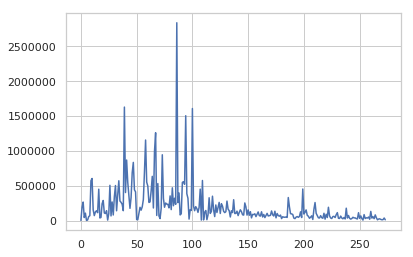

array([ 86,  39, 100,  94,  67,  58,  66,  73,  41,  47,  57,  46,  64,
        10, 109,   9,  34,  92,  42,  59,  91,  69,  93,  26,  31,  60,
        82, 199, 107,  16,  48,  63,  49,  40,  88,  95,  43,  33,  80,
       118,  30,  45, 186, 115,  84,  96,  74,  56, 137,  20,  35, 131,
        62,  28,   2,  36, 124,  61, 210,  87, 147,  76, 126,  19,  77,
        78,  37,  85, 121,  83, 101, 127, 103, 187,  55, 148,   1,  75,
       222,  53, 106, 123,  79,  65, 238,  44,  72, 104, 132, 209,  98,
        81, 119, 143,  11, 202, 150,  54,  99, 112,  23,  38, 102, 133,
        14, 135,  32, 171, 140, 174, 128, 260, 117, 144, 152, 130, 162,
       197,  13, 159, 201, 105, 111, 142, 122, 136, 129, 230,  15, 249,
        21,   4, 218, 211, 167, 116, 139, 125, 138, 176,  22,  25, 188,
        52,  90, 156, 189, 200, 220, 158, 154, 190, 164, 155, 254, 229,
       145, 172, 114, 264,  89,  29, 179, 146, 149, 203, 151, 170, 166,
        68, 240, 141,  12, 177, 160, 169, 212, 215,   8, 223, 20

In [85]:

dim_sum= np.sum(batch_dict[4],axis=0)
plt.plot(dim_sum)
plt.show()
np.flip(np.argsort(dim_sum),axis=0)

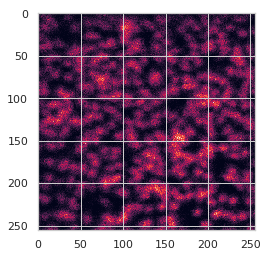

In [86]:
img =batch_dict[4][:,91][np.argsort(pos_dict[4])]
plt.imshow(img.reshape((256,256)))
plt.show()

In [135]:
img.shape

(65536,)

In [50]:
batch_idx=1
cell_idx = cell_dict[batch_idx]
sample_x = batch_dict[batch_idx]
sample_x[cell_idx==20,24]

array([0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0], dtype=int32)

In [233]:
for i in range(4+1,len(batch_dict)+1):
    del batch_dict[i]
    del cell_dict[i]
    del label_dict[i]
    del pos_dict[i]

In [321]:
i=6
del batch_dict[i]
del cell_dict[i]
del label_dict[i]
del pos_dict[i]

In [204]:
len(batch_dict)

4

In [234]:
simu_base = 3
cur_batch_num = len(batch_dict)
simu_data_1,simu_cellidx = simulate_data(simu_base,6,2,0,[61])
batch_dict[cur_batch_num+1] = simu_data_1
# batch_dict[cur_batch_num+1] = 111
cell_dict[cur_batch_num+1] = simu_cellidx
label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])

In [613]:
selected_pixels_idx

NameError: name 'selected_pixels_idx' is not defined

In [449]:
simu_data_1.shape

(66138, 274)

In [5]:
get_train_data([3,5],'median','l1')

NameError: name 'get_train_data' is not defined

In [4]:
# 有label情况的处理

# 1.147 0.025
def get_train_data(batch_num_list,mode,norm):
#     mode分为:'none','median','total'
#     norm分为:'none',standard','l1','l2'
#     batch_num_list = [3,5]
    # 5行
    # 1,2,3,4,5,6
    # batch_num = 4
    top_n_var = 250
    train_x_all = None
    cell_idx_all = None
    cell_type_all = None
    cell_pos_all = None
    batch_idx_all = None
    num_cells_all = 0


    for batch_num in batch_num_list:
        train_x = batch_dict[batch_num]
        # train_x = eval('batch_dict_{norm_type}[batch_num]'.format(norm_type=norm_type))
        # train_x = batch_dict[batch_num]
        cell_idx = cell_dict[batch_num]
        cell_type = label_dict[batch_num]
        cell_pos = pos_dict[batch_num]
        # batch_FE = FE_dict[batch_num]
        cell_related_ind = (cell_idx!=0)

        num_cells = int(np.max(cell_idx))
        # num_cells = 2
        train_x = train_x[cell_related_ind,:]

        cell_idx = cell_idx[cell_related_ind]
        cell_type = cell_type[cell_related_ind]
        # cell_type = np.ones(shape=cell_idx.shape)
        cell_pos = cell_pos[cell_related_ind]





        var_li = []
        normed_var_li = []
        for i in range(train_x.shape[1]):
            cur_col = train_x[:,i]
        #     cur_col= cur_row/np.sum(cur_col)
        #     cur_entropy = entropy(cur_col)
            cur_var = np.var(cur_col)
            cur_normed_var = cur_var/np.mean(cur_col)
        #     entropy_li.append(cur_entropy)
            var_li.append(cur_var)
            normed_var_li.append(cur_normed_var)
        # entropy_li = np.array(entropy_li)
        var_li = np.array(var_li)
        normed_var_li = np.array(normed_var_li)
        sort_ind = np.flip(np.argsort(normed_var_li),axis=0)
        sort_val = np.flip(np.sort(normed_var_li),axis=0)
#         plt.plot(sort_val)
#         plt.show()


    #     train_x = train_x/np.percentile(train_x,80,axis=1,keepdims=True)
    #     train_x = np.log(train_x+1)


        if train_x_all is None:
            train_x_all = train_x
        else:
            train_x_all = np.vstack([train_x_all,train_x])
        if cell_idx_all is None:
            cell_idx_all = cell_idx
        else:
            cell_idx_all = np.hstack([cell_idx_all,cell_idx+np.max(cell_idx_all)])
        if cell_type_all is None:
            cell_type_all = cell_type
        else:
            cell_type_all = np.hstack([cell_type_all,cell_type])
        if cell_pos_all is None:
            cell_pos_all = cell_pos
        else:
            cell_pos_all = np.hstack([cell_pos_all,cell_pos])
        if batch_idx_all is None:
            batch_idx_all = batch_num*np.ones(shape=(cell_idx.shape))
        else:
            batch_idx_all = np.hstack([batch_idx_all,batch_num*np.ones(shape=(cell_idx.shape))])


    train_x = train_x_all
    cell_idx = cell_idx_all
    cell_type = cell_type_all
    cell_pos = cell_pos_all
    batch_idx = batch_idx_all
    num_cells = np.max(cell_idx)
    if mode=='none':
        train_x = train_x
    elif mode=='median':
        train_x = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
        train_x = np.log(train_x+1)
    elif mode=='total':
        train_x = train_x/np.sum(train_x,axis=1,keepdims=True)
        train_x = np.log(train_x+1)
    
    if norm=='standard':
        train_x = StandardScaler().fit_transform(train_x)
    elif norm=='l1':
        train_x = Normalizer(norm='l1').fit_transform(train_x)
    elif norm=='l2':
        train_x = Normalizer(norm='l2').fit_transform(train_x)
    elif norm=='none':
        train_x = train_x
    
    return train_x,cell_idx,cell_type,cell_pos,batch_idx,num_cells



In [237]:
mean_profile_list = []
for i in range(num_cells):
    mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
mean_profile_list = np.array(mean_profile_list)

In [7]:
_,unique_idx = np.unique(cell_idx,return_index=True)
true_y = cell_type[unique_idx]
np.unique(true_y)

NameError: name 'cell_idx' is not defined

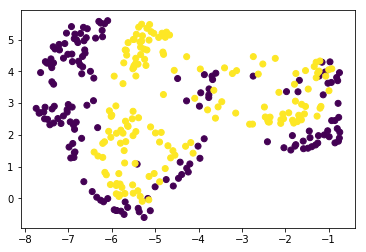

umap mean ARI 1.0


In [250]:
umap_embed_mean = umap.UMAP(metric='correlation').fit_transform(softmax_representation_list[4])
umap_mean_kmeans_pred = KMeans(4).fit_predict(mean_profile_list)
umap_mean_rcc_pred = rcc.RccCluster(measure='euclidean',verbose=0,clustering_threshold=0.1).fit(mean_profile_list)
show_pred = true_y
plt.scatter(umap_embed_mean[:,0],umap_embed_mean[:,1],c=show_pred)
plt.show()
print('umap mean ARI {score}'.format(score=metrics.adjusted_mutual_info_score(show_pred,true_y)))

# 画一个图说明mean的效果受修改的那个维度的magnitude的影响，softmax虽然在修改不多的情况下也不好分，但比mena好很多
# 很小的修改导致mean分不好，是因为修改程度小于本身的类内差异，而softmax对更小的修改程度也敏感，这不能靠聚类准确性度量了，只能靠separate程度度量，或者knn

In [130]:
import keras
from keras.constraints import *
from keras.regularizers import *
from keras.layers import *

from keras.initializers import *
activa = 'relu'
dp_rate = 0.5
low_dim = 128
l2_penalty = 0
l1_penalty = 1e-5
use_bias = False
def modi_softmax(args):
    t =1
    pixel_embed,nuclei_embed = args
    
    
    
    pixel_embed = pixel_embed[:,None]
#     pixel_embed = K.l2_normalize(pixel_embed,axis=-1)
#     nuclei_embed = K.l2_normalize(nuclei_embed,axis=-1)
    
#     print('pixel_embed',pixel_embed.shape)
#     print('nuclei_embed',nuclei_embed.shape)
    minus_square = (pixel_embed*nuclei_embed/t)
#     minus_square = K.square(pixel_embed-nuclei_embed)
#     print('minus_square',minus_square.shape)
    
#     sum_minus_square = -K.sum(minus_square,axis=-1)/t
    sum_minus_square = K.sum(minus_square,axis=-1)
#     norm_exp = K.softmax(sum_minus_square)
    return sum_minus_square
    
#     print('norm_exp',norm_exp)
    
def modi_softeuc(args):
    t = 1
    p = 1
    pixel_embed,nuclei_embed = args
    
    
    
    pixel_embed = pixel_embed[:,None]
#     pixel_embed = K.l2_normalize(pixel_embed,axis=-1)
#     nuclei_embed = K.l2_normalize(nuclei_embed,axis=-1)
    
#     print('pixel_embed',pixel_embed.shape)
#     print('nuclei_embed',nuclei_embed.shape)
#     minus_square = (pixel_embed*nuclei_embed/t)
    minus_square = K.square(pixel_embed-nuclei_embed)
#     minus_square = K.abs(pixel_embed-nuclei_embed)

#     print('minus_square',minus_square.shape)
    
#     sum_minus_square = -K.sqrt(K.sum(minus_square,axis=-1))/t
    sum_minus_square = -K.pow(K.sum(minus_square,axis=-1)/t,p)

#     sum_minus_square = K.sum(minus_square,axis=-1)
    norm_exp = K.softmax(sum_minus_square)
    return norm_exp
    
    print('norm_exp',norm_exp)
def cal_kld(nuclei_embed):
#     计算nuclei embed的arccos矩阵和均匀分布的kl散度
#     也就是arccos矩阵的熵
    pass

def cal_pl_loss(args):
    nuclei_embed,target,pixel_embed = args
#     target = K.expand_dims(target,axis=1)
#     print('nuclei_embed',nuclei_embed.shape)
#     print('target',target.shape)
    target = K.expand_dims(target,axis=1)
#     print('pixel_embed',pixel_embed.shape)
#     print('nuclei_embed',nuclei_embed.shape)
#     print('target',target.shape)
    aaa = K.batch_dot(target,nuclei_embed)
#     print('aaa1',aaa.shape)
#     aaa = K.squeeze(aaa,2)
#     pixel_embed = K.squeeze(pixel_embed,1)
#     aaa = K.squeeze(aaa,1)
    pixel_embed = K.expand_dims(pixel_embed,axis=1)
#     print('aaa',aaa.shape)
#     print('pixel_embed',pixel_embed.shape)
    rst = K.sum(K.square(aaa-pixel_embed),axis=-1,keepdims=False)
    return rst
    
    
####################MLP################################################################################
SIMS_input = Input(shape=(train_x.shape[1],))
target_input = Input(shape=(1,))
dummy_input = Input(shape=(num_cells,))

d1 = Dense(512,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(SIMS_input)
# d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(SIMS_input)
# d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(d1)


d2 = Dense(256,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d1)
# d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d1)
# d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d2)
# d2 = Dense(256,activation='linear',kernel_initializer='random_uniform',use_bias=use_bias)(d2)


# d3 = Dense(64,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d2)
# d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d2)
# d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d3)


d4 = Dense(low_dim,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
# d4 = Dense(num_cells,activation='linear',kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
####################MLP################################################################################
centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center')([d4,centerloss_embed_layer])


embed_layer = Embedding(num_cells,low_dim,input_length=num_cells,embeddings_initializer='random_uniform')(dummy_input)
normalized_logit_layer = Lambda(modi_softmax,name='normalized_logit_layer')([d4,embed_layer])


softmax_out = Activation('softmax',name='softmax')(normalized_logit_layer)

softmax_model = Model([SIMS_input,target_input,dummy_input],[softmax_out,centerloss_out])
softmax_model.compile(optimizer=sgd(),loss=['categorical_crossentropy',lambda y_true,y_pred:y_pred],loss_weights=[1,0])
onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
reset_weights(softmax_model)
dummy_input_data = np.tile(np.arange(num_cells),(train_x.shape[0],1))

# history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=50,shuffle=True,batch_size=64)




# target_input = Input(shape=(num_cells,))
# # embed_layer = Embedding(num_cells,2,input_length=num_cells,embeddings_initializer='random_uniform',embeddings_constraint=keras.constraints.min_max_norm(min_value=1, max_value=10, rate=1.0, axis=0))(dummy_input)
# embed_layer = Embedding(num_cells,low_dim,input_length=num_cells,embeddings_initializer='random_uniform')(dummy_input)

# # softmax_out = Lambda(modi_softmax)([d4,embed_layer])
# softmax_out = Lambda(modi_softmax,name='modified_softmax')([d4,embed_layer])

# centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
# centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center_loss')([d4,centerloss_embed_layer])

# pl_loss_out = Lambda(cal_pl_loss,name='pl_loss')([embed_layer,target_input,d4])


# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform',kernel_constraint=unit_norm(),use_bias=False)(d4)
# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform')(d4)

# # d4 = Lambda(lambda  x: K.l2_normalize(x,axis=1))(d4)
# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform')(d4)


# #下面是euclidean based softmax



# classification_model_singlegpu = Model(inputs=[SIMS_input,dummy_input,target_input],outputs=[softmax_out,pl_loss_out])
# # classification_model = multi_gpu_model(classification_model_singlegpu,gpus=2)
# classification_model_singlegpu.compile(optimizer=nadam(),loss=['categorical_crossentropy',lambda y_true,y_pred: y_pred], loss_weights=[1.,0])

# onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
# # onehot_label1 = onehot_label[:,None,:]
# print('onehot_label',onehot_label.shape)
# # classification_model.fit(train_x,onehot_label,epochs=200,shuffle=True,batch_size=128,sample_weight=cell_center_dist_exp)
# history=classification_model_singlegpu.fit([train_x,np.tile(np.arange(num_cells),(train_x.shape[0],1)),onehot_label],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=500,shuffle=True,batch_size=128)





In [131]:

def get_distil_rep(train_x,num_cells,t_list,epochs=50,verbose=False,activa = 'relu',dp_rate = 0.5,low_dim = 128,l2_penalty = 0,l1_penalty = 1e-5,use_bias = False):
        ####################MLP################################################################################
    SIMS_input = Input(shape=(train_x.shape[1],))
    target_input = Input(shape=(1,))
    dummy_input = Input(shape=(num_cells,))

    d1 = Dense(512,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(d1)


    d2 = Dense(256,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d2)
    # d2 = Dense(256,activation='linear',kernel_initializer='random_uniform',use_bias=use_bias)(d2)


    # d3 = Dense(64,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d3)


    d4 = Dense(low_dim,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
    # d4 = Dense(num_cells,activation='linear',kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
    ####################MLP################################################################################
    centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
    centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center')([d4,centerloss_embed_layer])


    embed_layer = Embedding(num_cells,low_dim,input_length=num_cells,embeddings_initializer='random_uniform')(dummy_input)
    normalized_logit_layer = Lambda(modi_softmax,name='normalized_logit_layer')([d4,embed_layer])


    softmax_out = Activation('softmax',name='softmax')(normalized_logit_layer)

    softmax_model = Model([SIMS_input,target_input,dummy_input],[softmax_out,centerloss_out])
    softmax_model.compile(optimizer=sgd(),loss=['categorical_crossentropy',lambda y_true,y_pred:y_pred],loss_weights=[1,0])
    onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
    
    reset_weights(softmax_model)
    dummy_input_data = np.tile(np.arange(num_cells),(train_x.shape[0],1))
    history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=epochs,shuffle=True,batch_size=64,verbose=verbose)

    
    while np.abs(history.history['loss'][-1]-np.max(history.history['loss']))<=2:
        print('error')
        reset_weights(softmax_model)
        history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=epochs,shuffle=True,batch_size=64,verbose=verbose)

    #             history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=False)
    #         pred_logit = logit_model.predict(train_x)
#         pred_logit = logit_model.predict([train_x,dummy_input_data])
    logit_model = Model([SIMS_input,dummy_input],normalized_logit_layer)
    pred_logit = logit_model.predict([train_x,dummy_input_data])
    rep_list = []
    for t in t_list:
        cur_representation = np.exp(pred_logit/t)
        cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
        cur_representation = np.transpose(cur_representation)
        rep_list.append(cur_representation)
    return rep_list
    # history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=50,shuffle=True,batch_size=64)
# def get_distil_rep(logit_model,t):
    

In [53]:
rep_list = get_distil_rep(train_x,num_cells,[10,30,50])

pixel_embed (?, 1, 128)
nuclei_embed (?, 536, 128)
minus_square (?, 536, 128)
pixel_embed (?, 1, 128)
nuclei_embed (?, 536, 128)
minus_square (?, 536, 128)
Epoch 1/50
20644/20644 [==============================] - 3s 158us/step - loss: 6.2874 - softmax_loss: 6.2874 - center_loss: 71.6139
Epoch 2/50
20644/20644 [==============================] - 2s 91us/step - loss: 6.1746 - softmax_loss: 6.1746 - center_loss: 178.4052
Epoch 3/50
20644/20644 [==============================] - 2s 84us/step - loss: 5.8319 - softmax_loss: 5.8319 - center_loss: 846.1796
Epoch 4/50
20644/20644 [==============================] - 3s 132us/step - loss: 5.5407 - softmax_loss: 5.5407 - center_loss: 1725.9119
Epoch 5/50
20644/20644 [==============================] - 4s 183us/step - loss: 5.3432 - softmax_loss: 5.3432 - center_loss: 2180.5431
Epoch 6/50
20644/20644 [==============================] - 3s 140us/step - loss: 5.1608 - softmax_loss: 5.1608 - center_loss: 2404.5345
Epoch 7/50
20644/20644 [================

In [167]:
logit_model = Model([SIMS_input,dummy_input],normalized_logit_layer)
dummy_input_data = np.tile(np.arange(num_cells),(train_x.shape[0],1))
pred_logit = logit_model.predict([train_x,dummy_input_data])

t = 30
    #             pred_t_softmax = np.exp(pred_logit/t)
    #             pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)

cur_representation = np.exp(pred_logit/t)
cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
cur_representation = np.transpose(cur_representation)


In [155]:
num_cells

160

In [164]:
if True:
    fold_change_list = [1,0.5]
    change_dims_list = [86,100]
    simu_base = 3
    add_batchs = 4
#     batch_num_list = [simu_base,5]
    batch_num_list = list(np.arange(5,add_batchs+5))
    for i in range(4+1,len(batch_dict)+1):
        del batch_dict[i]
        del cell_dict[i]
        del label_dict[i]
        del pos_dict[i]

    for fold_change_i in fold_change_list:
        for fold_change_j in fold_change_list:
            
            cur_batch_num = len(batch_dict)
            simu_data_1,simu_cellidx = simulate_data(simu_base,6,[fold_change_i,fold_change_j],0,change_dims_list)
            batch_dict[cur_batch_num+1] = simu_data_1
            # batch_dict[cur_batch_num+1] = 111
            cell_dict[cur_batch_num+1] = simu_cellidx
            label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
            pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])

    [train_x,cell_idx,cell_type,cell_pos,batch_idx,num_cells] = get_train_data(batch_num_list,'none','none')
    _,unique_idx = np.unique(cell_idx,return_index=True)
    true_y = cell_type[unique_idx]
    np.unique(true_y)
    #mean median
    train_x_median = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
    train_x_median = np.log(train_x_median+1)
    mean_profile_list_median = []
    for i in range(num_cells):
        mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
    mean_profile_list_median = np.array(mean_profile_list_median)


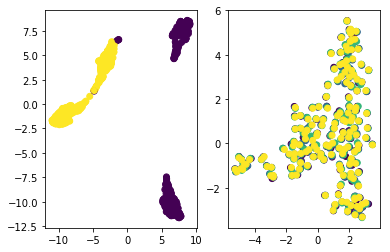

In [174]:
embed_test_modisoft = umap.UMAP(metric='correlation').fit_transform(cur_representation)
embed_test_median = umap.UMAP(metric='euclidean').fit_transform(mean_profile_list_median)
plt.subplot(1,2,1)
plt.scatter(embed_test_modisoft[:,0],embed_test_modisoft[:,1],c=pred_y_SIMLR)
plt.subplot(1,2,2)
plt.scatter(embed_test_median[:,0],embed_test_median[:,1],c=true_y)

plt.show()

In [175]:
1+1

2

In [112]:
def print_adj(true_y,pred_y,name):
    print(name,adjusted_mutual_info_score(true_y,pred_y))

In [169]:
k=4
pred_y_rcc_median = rcc.RccCluster(measure='euclidean',verbose=0,clustering_threshold=0.5).fit(mean_profile_list_median)
pred_y_rcc_softmax = rcc.RccCluster(measure='cosine',verbose=0,clustering_threshold=0.5).fit(cur_representation)

pred_y_ap_median = AffinityPropagation(affinity='euclidean',damping=0.99).fit_predict(mean_profile_list_median)
pred_y_ap_softmax = AffinityPropagation(affinity='euclidean',damping=0.99).fit_predict(cur_representation)
pred_y_kmeans_median = KMeans(k).fit_predict(mean_profile_list_median)
pred_y_kmeans_softmax = KMeans(k).fit_predict(cur_representation)

print_adj(true_y,pred_y_kmeans_median,'km_median')
print_adj(true_y,pred_y_kmeans_softmax,'km_softmax')
print_adj(true_y,pred_y_rcc_median,'rcc_median')
print_adj(true_y,pred_y_rcc_softmax,'rcc_softmax')
print_adj(true_y,pred_y_ap_median,'ap_median')
print_adj(true_y,pred_y_ap_softmax,'ap_softmax')


rcc_median 0.0
rcc_softmax 0.0
ap_median 0.559629051994
ap_softmax 0.522093952086
km_median 0.000355115400337
km_softmax 0.464264053187


In [180]:
k=4.0
pred_y_SIMLR = SIMLR(cur_representation,k)
pred_y_SC3 = SC3(cur_representation,k)
pred_y_SIMLR_median = SIMLR(mean_profile_list_median,k)
pred_y_SC3_median = SC3(mean_profile_list_median,k)

pred_y_uh = hdbscan.HDBSCAN(min_cluster_size=10).fit_predict(embed_test_modisoft)
pred_y_umap_SIMLR = SIMLR(embed_test_modisoft,k)
pred_y_umap_SC3 = SC3(embed_test_modisoft,k)
print('SIMLR',adjusted_mutual_info_score(pred_y_SIMLR,true_y))
print('SC3',adjusted_mutual_info_score(pred_y_SC3,true_y))
print_adj(true_y,pred_y_SIMLR_median,'SIMLR_median')
print_adj(true_y,pred_y_SC3_median,'SC3_median')
print_adj(true_y,pred_y_uh,'umap_hdbscan_softmax')
print('umap',adjusted_mutual_info_score(pred_y_umap,true_y))
print('umap_SIMLR',adjusted_mutual_info_score(pred_y_umap_SIMLR,true_y))
print('umap_SC3',adjusted_mutual_info_score(pred_y_umap_SC3,true_y))

SIMLR 0.900731649369
SC3 0.686898902254
SIMLR_median -0.00515038085672
SC3_median -0.0040652779191
umap_hdbscan_softmax 0.839091682016
umap 0.373185812306
umap_SIMLR 0.657689780085
umap_SC3 0.628127962395


In [69]:
def SC3(data_x,k,transformations=['PCA']):
    # data_x = rep
    # k=3
    # transformations = ['PCA','Laplacian']
    k = int(k)
    d_range_low = np.max([np.floor(data_x.shape[0]*0.04),1])
    d_range_high = np.ceil(data_x.shape[0]*0.07)
    d_range = np.arange(d_range_low,d_range_high+1)
    distance_metrics = ['euclidean','pearson','spearman']
    kmeans_input_pool = []
    kmeans_label_list = []
    CM = np.zeros(shape=(data_x.shape[0],data_x.shape[0]))
    for distance_metric in distance_metrics:
        if distance_metric=='euclidean':
            dist_mat = squareform(pdist(data_x,'euclidean'))
        elif distance_metric=='pearson':
            dist_mat = squareform(pdist(data_x,'correlation'))
        elif distance_metric=='spearman':
            dist_mat = 1-spearmanr(np.transpose(data_x))[0]
        for transformation in transformations:
            if transformation=='PCA':
                trans_dist_mat = PCA(n_components=int(d_range_high)).fit_transform(dist_mat)
            elif transformation=='Laplacian':
                simi_mat = np.exp(-dist_mat/(np.max(dist_mat)))
                graph_lap = laplacian(simi_mat,normed=True,return_diag=False)
                eig_value,eig_vector = eig(graph_lap)
                trans_dist_mat = eig_vector[:,np.flip(np.argsort(eig_value),axis=0)[0:int(d_range_high)]]
            for d in d_range:
                cur_input = trans_dist_mat[:,0:int(d)]
                kmeans_input_pool.append(cur_input)
                
                
    if k<-1:
#         如果k=0，就估计一个k,kmax为abs(k)
        silhouette_list = []
        kmax = np.abs(k)
        for ak in range(2,kmax+1):
            for kmeans_input in kmeans_input_pool:
                cur_y = KMeans(ak).fit_predict(kmeans_input)
#                 kmeans_label_list.append(cur_y)
                cur_CM = label2CM(cur_y)
                CM = CM + cur_CM
            CM = CM/np.max(CM)
            y_ak=AgglomerativeClustering(n_clusters=ak,affinity='precomputed',linkage='complete').fit_predict(1-CM)
            silhouette_list.append(silhouette_score(1-CM,metric='precomputed',labels = y_ak))
        silhouette_list = np.array(silhouette_list)
        opt_k = np.argmax(silhouette_list)+2
        y_SC3=AgglomerativeClustering(n_clusters=opt_k,affinity='precomputed',linkage='complete').fit_predict(1-CM)
    elif k>1:
        for kmeans_input in kmeans_input_pool:
            cur_y = KMeans(k).fit_predict(kmeans_input)
            kmeans_label_list.append(cur_y)
            cur_CM = label2CM(cur_y)
            CM = CM + cur_CM
        CM = CM/np.max(CM)
        y_SC3=AgglomerativeClustering(n_clusters=k,affinity='precomputed',linkage='complete').fit_predict(1-CM)
    else:
        print('k error')
        return None
    return y_SC3
def SIMLR(data_x,k):
    data_x = numpy2mat(data_x)
    if k<-1:
#         要估计k
        kmax = np.abs(k)
        ks = list(np.arange(2,kmax+1))
        ks = matlab.double(ks)
        [k1,k2]=eng.Estimate_Number_of_Clusters_SIMLR(data_x,ks,nargout=2)
        opt_k = np.argmax(np.array(k2))+2
    elif k>1:
        opt_k = k
    else:
        print('k error')
        return None
    opt_k = float(opt_k)
    [cur_label, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(data_x,opt_k,10.0,nargout=8)
    y_SIMLR = np.array(cur_label)[:,0]
    return y_SIMLR

In [31]:
eng = matlab.engine.start_matlab()

In [45]:
float(2)

2.0

In [38]:
np.argmax(np.array(k2))

2

In [60]:
a = [1,2,3]
b=[2,3,4]
b.extend(a)

In [126]:
import timeit



In [132]:
def SIMS_cluster(train_x,cell_idx,k):
#     train_x是不经过任何处理的train_x
#     如果k<-1，就取估计一个最好的
#     先准备representation_list
    train_x_original = train_x
    num_cells = np.max(cell_idx)
    representation_list = []
    rep_name_list = []
    print('preparing total mean reprentation...')
    start = timeit.default_timer()
#     先准备一个total
    train_x_total = train_x/np.sum(train_x_original,axis=1,keepdims=True)
    train_x_total = np.log(train_x_total+1)
    mean_profile_list_total = []
    for i in range(num_cells):
        mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
    mean_profile_list_total = np.array(mean_profile_list_total)
    representation_list.append(mean_profile_list_total)
    rep_name_list.append('total_mean')
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)
    #
#     再准备三个median
    perc_list = [50,70,90]
    for perc in perc_list:
        print('preparing {0}percentile median mean reprentation...'.format(perc))
        start = timeit.default_timer()
        train_x_median = train_x/np.percentile(train_x_original,perc,axis=1,keepdims=True)
        train_x_median = np.log(train_x_median+1)
        mean_profile_list_median = []
        for i in range(num_cells):
            mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
        mean_profile_list_median = np.array(mean_profile_list_median)
        representation_list.append(mean_profile_list_median)
        rep_name_list.append('{0}median_mean'.format(perc))
        
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)
    
#     再准备distill
    print('preparing SIMS-id reprentation...')
    start = timeit.default_timer()
    rep_list = get_distil_rep(train_x,num_cells,[10,30,50])
    representation_list.extend(rep_list)
    rep_name_list.extend(['10SIMS_id','30SIMS_id','50SIMS_id'])
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)
    label_list = []
    CM_list = []
    label_name_list = []
    for rep_idx in range(len(representation_list)):
        rep = representation_list[rep_idx]
        rep_name = rep_name_list[rep_idx]
        #     先是SC3
        print('SC3 clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        label_SC3 = SC3(rep,k)
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)

        print('SIMLR clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        label_SIMLR = SIMLR(rep,k)
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)

        print('umap_euclidean clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_euc = umap.UMAP(n_components=10,metric='euclidean',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_euc = hdbscan.HDBSCAN().fit_predict(umap_embed_euc)
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)
        
        print('umap_cosine clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_cos = umap.UMAP(n_components=10,metric='cosine',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_cos = hdbscan.HDBSCAN().fit_predict(umap_embed_cos)
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)
        
        print('umap_correlation clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_cor = umap.UMAP(n_components=10,metric='correlation',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_cor = hdbscan.HDBSCAN().fit_predict(umap_embed_cor)
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)
        
        label_list.append(label_SC3)
        CM_list.append(label2CM(label_SC3))
        label_name_list.append(rep_name+'_SC3')
        label_list.append(label_SIMLR)
        CM_list.append(label2CM(label_SIMLR))
        label_name_list.append(rep_name+'_SIMLR')
        label_list.append(label_umap_euc)
        CM_list.append(label2CM(label_umap_euc))
        label_name_list.append(rep_name+'_UEUC')
        label_list.append(label_umap_cos)
        CM_list.append(label2CM(label_umap_cos))
        label_name_list.append(rep_name+'_UCOS')
        label_list.append(label_umap_cor)
        CM_list.append(label2CM(label_umap_cor))
        label_name_list.append(rep_name+'_UCOR')
        
    return label_list,CM_list

        
        
    

In [186]:
np.array(label_list).shape

(6, 536)

In [194]:
eng.quit()
eng = matlab.engine.start_matlab() 
base_clustering_mat = numpy2mat(np.transpose(np.array(label_list)))
resultsLWEA=eng.compute_LWCM(base_clustering_mat,0.5,matlab.double([2,3,4]))

In [192]:
np.array(resultsLWEA).shape

(536, 3)

In [ ]:
def SIMS_cluster(train_x,cell_idx,k):
    start_time = timeit.default_timer()

# k=-8
# if True:
#     train_x是不经过任何处理的train_x
#     如果k<-1，就取估计一个最好的
#     先准备representation_list
    train_x_original = train_x
    num_cells = np.max(cell_idx)
    representation_list = []
    rep_name_list = []
    print('preparing total mean reprentation...')
    start = timeit.default_timer()
#     先准备一个total
    train_x_total = train_x/np.sum(train_x_original,axis=1,keepdims=True)
    train_x_total = np.log(train_x_total+1)
    mean_profile_list_total = []
    for i in range(num_cells):
        mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
    mean_profile_list_total = np.array(mean_profile_list_total)
    representation_list.append(mean_profile_list_total)
    rep_name_list.append('total_mean')
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)
    #
#     再准备三个median
    perc_list = [50,70,90]
    for perc in perc_list:
        print('preparing {0}percentile median mean reprentation...'.format(perc))
        start = timeit.default_timer()
        train_x_median = train_x/np.percentile(train_x_original,perc,axis=1,keepdims=True)
        train_x_median = np.log(train_x_median+1)
        mean_profile_list_median = []
        for i in range(num_cells):
            mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
        mean_profile_list_median = np.array(mean_profile_list_median)
        representation_list.append(mean_profile_list_median)
        rep_name_list.append('{0}median_mean'.format(perc))
        
        stop = timeit.default_timer()
        print('done! Time cost: ',stop-start)
    
#     再准备distill
    print('preparing SIMS-id reprentation...')
    start = timeit.default_timer()
    rep_list = get_distil_rep(train_x,num_cells,[10,30,50])
    representation_list.extend(rep_list)
    rep_name_list.extend(['10SIMS_id','30SIMS_id','50SIMS_id'])
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)
    label_list = []
    CM_list = []
    label_name_list = []
    label_ari_list = []
    for rep_idx in range(len(representation_list)):
        rep = representation_list[rep_idx]
        rep_name = rep_name_list[rep_idx]
        #     先是SC3
        print('SC3 clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        label_SC3 = SC3(rep,k)
        stop = timeit.default_timer()
        ari = adjusted_mutual_info_score(true_y,label_SC3)
        label_ari_list.append(ari)
        print('done! Time cost: ',stop-start,'ari: ',ari,'k: ',np.unique(label_SC3))

        print('SIMLR clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        label_SIMLR = SIMLR(rep,k)
        stop = timeit.default_timer()
        ari = adjusted_mutual_info_score(true_y,label_SIMLR)
        label_ari_list.append(ari)
        print('done! Time cost: ',stop-start,'ari: ',ari,'k: ',np.unique(label_SIMLR))

        print('umap_euclidean clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_euc = umap.UMAP(n_components=10,metric='euclidean',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_euc = hdbscan.HDBSCAN().fit_predict(umap_embed_euc)
        stop = timeit.default_timer()
        ari = adjusted_mutual_info_score(true_y,label_umap_euc)
        label_ari_list.append(ari)
        print('done! Time cost: ',stop-start,'ari: ',ari,'k: ',np.unique(label_umap_euc))
        
        print('umap_cosine clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_cos = umap.UMAP(n_components=10,metric='cosine',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_cos = hdbscan.HDBSCAN().fit_predict(umap_embed_cos)
        stop = timeit.default_timer()
        ari = adjusted_mutual_info_score(true_y,label_umap_cos)
        label_ari_list.append(ari)
        print('done! Time cost: ',stop-start,'ari: ',ari,'k: ',np.unique(label_umap_cos))
       
        print('umap_correlation clustering in {0}...'.format(rep_name))
        start = timeit.default_timer()
        umap_embed_cor = umap.UMAP(n_components=10,metric='correlation',n_neighbors=30,min_dist=0).fit_transform(rep)
        label_umap_cor = hdbscan.HDBSCAN().fit_predict(umap_embed_cor)
        stop = timeit.default_timer()
        ari = adjusted_mutual_info_score(true_y,label_umap_cor)
        label_ari_list.append(ari)
        print('done! Time cost: ',stop-start,'ari: ',ari,'k: ',np.unique(label_umap_cor))
       
        label_list.append(label_SC3)
        CM_list.append(label2CM(label_SC3))
        label_name_list.append(rep_name+'_SC3')
        
        label_list.append(label_SIMLR)
        CM_list.append(label2CM(label_SIMLR))
        label_name_list.append(rep_name+'_SIMLR')
        
        label_list.append(label_umap_euc)
        CM_list.append(label2CM(label_umap_euc))
        label_name_list.append(rep_name+'_UEUC')
        
        label_list.append(label_umap_cos)
        CM_list.append(label2CM(label_umap_cos))
        label_name_list.append(rep_name+'_UCOS')
        
        label_list.append(label_umap_cor)
        CM_list.append(label2CM(label_umap_cor))
        label_name_list.append(rep_name+'_UCOR')
        
#     return label_list,CM_list
    ari_mat = np.zeros(shape=(len(label_list),len(label_list)))
    for label_idx_i in range(len(label_list)):
        for label_idx_j in range(len(label_list)):
            if label_idx_i==label_idx_j:
                cur_ari = label_ari_list[label_idx_i]
            else:
                cur_ari = adjusted_mutual_info_score(label_list[label_idx_i],label_list[label_idx_j])
            ari_mat[label_idx_i,label_idx_j] = cur_ari



    print('locally weighted consensus clustering...')
    start = timeit.default_timer()
    base_clustering_mat = numpy2mat(np.transpose(np.array(label_list)))
    consensus_k_range = list(np.arange(2,np.abs(k)+1))
    resultsLWEA=eng.compute_LWCM(base_clustering_mat,0.5,matlab.double(consensus_k_range))
    resultsLWEA = np.array(resultsLWEA)
    # num_cells*num_labeling
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)


    # 选择最佳的labeling
    print('choosing optimal k...')
    start = timeit.default_timer()
    average_ari_list = np.zeros(shape=(resultsLWEA.shape[1],))
    for i in range(resultsLWEA.shape[1]):
        cur_k_labeling = resultsLWEA[:,i]
        for base_label in label_list:
            cur_ari = adjusted_mutual_info_score(cur_k_labeling,base_label)
            average_ari_list[i]+=cur_ari
        average_ari_list[i]/=len(label_list)
    optimal_k_idx = np.argmax(average_ari_list)
    optimal_labeling = resultsLWEA[:,optimal_k_idx]
    stop = timeit.default_timer()
    print('done! Time cost: ',stop-start)
    print('optimal k: ',optimal_k_idx+2)
    stop_time = timeit.default_timer()
    print(stop_time-start_time)
    print('final ari: ',adjusted_mutual_info_score(optimal_labeling,true_y))

    return resultsLWEA,optimal_k_idx

preparing total mean reprentation...
done! Time cost:  0.354878943413496
preparing 50percentile median mean reprentation...
done! Time cost:  4.020975257270038
preparing 70percentile median mean reprentation...
done! Time cost:  0.6884130537509918
preparing 90percentile median mean reprentation...
done! Time cost:  0.6303655309602618
preparing SIMS-id reprentation...
done! Time cost:  101.5890491520986
SC3 clustering in total_mean...
done! Time cost:  1509.8484235759825 ari:  -0.00112529157671 k:  [0 1]
SIMLR clustering in total_mean...
done! Time cost:  62.76566544827074 ari:  0.163387713087 k:  [ 1.  2.  3.  4.  5.  6.  7.]
umap_euclidean clustering in total_mean...
done! Time cost:  5.427671929821372 ari:  -0.00116645383943 k:  [0 1]
umap_cosine clustering in total_mean...
done! Time cost:  5.518102778121829 ari:  -0.00381076000641 k:  [-1  0  1  2]
umap_correlation clustering in total_mean...
done! Time cost:  5.532532988116145 ari:  0.577926972429 k:  [-1  0  1  2  3  4  5  6  7  

In [259]:
base_clustering_mat = numpy2mat(np.transpose(np.array(label_list[-14:])))
consensus_k_range = list(np.arange(2,np.abs(k)+1))

resultsLWEA=eng.compute_LWCM(base_clustering_mat,0.5,matlab.double(consensus_k_range))
resultsLWEA = np.array(resultsLWEA)
# num_cells*num_labeling
stop = timeit.default_timer()
print('done! Time cost: ',stop-start)


# 选择最佳的labeling
print('choosing optimal k...')
start = timeit.default_timer()
average_ari_list = np.zeros(shape=(resultsLWEA.shape[1],))
for i in range(resultsLWEA.shape[1]):
    cur_k_labeling = resultsLWEA[:,i]
    for base_label in label_list[-14:]:
        cur_ari = adjusted_mutual_info_score(cur_k_labeling,base_label)
        average_ari_list[i]+=cur_ari
    average_ari_list[i]/=len(label_list)
optimal_k_idx = np.argmax(average_ari_list)
optimal_labeling = resultsLWEA[:,optimal_k_idx]
stop = timeit.default_timer()
print('done! Time cost: ',stop-start)
print('optimal k: ',optimal_k_idx+2)
stop_time = timeit.default_timer()
print(stop_time-start_time)
print('final ari: ',adjusted_mutual_info_score(optimal_labeling,true_y))

    

done! Time cost:  124.47017067670822
choosing optimal k...
done! Time cost:  0.16286651883274317
optimal k:  5
51535.285310827196
final ari:  0.862167623267


In [271]:
label_ari_list

[-0.0011252915767124823,
 0.16338771308696193,
 -0.0011664538394327551,
 -0.0038107600064113383,
 0.57792697242910873,
 -0.0011492781071803459,
 -0.0046908399252939418,
 -0.020554355583663707,
 -0.018728342038084631,
 -0.016957327618587932,
 -0.0011497782895823247,
 -0.0068208923415182176,
 -0.017690508873842974,
 -0.023105610703944526,
 -0.02186358572073184,
 -0.0011650046604241115,
 -0.0062803444960107691,
 0.27767370087995474,
 0.26645277589242372,
 0.29024984560816641,
 0.025680659481643123,
 0.74434851641475153,
 0.39492709545972182,
 0.51274782041728861,
 0.59504144509471912,
 0.070473309259557776,
 0.52630688233355205,
 0.48232980274268578,
 0.84802475710932779,
 0.67802096749007912,
 0.3353770675829052,
 0.47409423080022972,
 0.52023145535315019,
 0.62921244530113796,
 0.66959581832049053]

In [266]:
k = 2
print(adjusted_mutual_info_score(resultsLWEA[:,k],true_y))
# print(adjusted_mutual_info_score(label_list_CSPA[k],true_y))

0.712433642031


# label_ari_list

In [203]:
print('final ari: ',adjusted_mutual_info_score(optimal_labeling,true_y))


final ari:  0.70592490943


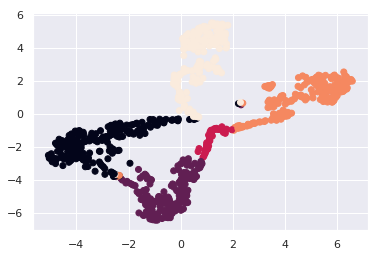

In [270]:
test_embed = umap.UMAP().fit_transform(rep_list[0])
plt.scatter(test_embed[:,0],test_embed[:,1],c=resultsLWEA[:,3])
plt.show()

In [183]:
adjusted_mutual_info_score(label_list[4],true_y)

0.65362704760376245

In [172]:
len(label_list)

35

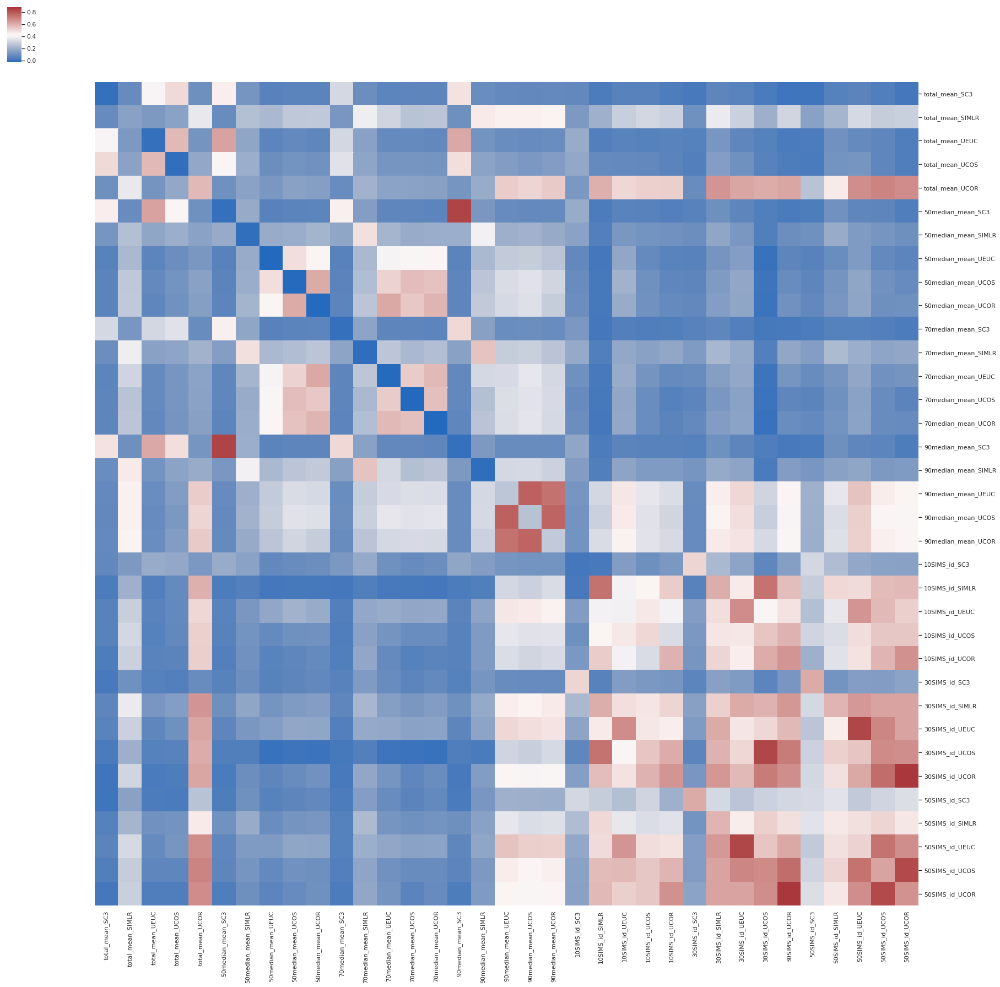

In [226]:
sns.clustermap(figsize=(30,30),row_cluster=False,data=pd.DataFrame(ari_mat),col_cluster=False,cmap="vlag",square=True,yticklabels=label_name_list,xticklabels=label_name_list)
plt.show()


In [133]:
[label_list,CM_list] = SIMS_cluster(train_x,cell_idx,-8)

preparing total mean reprentation...
done! Time cost:  0.9774690577760339
preparing 50percentile median mean reprentation...
done! Time cost:  0.8627174692228436
preparing 70percentile median mean reprentation...
done! Time cost:  0.576295830309391
preparing 90percentile median mean reprentation...
done! Time cost:  0.5727843698114157
preparing SIMS-id reprentation...
done! Time cost:  75.45185619406402
SC3 clustering in total_mean...
done! Time cost:  307.65034907404333
SIMLR clustering in total_mean...
done! Time cost:  39.34472347982228
umap_euclidean clustering in total_mean...
done! Time cost:  3.452059356495738
umap_cosine clustering in total_mean...
done! Time cost:  2.9421624345704913
umap_correlation clustering in total_mean...
done! Time cost:  2.88250479940325
SC3 clustering in 50median_mean...
done! Time cost:  302.2555356780067
SIMLR clustering in 50median_mean...
done! Time cost:  35.28049906343222
umap_euclidean clustering in 50median_mean...
done! Time cost:  2.79923571

KeyboardInterrupt: 

In [245]:
from functools import *
CM = reduce(lambda x,y:x+y,CM_list[-14:])

In [246]:
CM_list_bak = CM_list
CM_list = [CM]*6

In [247]:
CM_list[0][0,0]

198.0

<Figure size 1080x5400 with 0 Axes>

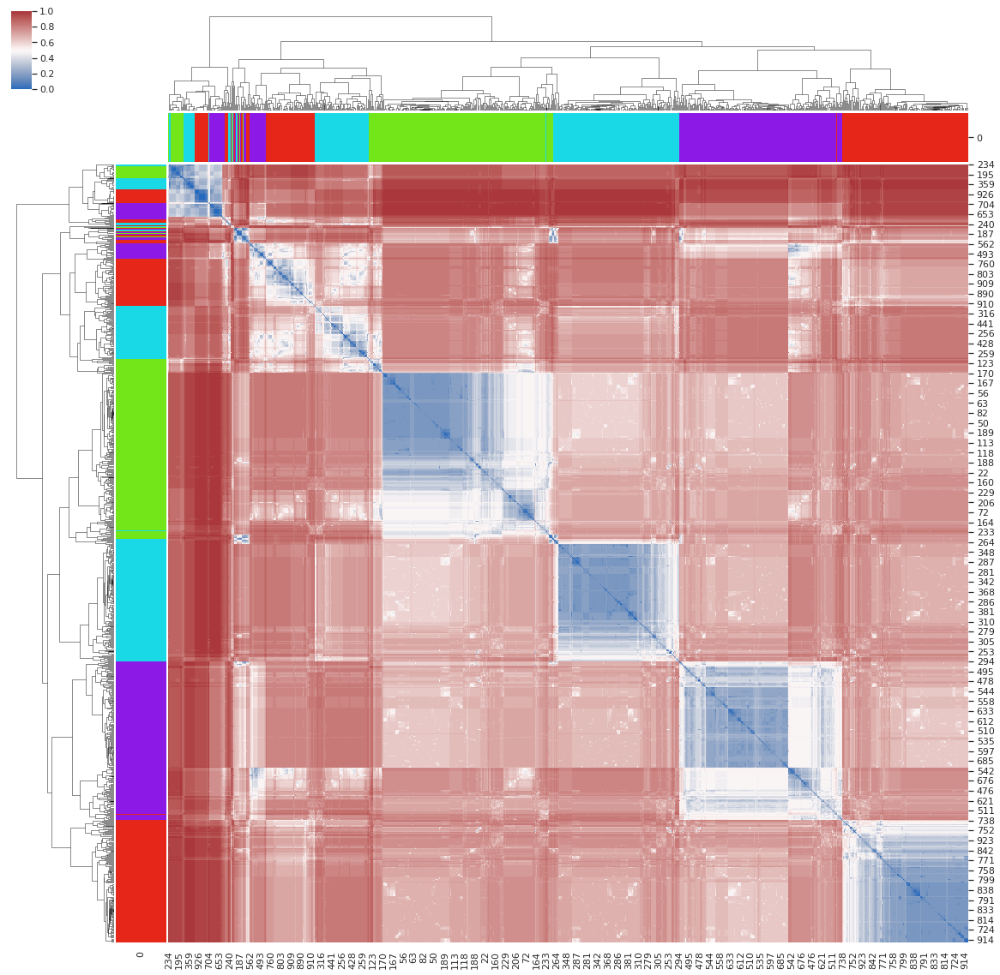

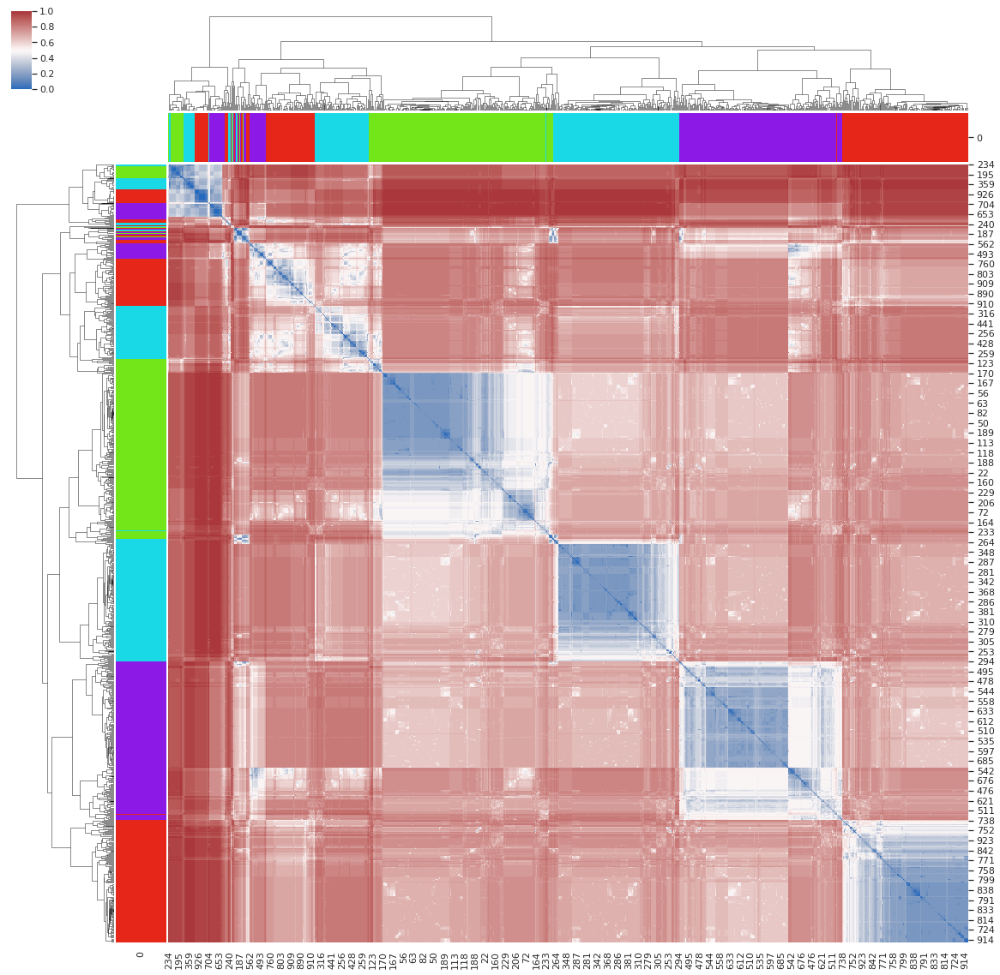

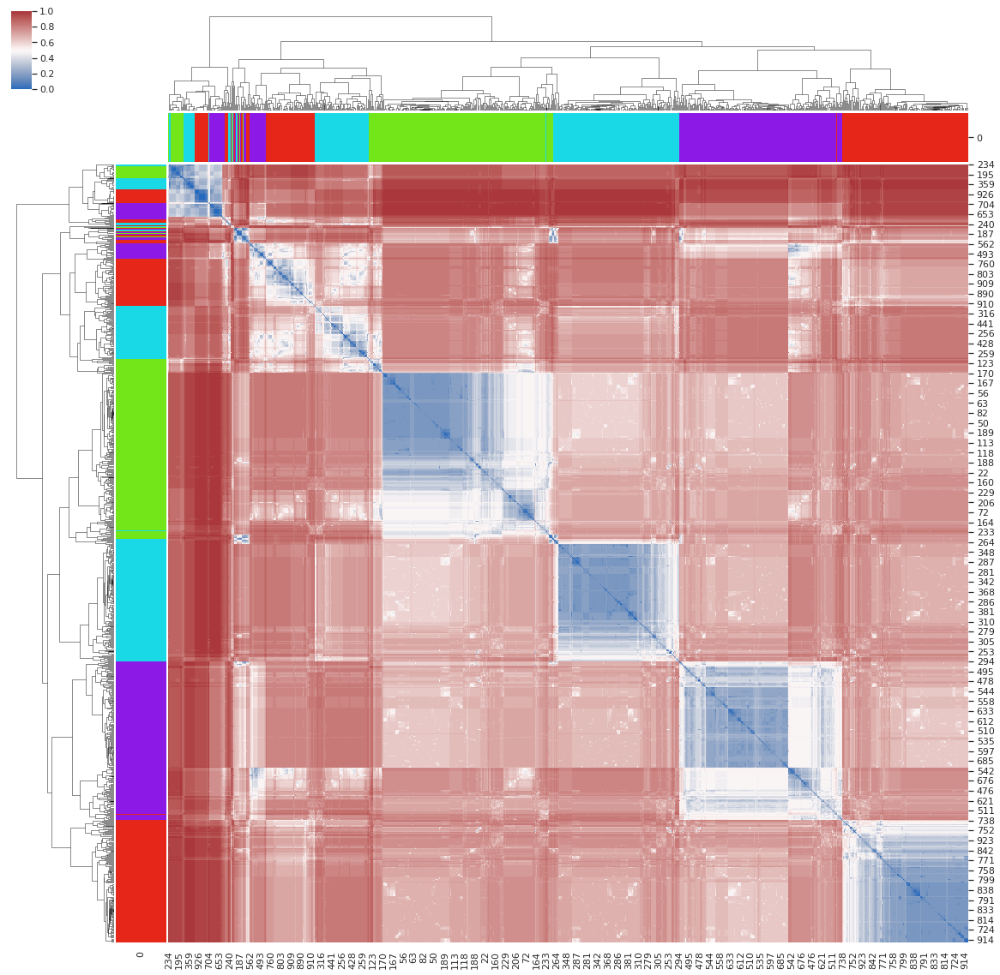

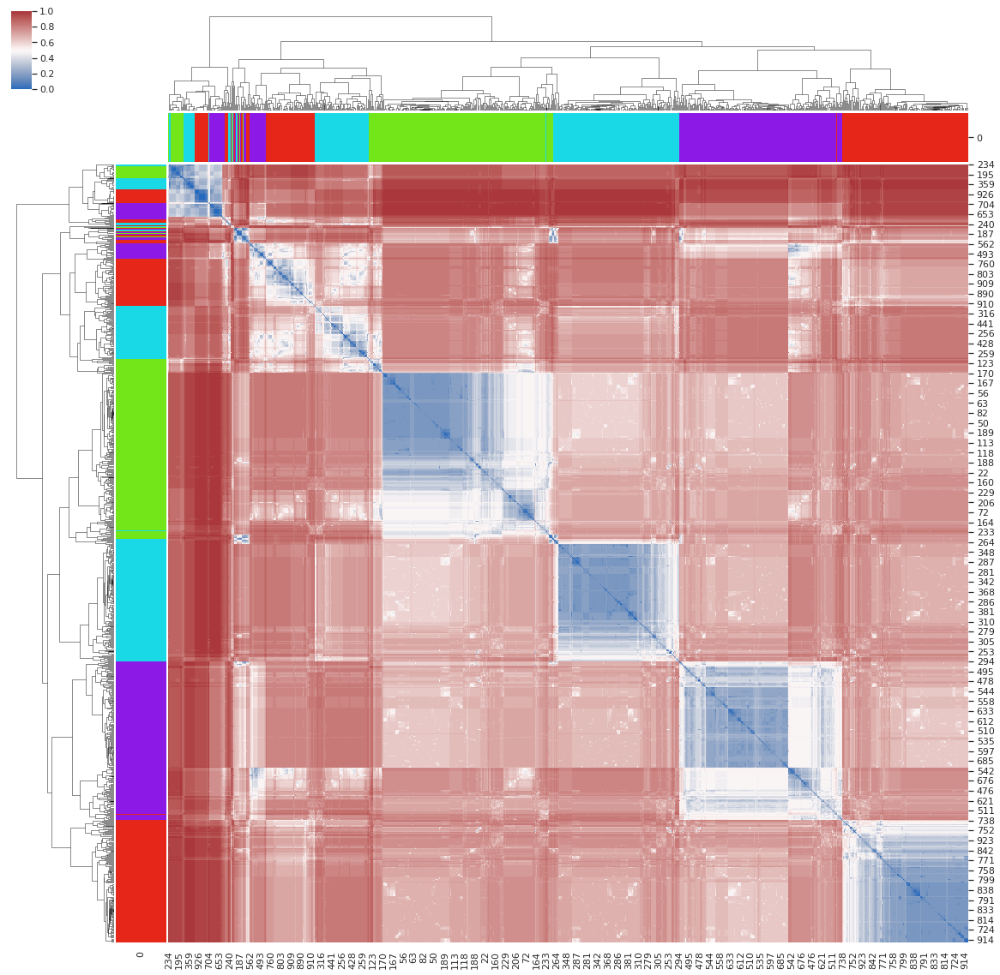

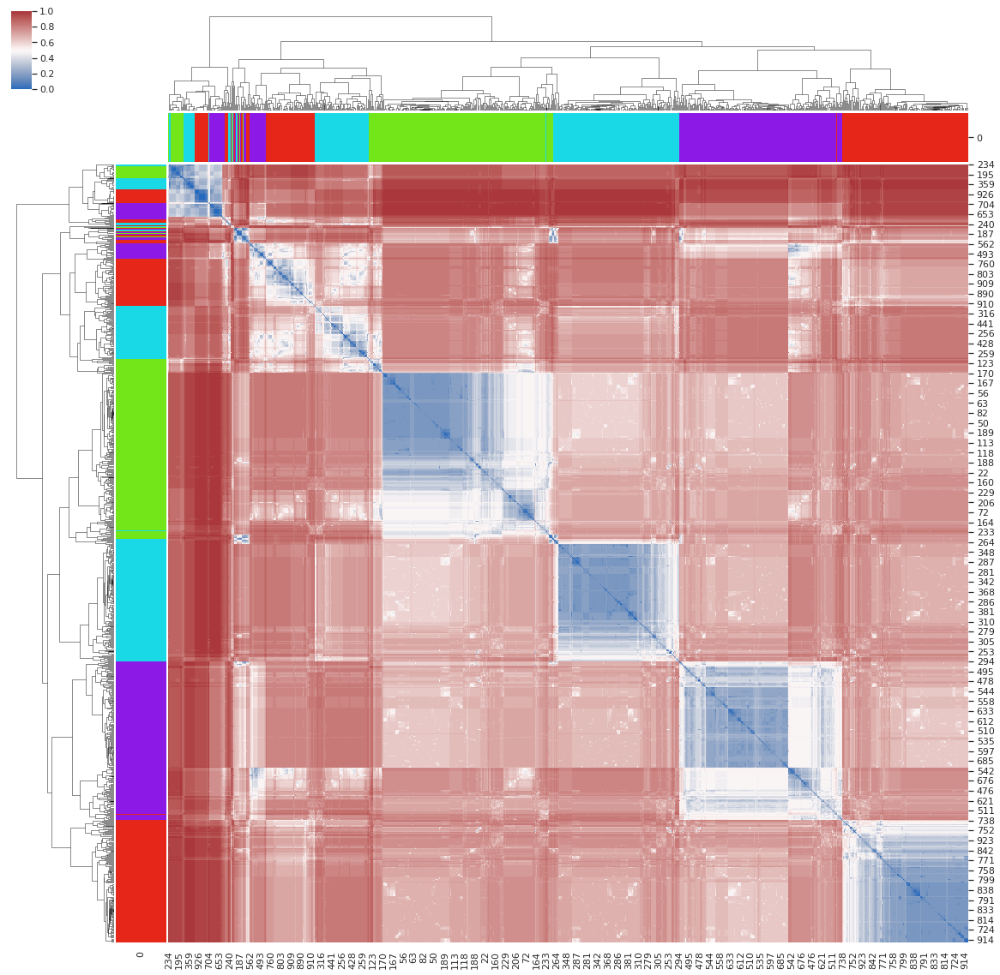

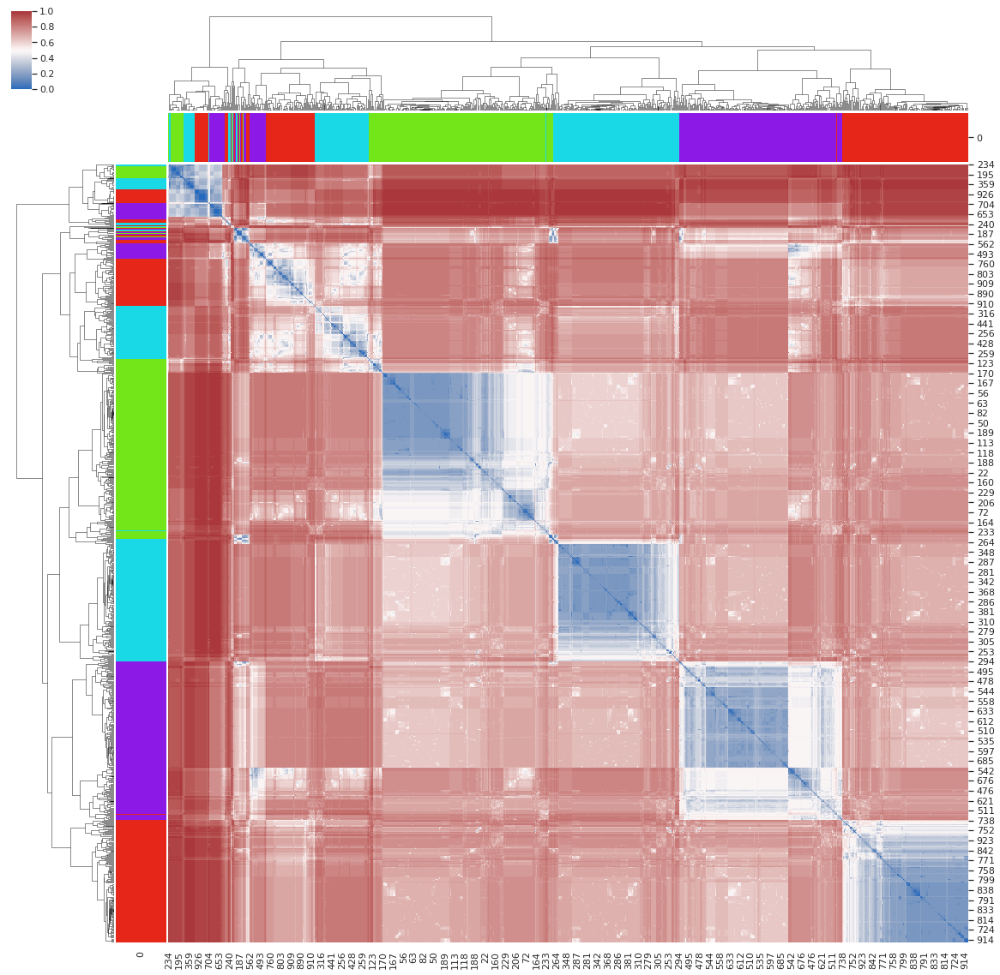

In [231]:

sns.set()
# 绿的是hela红的是a549
# n_cluster_li = [2,3,4,5,6]
# # fig = plt.figure(figsize=(5,25))
# for CM in CM_list:
#     CM = CM/np.max(CM)
#     fig = plt.figure(figsize=(15,75))
    
#     for n_cluster in n_cluster_li:
#         consensus_label = SpectralClustering(n_clusters=n_cluster,affinity='precomputed').fit_predict(CM)
#         label_sort = np.argsort(consensus_label)
#         plt.subplot(1,5,n_cluster-1)
#         plt.imshow(CM[:,label_sort][label_sort,:])
# #     plt.hist(CM[:])
#     plt.show()
n_cluster_li = [2,3,4,5,6,7]
# n_cluster_li = [4]
fig = plt.figure(figsize=(15,75))
label_list_CSPA = []
order_list = []
# fig = plt.figure(figsize=(5,25))
for i in range(len(CM_list)):
    CM = CM_list[i]
    CM = CM/np.max(CM)
#     plt.subplot(1,5,i+1)
    linkage_mat = hc.linkage(1-CM, method='complete',optimal_ordering=True)

    consensus_label=AgglomerativeClustering(n_clusters=i+2,affinity='precomputed',linkage='complete').fit_predict(1-CM)
#     consensus_label = SpectralClustering(n_clusters=i+2,affinity='precomputed').fit_predict(CM)
#     consensus_label = hdbscan.HDBSCAN(metric='precomputed').fit_predict(1-CM)
#     consensus_label,linkage_mat=hdbscan.robust_single_linkage(1-CM,cut=0.125,metric='precomputed',k=10)
    
    true_label = consensus_label
    true_label = true_y
    
    data_matrix = pd.DataFrame(1-CM)

#     labels = np.random.random_integers(0,5, size=50)
    lut = dict(zip(set(true_label), sns.hls_palette(len(set(true_label)), l=0.5, s=0.8)))
    row_colors = pd.DataFrame(true_label)[0].map(lut)
    
    
    
    
#     linkage = hc.linkage(sp.distance.squareform(1-CM), method='average')
    
    
    order_list.append(leaves_list(linkage_mat))
#     sns.clustermap(1-CM, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),cmap='Reds')
    sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(20,20),cmap='vlag',row_colors=row_colors,col_colors=row_colors,linewidths=0)
#     sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),row_colors=row_colors,col_colors=row_colors)


    label_list_CSPA.append(consensus_label)
    label_sort = np.argsort(consensus_label)
    
#     plt.imshow(CM[:,label_sort][label_sort,:])
#     plt.hist(CM[:])
#     plt.savefig()
#     plt.savefig('AB-H_CM_k{k}.svg'.format(k=i+2),transparent=True,format='svg')


    plt.show()

In [220]:
np.max(cell_idx)

940

In [219]:
# fold_change_list_all = np.arange(0,2,0.1)
# fold_change_list_all = np.arange(0.7,1.3,0.2)
# fold_change_list_all = np.array([0.3,0.5,1.3,1.5])
if_use_dump_logit = 0
# fold_change_list_all = np.arange(0.1,0.6,0.2)
fold_change_list_all = [0.5]
# fold_change_list_all = np.arange(0,0.5,0.1)
rst_dump_all = {}
if not if_use_dump_logit:
    logit_list_dict = {}
else:
    logit_list_dict=pickle.load(open("/home/yzy/SIMS/celline_simu_k4_againstfoldchange_clusterings_logit_list_dict_5times.pkl","rb"))

for fold_change in fold_change_list_all:
#     fold_change = 2
#     change_dims = [86]
#     simu_base = 3

#     batch_num_list = [simu_base,5]
#     for i in range(4+1,len(batch_dict)+1):
#         del batch_dict[i]
#         del cell_dict[i]
#         del label_dict[i]
#         del pos_dict[i]

#     cur_batch_num = len(batch_dict)
#     simu_data_1,simu_cellidx = simulate_data(simu_base,6,fold_change,0,[61])
#     batch_dict[cur_batch_num+1] = simu_data_1
#     # batch_dict[cur_batch_num+1] = 111
#     cell_dict[cur_batch_num+1] = simu_cellidx
#     label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
#     pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])

#     [train_x,cell_idx,cell_type,cell_pos,batch_idx,num_cells] = get_train_data(batch_num_list,'none','none')
#     _,unique_idx = np.unique(cell_idx,return_index=True)
#     true_y = cell_type[unique_idx]
#     np.unique(true_y)

    fold_change_list = [1,fold_change]
#     batch1
#     change_dims_list = [73,41]
# batch2
#     change_dims_list = [91,92]
# batch3
#     change_dims_list = [84,45]
# batch4
    change_dims_list = [41,47]
    simu_base = 4
    epochs = 50
    add_batchs = 4
#     batch_num_list = [simu_base,5]
    batch_num_list = list(np.arange(5,add_batchs+5))
    for i in range(4+1,len(batch_dict)+1):
        del batch_dict[i]
        del cell_dict[i]
        del label_dict[i]
        del pos_dict[i]

    for fold_change_i in fold_change_list:
        for fold_change_j in fold_change_list:
            
            cur_batch_num = len(batch_dict)
            simu_data_1,simu_cellidx = simulate_data(simu_base,6,[fold_change_i,fold_change_j],0,change_dims_list)
            batch_dict[cur_batch_num+1] = simu_data_1
            # batch_dict[cur_batch_num+1] = 111
            cell_dict[cur_batch_num+1] = simu_cellidx
            label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
            pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])

    [train_x,cell_idx,cell_type,cell_pos,batch_idx,num_cells] = get_train_data(batch_num_list,'none','none')
    [train_x_original,_,_,_,_,_] = get_train_data([simu_base],'none','none')
    train_x_original = np.vstack([train_x_original]*add_batchs)
    _,unique_idx = np.unique(cell_idx,return_index=True)
    true_y = cell_type[unique_idx]
    np.unique(true_y)
 


    # mean_total
    train_x_total = train_x/np.sum(train_x_original,axis=1,keepdims=True)
    train_x_total = np.log(train_x_total+1)
    mean_profile_list_total = []
    for i in range(num_cells):
        mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
    mean_profile_list_total = np.array(mean_profile_list_total)


    #mean median
    train_x_median = train_x/np.percentile(train_x_original,50,axis=1,keepdims=True)
    train_x_median = np.log(train_x_median+1)
    mean_profile_list_median = []
    for i in range(num_cells):
        mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
    mean_profile_list_median = np.array(mean_profile_list_median)



    # mean
    mean_profile_list = []
    for i in range(num_cells):
        mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
    mean_profile_list = np.array(mean_profile_list)


    # tsne_param_list = [10,20,30,40,50]
    # umap_param_list = [5,10,15,20,25,30]
    projection_dim = 100
    n_clusters = 4.0
    mean_variant_list = ['Total_norm','Median_norm','Softmax_t10','Softmax_t30','Softmax_t50']
#     projection_list = ['Non_projection','PCA','TSNE','UMAP']
#     projection_list = ['Non_projection','PCA']
    projection_list = ['Non_projection']
#     clustering_list = ['KMeans','SC3','SIMLR','SSR','RMKKM','ClustRF']
#     clustering_list = ['KMeans','Spectral','SC3','SIMLR','tsne+KMeans','umap+HDBSCAN','AP']
    clustering_list = ['KMeans']
#     clustering_list = ['tsne+KMeans','umap+HDBSCAN','AP','RCC']
    metrics_list = ['AMI','NMI','ARI','KNN']
    # metrics_list = 
    rst_dump = {}
    run_times = 1

    if not if_use_dump_logit:
        logit_list = []
    #     logit_model = Model(SIMS_input,d4)
        logit_model = Model([SIMS_input,dummy_input],normalized_logit_layer)
        dummy_input_data = np.tile(np.arange(num_cells),(train_x.shape[0],1))


        for i in range(run_times):

            reset_weights(softmax_model) 
            print('running {i}th logit for foldchange {fold_change}'.format(i=i,fold_change=fold_change))
    #         history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=0)
            history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=epochs,shuffle=True,batch_size=64)


            while np.abs(history.history['loss'][-1]-np.max(history.history['loss']))<=2:
                print('error')
                reset_weights(softmax_model)
                history=softmax_model.fit([train_x,cell_idx-1,dummy_input_data],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=epochs,shuffle=True,batch_size=64)

    #             history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=False)
    #         pred_logit = logit_model.predict(train_x)
            pred_logit = logit_model.predict([train_x,dummy_input_data])

            logit_list.append(pred_logit)



        logit_list_dict[fold_change] = logit_list
    else:
        logit_list = logit_list_dict[fold_change]



    for _ in range(run_times):
        for mean_variant in mean_variant_list:
            cur_representation = None
            if mean_variant == 'Non_norm':
                cur_representation = mean_profile_list
            elif mean_variant == 'Total_norm':
                cur_representation = mean_profile_list_total
            elif mean_variant == 'Median_norm':
                cur_representation = mean_profile_list_median
            else:
    #             进入softmax领域
                t = float(mean_variant[9:])
    #             pred_t_softmax = np.exp(pred_logit/t)
    #             pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)

                cur_representation = np.exp(logit_list[_]/t)
                cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
                cur_representation = np.transpose(cur_representation)
            if mean_variant not in rst_dump:
                rst_dump[mean_variant] = {}
            for projection in projection_list:
                cur_embed = None
                if projection=='Non_projection':
                    cur_embed = cur_representation
                elif projection=='PCA':
                    cur_embed = PCA(n_components=projection_dim).fit_transform(cur_representation)
                elif projection=='TSNE':
                    cur_embed = TSNE(n_components=projection_dim,metric='euclidean',verbose=False,method='exact').fit_transform(cur_representation)
                elif projection=='UMAP':
                    cur_embed = umap.UMAP(n_components=projection_dim,metric='euclidean',verbose=False).fit_transform(cur_representation)
                
                if projection not in rst_dump[mean_variant]:
                    rst_dump[mean_variant][projection] = {}
#                 clustering_list = ['KMeans','SC3','SIMLR','SSR','RMKKM','ClustRF']
                
                for clustering in clustering_list:
                    print('running {0}'.format(clustering))
                    if clustering=='KMeans':
                        cur_label = KMeans(int(n_clusters)).fit_predict(cur_embed)
                    if clustering=='Spectral':
                        cur_label = SpectralClustering(int(n_clusters)).fit_predict(cur_embed)
                    elif clustering=='SC3':
                        cur_label = SC3(cur_embed,n_clusters)
                    elif clustering=='SIMLR':
                        cur_label = SIMLR(cur_embed,n_clusters)
                    elif clustering=='SSR':
                        cur_label = SSR(cur_embed,n_clusters)
                    elif clustering=='RMKKM':
                        cur_label = RMKKM(cur_embed,n_clusters)
                    elif clustering=='ClustRF':
                        cur_label = ClustRF(cur_embed,n_clusters)
                    elif clustering=='tsne+KMeans':
                        tsne_embed_euc = TSNE(metric='euclidean',n_components=10,method='exact',verbose=1).fit_transform(cur_embed)
                        cur_label_euc =KMeans(int(n_clusters)).fit_predict(tsne_embed_euc)
                        cur_score_euc = metrics.adjusted_mutual_info_score(true_y,cur_label_euc)
                        tsne_embed_cos = TSNE(metric='cosine',n_components=10,method='exact',verbose=1).fit_transform(cur_embed)
                        cur_label_cos =KMeans(int(n_clusters)).fit_predict(tsne_embed_cos)
                        cur_score_cos = metrics.adjusted_mutual_info_score(true_y,cur_label_cos)
                        if cur_score_euc>=cur_score_cos:
                            print('tsne euc win')
                            cur_label = cur_label_euc
                        else:
                            print('tsne cos win')
                            cur_label = cur_label_cos
                    elif clustering=='umap+HDBSCAN':
                        umap_embed_euc = umap.UMAP(n_components=10,metric='euclidean',n_neighbors=30,min_dist=0).fit_transform(cur_embed)
                        cur_label_euc = hdbscan.HDBSCAN().fit_predict(umap_embed_euc)
                        cur_score_euc = metrics.adjusted_mutual_info_score(true_y,cur_label_euc)
                        umap_embed_cos = umap.UMAP(n_components=10,metric='cosine',n_neighbors=30,min_dist=0).fit_transform(cur_embed)
                        cur_label_cos = hdbscan.HDBSCAN().fit_predict(umap_embed_cos)
                        cur_score_cos = metrics.adjusted_mutual_info_score(true_y,cur_label_cos)
                        if cur_score_euc>=cur_score_cos:
                            print('umap euc win')
                            cur_label = cur_label_euc
                        else:
                            print('umap cos win')
                            cur_label = cur_label_cos
                    elif clustering=='AP':
                        cur_label = AffinityPropagation(damping=0.95).fit_predict(cur_embed)
                    elif clustering=='RCC':
                        cur_label_euc = rcc.RccCluster(measure='euclidean',verbose=0,clustering_threshold=0.5).fit(cur_embed)
                        cur_score_euc = metrics.adjusted_mutual_info_score(true_y,cur_label_euc)
                        cur_label_cos = rcc.RccCluster(measure='cosine',verbose=0,clustering_threshold=0.5).fit(cur_embed)
                        cur_score_cos = metrics.adjusted_mutual_info_score(true_y,cur_label_cos)
                        if cur_score_euc>=cur_score_cos:
                            print('rcc euc win')
                            cur_label = cur_label_euc
                        else:
                            print('rcc cos win')
                            cur_label = cur_label_cos
                        
                        
                    
                    if clustering not in rst_dump[mean_variant][projection]:
                        rst_dump[mean_variant][projection][clustering] = {}
                
                
                
#                 [cur_label, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(numpy2mat(cur_embed),n_clusters,10.0,nargout=8)
#                 cur_label = np.array(cur_label)[:,0]
                    for metric in metrics_list:
                        cur_rst = None
    #                     cur_label = KMeans(n_clusters=n_clusters).fit_predict(cur_embed)


                        if metric=='AMI':
                            cur_rst = metrics.adjusted_mutual_info_score(true_y,cur_label)
                        elif metric=='NMI':
                            cur_rst = metrics.normalized_mutual_info_score(true_y,cur_label)
                        elif metric=='ARI':
                            cur_rst = metrics.adjusted_rand_score(true_y,cur_label)
                        elif metric=='KNN':
                            kf = StratifiedKFold(n_splits=10,shuffle=True)
                            knn_euc = KNeighborsClassifier(metric='euclidean')
                            cur_rst_euc=cross_val_score(knn_euc, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                            knn_cos = KNeighborsClassifier(metric='cosine')
                            cur_rst_cos=cross_val_score(knn_cos, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                            if np.mean(cur_rst_euc>=cur_rst_cos):
                                print('knn euc win')
                                cur_rst = cur_rst_euc
                            else:
                                print('knn cos win')
                                cur_rst = cur_rst_cos
                            
                        if metric not in rst_dump[mean_variant][projection][clustering]:
                            rst_dump[mean_variant][projection][clustering][metric] = [cur_rst]
                        else:
                            rst_dump[mean_variant][projection][clustering][metric].append(cur_rst)
                        print(str(fold_change),str(_),mean_variant,projection,clustering,metric,'|',cur_rst)
    rst_dump_all[fold_change] = rst_dump

# rst_dump_all_save = '/home/yzy/SIMS/celline_simu_k4_0.5foldchange_base4.pkl'
# pickle.dump(rst_dump_all,open(rst_dump_all_save,"wb"))









running 0th logit for foldchange 0.5


ValueError: Error when checking input: expected input_18 to have shape (536,) but got array with shape (940,)

In [8]:
20644/4

5161.0

In [241]:
cur_representation = np.exp(logit_list_dict[0][0]/1)
cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
cur_representation = np.transpose(cur_representation)

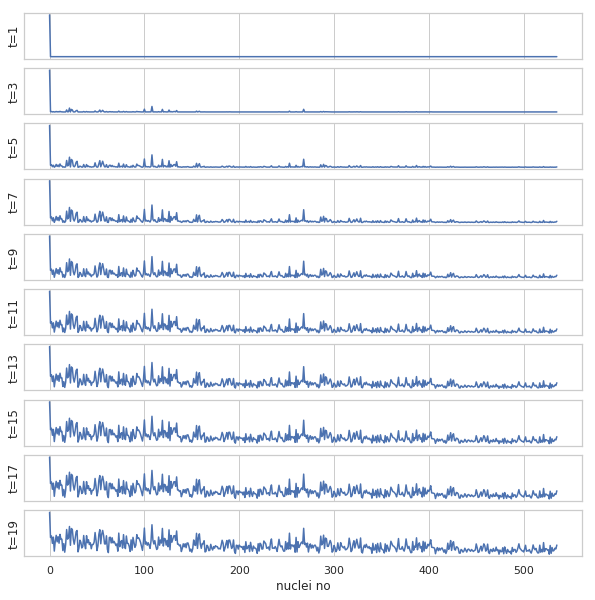

In [258]:
plt.figure(figsize=(10,10))
i=1
for t in range(0,20,2):
    t+=1
    cur_representation = np.exp(logit_list_dict[0][0]/t)
    cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
    cur_representation = np.transpose(cur_representation)
    plt.subplot(10,1,i)
    plt.plot(cur_representation[:,0])
    i+=1
    plt.yticks([])
    plt.ylabel('t={0}'.format(t))
plt.xlabel('nuclei no')
plt.show()


In [18]:
t=30
cur_representation = np.exp(logit_list_dict[0.3][0]/t)
cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
cur_representation = np.transpose(cur_representation)

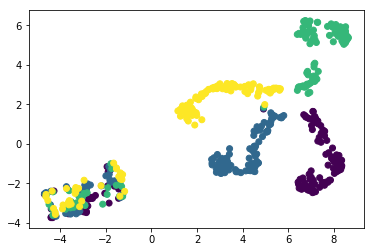

In [56]:
cur_rep = rep_list[2]
embed_test = umap.UMAP(metric='cosine').fit_transform(cur_rep)
plt.scatter(embed_test[:,0],embed_test[:,1],c=true_y)
plt.show()

In [47]:
test_label = SIMLR(cur_rep,-8)

In [30]:
np.unique(test_label,return_counts=1)

(array([0, 1, 2, 3, 4]), array([120,  53, 193,  81,  89]))

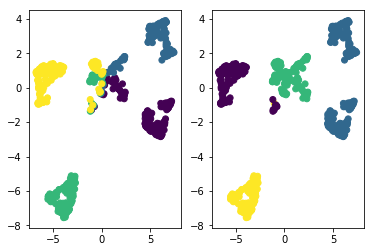

In [49]:
embed_test = umap.UMAP().fit_transform(cur_representation)
plt.subplot(1,2,1)
plt.scatter(embed_test[:,0],embed_test[:,1],c=true_y)
plt.subplot(1,2,2)
plt.scatter(embed_test[:,0],embed_test[:,1],c=test_label)
plt.show()

In [170]:
cur_representation.shape

(640, 27300)

In [219]:
order_mat = np.zeros(shape=cur_representation.shape)
for i in range(cur_representation.shape[1]):
    cur_sort = np.argsort(cur_representation[:,i])
    cur_order = np.argsort(cur_sort)
    order_mat[:,i] = cur_order

In [237]:
row_label = true_y
column_label1 = cell_idx
column_label2 = cell_idx
for i in range(column_label2.shape[0]):
#     print(cl)
    cl = column_label2[i]
    column_label2[i] = true_y[cl-1]
lut_row = dict(zip(set(row_label), sns.hls_palette(len(set(row_label)), l=0.5, s=0.8)))
lut_column1 = dict(zip(set(column_label1), sns.hls_palette(len(set(column_label1)), l=0.5, s=0.8)))
lut_column2 = dict(zip(set(column_label2), sns.hls_palette(len(set(column_label2)), l=0.5, s=0.8)))

row_colors = pd.DataFrame(row_label)[0].map(lut_row)
column_colors1 = pd.DataFrame(column_label1)[0].map(lut_column1)
column_colors2 = pd.DataFrame(column_label2)[0].map(lut_column2)




In [240]:
# plt.figure(figsize=(10,10))
# sns.heatmap(order_mat,cmap="vlag")
sns.clustermap(figsize=(10,10),col_colors=[column_colors1,column_colors2],row_colors=row_colors,data=pd.DataFrame(order_mat),cmap='vlag',row_cluster=False,col_cluster=False)
plt.savefig('/home/yzy/softmax_heatmap.png',transparent=True,format='png')

# plt.show()

In [224]:
1+1

2

In [168]:
c=np.argsort(a[:,2])

In [169]:
np.argsort(c)

array([2, 0, 1])

In [164]:
b.index(c)

AttributeError: 'numpy.ndarray' object has no attribute 'index'

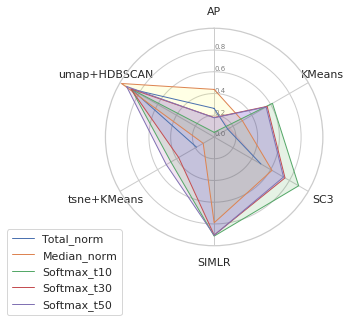

In [135]:
# Libraries
import matplotlib.pyplot as plt
import pandas as pd
from math import pi

# Set data
# 每一个color是一个表示
# clustering_list = ['KMeans','SC3','SIMLR','tsne+KMeans','umap+HDBSCAN','AP']

# color_list = ['red','yellow','green','blue','purple']
# radar_dict = {
#     'A':mean_variant_list
# }
# radar_data_mat = rst_data_mat
# for clustering in clustering_list:
#     radar_dict[clustering] = list(radar_data_mat[:,clustering_list.index(clustering)])
# df = pd.DataFrame(radar_dict)
my_ticks = np.arange(0,1,0.2)
# df = pd.DataFrame({
# 'group': ['A','B','C','D'],

# 'var1': [38, 1.5, 30, 4],
# 'var2': [29, 10, 9, 34],
# 'var3': [8, 39, 23, 24],
# 'var4': [7, 31, 33, 14],
# 'var5': [28, 15, 32, 14]

# })



# ------- PART 1: Create background

# number of variable
categories=list(df)[1:]
N = len(categories)

# What will be the angle of each axis in the plot? (we divide the plot / number of variable)
angles = [n / float(N) * 2 * pi for n in range(N)]
angles += angles[:1]

# Initialise the spider plot
ax = plt.subplot(111, polar=True)

# If you want the first axis to be on top:
ax.set_theta_offset(pi / 2)
ax.set_theta_direction(-1)

# Draw one axe per variable + add labels labels yet
plt.xticks(angles[:-1], categories)

# Draw ylabels
ax.set_rlabel_position(0)
plt.yticks(my_ticks, [str(i) for i in my_ticks], color="grey", size=7)
plt.ylim(0,1)


# ------- PART 2: Add plots

# Plot each individual = each line of the data
# I don't do a loop, because plotting more than 3 groups makes the chart unreadable

# Ind1
for i in range(df.A.shape[0]):
    values=df.loc[i].drop('A').values.flatten().tolist()
    values += values[:1]
    ax.plot(angles, values, linewidth=1, linestyle='solid', label=df.A[i])
    ax.fill(angles, values, color_list[i], alpha=0.1)

# Ind2
# values=df.loc[1].drop('group').values.flatten().tolist()
# values += values[:1]
# ax.plot(angles, values, linewidth=1, linestyle='solid', label="group B")
# ax.fill(angles, values, 'r', alpha=0.1)

# Add legend
plt.legend(loc='upper right', bbox_to_anchor=(0.1, 0.1))
plt.show()

In [49]:
rst_data_mat

NameError: name 'rst_data_mat' is not defined

In [138]:
rst_dump_all

{0.1: {'Median_norm': {'Non_projection': {'AP': {'AMI': [0.55748875603802206,
      0.55748875603802206,
      0.55748875603802206,
      0.55748875603802206,
      0.55748875603802206],
     'ARI': [0.4376770524855168,
      0.4376770524855168,
      0.4376770524855168,
      0.4376770524855168,
      0.4376770524855168],
     'KNN': [array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
      array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
      array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
      array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
      array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.])],
     'NMI': [0.74980199070860598,
      0.74980199070860598,
      0.74980199070860598,
      0.74980199070860598,
      0.74980199070860598]},
    'KMeans': {'AMI': [1.0, 1.0, 1.0, 1.0, 1.0],
     'ARI': [1.0, 1.0, 1.0, 1.0, 1.0],
     'KNN': [array([ 1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.,  1.]),
      array([ 1.,  1.,  1.,  1.,  1., 

In [125]:
rst_dump_all = pickle.load(open('/home/yzy/SIMS/celline_simu_k4_0.1foldchange_base3.pkl',"rb"))

data = [
    ['KMeans','SC3','SIMLR','tsne+KMeans','umap+HDBSCAN','AP'],
    
]

pd_dict = {
    'representation':[],#softmax/mean/mean_total/mean_median
    'clustering':[],
    'fold_change':[],
    'projection':[],
    'metric':[],
    'value':[],
}
rst_data_mat = np.zeros(shape=(len(mean_variant_list),len(clustering_list)))


for fold_change,representation_dict in rst_dump_all.items():
    for representation,projection_dict in representation_dict.items():
        for projection,clustering_dict in projection_dict.items():
            for clustering,metric_dict in clustering_dict.items():
                for metric,metric_value_list in metric_dict.items():

                    metric_value_list = np.array(metric_value_list).flatten()



                    for metric_value in metric_value_list:
                        if metric=='ARI':
                            add_pos_row = mean_variant_list.index(representation)
                            add_pos_col = clustering_list.index(clustering)
                            rst_data_mat[add_pos_row,add_pos_col] += metric_value
rst_data_mat/=5                        
#                         pd_dict['clustering'].append(clustering)
#                         pd_dict['representation'].append(representation)
#                         pd_dict['fold_change'].append(fold_change)
#                         pd_dict['projection'].append(projection)
#                         pd_dict['metric'].append(metric)
#                         pd_dict['value'].append(metric_value)

#         for projection,metric_dict in projection_dict.items():
            
#                 for metric,metric_value_list in metric_dict.items():

#                     metric_value_list = np.array(metric_value_list).flatten()



#                     for metric_value in metric_value_list:
#                         pd_dict['representation'].append(representation)
#                         pd_dict['fold_change'].append(fold_change)
#                         pd_dict['projection'].append(projection)
#                         pd_dict['metric'].append(metric)
#                         pd_dict['value'].append(metric_value)


In [11]:
    data = [
        ['Sulfate', 'Nitrate', 'EC', 'OC1', 'OC2', 'OC3', 'OP', 'CO', 'O3'],
        ('Basecase', [
            [0.88, 0.01, 0.03, 0.03, 0.00, 0.06, 0.01, 0.00, 0.00],
            [0.07, 0.95, 0.04, 0.05, 0.00, 0.02, 0.01, 0.00, 0.00],
            [0.01, 0.02, 0.85, 0.19, 0.05, 0.10, 0.00, 0.00, 0.00],
            [0.02, 0.01, 0.07, 0.01, 0.21, 0.12, 0.98, 0.00, 0.00],
            [0.01, 0.01, 0.02, 0.71, 0.74, 0.70, 0.00, 0.00, 0.00]]),
        ('With CO', [
            [0.88, 0.02, 0.02, 0.02, 0.00, 0.05, 0.00, 0.05, 0.00],
            [0.08, 0.94, 0.04, 0.02, 0.00, 0.01, 0.12, 0.04, 0.00],
            [0.01, 0.01, 0.79, 0.10, 0.00, 0.05, 0.00, 0.31, 0.00],
            [0.00, 0.02, 0.03, 0.38, 0.31, 0.31, 0.00, 0.59, 0.00],
            [0.02, 0.02, 0.11, 0.47, 0.69, 0.58, 0.88, 0.00, 0.00]]),
        ('With O3', [
            [0.89, 0.01, 0.07, 0.00, 0.00, 0.05, 0.00, 0.00, 0.03],
            [0.07, 0.95, 0.05, 0.04, 0.00, 0.02, 0.12, 0.00, 0.00],
            [0.01, 0.02, 0.86, 0.27, 0.16, 0.19, 0.00, 0.00, 0.00],
            [0.01, 0.03, 0.00, 0.32, 0.29, 0.27, 0.00, 0.00, 0.95],
            [0.02, 0.00, 0.03, 0.37, 0.56, 0.47, 0.87, 0.00, 0.00]]),
        ('CO & O3', [
            [0.87, 0.01, 0.08, 0.00, 0.00, 0.04, 0.00, 0.00, 0.01],
            [0.09, 0.95, 0.02, 0.03, 0.00, 0.01, 0.13, 0.06, 0.00],
            [0.01, 0.02, 0.71, 0.24, 0.13, 0.16, 0.00, 0.50, 0.00],
            [0.01, 0.03, 0.00, 0.28, 0.24, 0.23, 0.00, 0.44, 0.88],
            [0.02, 0.00, 0.18, 0.45, 0.64, 0.55, 0.86, 0.00, 0.16]])
    ]

2

In [212]:
pickle.dump(logit_list_dict,open("/home/yzy/SIMS/celline_simu_k4_againstfoldchange_clusterings_logit_list_dict_5times.pkl","wb"))


In [186]:
rst_dump_all[0.8]

{'Median_norm': {'Non_projection': {'KMeans': {'AMI': [-0.0046390747351249366],
    'ARI': [-0.0032196161707099295],
    'KNN': [array([ 0.3125  ,  0.375   ,  0.265625,  0.265625,  0.3125  ,  0.234375,
             0.359375,  0.28125 ,  0.265625,  0.265625])],
    'NMI': [0.00054122723358715052]},
   'RMKKM': {'AMI': [-0.0050173425471545935],
    'ARI': [-0.0037262574271085592],
    'KNN': [array([ 0.390625,  0.1875  ,  0.3125  ,  0.3125  ,  0.375   ,  0.21875 ,
             0.296875,  0.359375,  0.34375 ,  0.265625])],
    'NMI': [0.00014014048591787107]},
   'SC3': {'AMI': [-0.0051640479481316563],
    'ARI': [-0.0027991369946676133],
    'KNN': [array([ 0.21875 ,  0.296875,  0.28125 ,  0.328125,  0.234375,  0.328125,
             0.28125 ,  0.21875 ,  0.453125,  0.265625])],
    'NMI': [-5.5240244755500117e-16]},
   'SIMLR': {'AMI': [-0.0051328034610305055],
    'ARI': [-0.0046241115430083902],
    'KNN': [array([ 0.3125  ,  0.359375,  0.203125,  0.296875,  0.328125,  0.3125  ,
    

In [ ]:
from sklearn.svm import LinearSVC
fold_change_list = np.arange(0,2,0.02)
rst_dump_svm = {}
logit_list_dict = {}
for fold_change in fold_change_list:
#     fold_change = 2
    change_dims = [86]
    simu_base = 3

    batch_num_list = [simu_base,5]
    for i in range(4+1,len(batch_dict)+1):
        del batch_dict[i]
        del cell_dict[i]
        del label_dict[i]
        del pos_dict[i]

    cur_batch_num = len(batch_dict)
    simu_data_1,simu_cellidx = simulate_data(simu_base,6,fold_change,0,[61])
    batch_dict[cur_batch_num+1] = simu_data_1
    # batch_dict[cur_batch_num+1] = 111
    cell_dict[cur_batch_num+1] = simu_cellidx
    label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
    pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])

    [train_x,cell_idx,cell_type,cell_pos,batch_idx,num_cells] = get_train_data(batch_num_list,'none','none')
    _,unique_idx = np.unique(cell_idx,return_index=True)
    true_y = cell_type[unique_idx]
    np.unique(true_y)

    # mean_total
    train_x_total = train_x/np.sum(train_x,axis=1,keepdims=True)
    train_x_total = np.log(train_x_total+1)
    mean_profile_list_total = []
    for i in range(num_cells):
        mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
    mean_profile_list_total = np.array(mean_profile_list_total)


    #mean median
    train_x_median = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
    train_x_median = np.log(train_x_median+1)
    mean_profile_list_median = []
    for i in range(num_cells):
        mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
    mean_profile_list_median = np.array(mean_profile_list_median)



    # mean
    mean_profile_list = []
    for i in range(num_cells):
        mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
    mean_profile_list = np.array(mean_profile_list)


    # tsne_param_list = [10,20,30,40,50]
    # umap_param_list = [5,10,15,20,25,30]
    projection_dim = 10
    n_clusters = 2
    mean_variant_list = ['Non_norm','Total_norm','Median_norm','Softmax_t10','Softmax_t20','Softmax_t30','Softmax_t40','Softmax_t50']
#     projection_list = ['Non_projection','PCA','TSNE','UMAP']
    projection_list = ['Non_projection','PCA']

    metrics_list = ['AMI','NMI','ARI','KNN']
    # metrics_list = 
    rst_dump = {}
    run_times = 1

    
    logit_list = []
    logit_model = Model(SIMS_input,d4)

    for i in range(run_times):

        reset_weights(softmax_model) 
        print('running {i}th logit for foldchange {fold_change}'.format(i=i,fold_change=fold_change))
        history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=0)


        while np.abs(history.history['loss'][-1]-np.max(history.history['loss']))<=2:
            print('error')
            reset_weights(softmax_model)
            history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=False)
        pred_logit = logit_model.predict(train_x)
        logit_list.append(pred_logit)

    
    logit_list_dict[fold_change] = logit_list
    for _ in range(run_times):
        for mean_variant in mean_variant_list:
            cur_representation = None
            if mean_variant == 'Non_norm':
                cur_representation = mean_profile_list
            elif mean_variant == 'Total_norm':
                cur_representation = mean_profile_list_total
            elif mean_variant == 'Median_norm':
                cur_representation = mean_profile_list_median
            else:
    #             进入softmax领域
                t = float(mean_variant[9:])
    #             pred_t_softmax = np.exp(pred_logit/t)
    #             pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)

                cur_representation = np.exp(logit_list[_]/t)
                cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
                cur_representation = np.transpose(cur_representation)
            if mean_variant not in rst_dump:
                rst_dump[mean_variant] = {}
            for projection in projection_list:
                cur_embed = None
                if projection=='Non_projection':
                    cur_embed = cur_representation
                elif projection=='PCA':
                    cur_embed = PCA(n_components=projection_dim).fit_transform(cur_representation)
                elif projection=='TSNE':
                    cur_embed = TSNE(n_components=projection_dim,metric='euclidean',verbose=False,method='exact').fit_transform(cur_representation)
                elif projection=='UMAP':
                    cur_embed = umap.UMAP(n_components=projection_dim,metric='euclidean',verbose=False).fit_transform(cur_representation)
                if projection not in rst_dump[mean_variant]:
                    rst_dump[mean_variant][projection] = {}
                for metric in metrics_list:
                    cur_rst = None
                    cur_label = KMeans(n_clusters=n_clusters).fit_predict(cur_embed)
                    if metric=='AMI':
                        cur_rst = metrics.adjusted_mutual_info_score(true_y,cur_label)
                    elif metric=='NMI':
                        cur_rst = metrics.normalized_mutual_info_score(true_y,cur_label)
                    elif metric=='ARI':
                        cur_rst = metrics.adjusted_rand_score(true_y,cur_label)
                    elif metric=='KNN':
                        kf = StratifiedKFold(n_splits=10,shuffle=True)
#                         knn = KNeighborsClassifier(metric='euclidean')
                        knn=LinearSVC()
                        cur_rst=cross_val_score(knn, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                    if metric not in rst_dump[mean_variant][projection]:
                        rst_dump[mean_variant][projection][metric] = [cur_rst]
                    else:
                        rst_dump[mean_variant][projection][metric].append(cur_rst)
                    print(str(fold_change),str(_),mean_variant,projection,metric,'|',cur_rst)
    rst_dump_svm[fold_change] = rst_dump


pickle.dump(rst_dump_svm,open("/home/yzy/SIMS/celline_simu_k2_againstfoldchange_svm.pkl","wb"))









/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:50: RuntimeWarning: invalid value encountered in double_scalars


running 0th logit for foldchange 0.0
0.0 0 Non_norm Non_projection AMI | -0.00227020742723
0.0 0 Non_norm Non_projection NMI | 6.44336335711e-16
0.0 0 Non_norm Non_projection ARI | -0.0030953667764
0.0 0 Non_norm Non_projection KNN | [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
0.0 0 Non_norm PCA AMI | -0.00227020742723
0.0 0 Non_norm PCA NMI | 6.44336335711e-16
0.0 0 Non_norm PCA ARI | -0.0030953667764
0.0 0 Non_norm PCA KNN | [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
0.0 0 Total_norm Non_projection AMI | -0.00224076831632
0.0 0 Total_norm Non_projection NMI | 3.09075026072e-05
0.0 0 Total_norm Non_projection ARI | -0.00260466272455
0.0 0 Total_norm Non_projection KNN | [ 1.  1.  1.  1.  1.  1.  1.  1.  1.  1.]
0.0 0 Total_norm PCA AMI | -0.00200224005223
0.0 0 Total_norm PCA NMI | 0.000275672234802
0.0 0 Total_norm PCA ARI | -0.00260466272455
0.0 0 Total_norm PCA KNN | [ 1.       1.       1.       0.96875  1.       1.       1.       0.96875
  1.       1.     ]
0.0 0 Median_norm Non_proj

In [372]:
logit_list_dict[0][0]

array([[ 26.49530792,  19.81432724,   9.82553482, ...,  -6.2056756 ,
        -12.0080204 ,  -6.02866745],
       [ 27.13776016,  16.29663086,  15.61587429, ...,   1.21073663,
         -2.29913521, -16.03257179],
       [ 33.77132034,  23.96809196,  10.11331367, ...,   0.04536009,
        -11.43231583,  -9.68145752],
       ..., 
       [  5.63927221,  -1.53780341, -12.70092392, ..., -25.67687035,
         -4.61617327,  19.09167671],
       [ -3.39085054,   4.80587864,  -5.31712866, ..., -11.7605629 ,
          1.84844565,  17.90879822],
       [  1.84893441,   6.060956  , -10.63180637, ..., -13.89034462,
         -2.97974539,  19.6089859 ]], dtype=float32)

In [390]:
# cur_representation = mean_profile_list_median

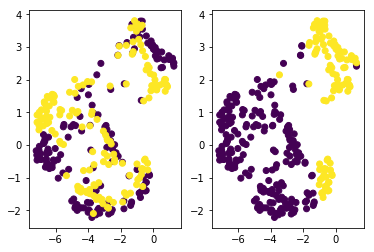

-0.00224004046253


In [407]:
pred_y_compre = pred_y_SSR
embed_test = umap.UMAP(metric='correlation').fit_transform(cur_representation)
plt.subplot(1,2,1)
plt.scatter(embed_test[:,0],embed_test[:,1],c=true_y)
plt.subplot(1,2,2)
plt.scatter(embed_test[:,0],embed_test[:,1],c=pred_y_compre)

plt.show()
print(adjusted_mutual_info_score(pred_y_compre,true_y))

In [5]:
eng = matlab.engine.start_matlab()

In [396]:
data_x = numpy2mat(cur_representation)
[pred_y_SIMLR, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(data_x,2.0,10.0,nargout=8)
# X, c, k, ifimpute,normalize
pred_y_SIMLR = np.array(pred_y_SIMLR)[:,0]

In [ ]:
[pred_y_ClustRF,affinity_ClustRF] = eng.ClustRF(data_x,'adaptive',2.0,nargout=2)
pred_y_ClustRF = np.array(pred_y_ClustRF)[:,0]

In [405]:
[pred_y_SSR,affinity1_SSR,affinity2_SSR] = eng.simplexSC(data_x,2.0,10.0,nargout=3)
pred_y_SSR = np.array(pred_y_SSR)[0,:]

IndexError: too many indices for array

In [406]:
pred_y_SSR = np.array(pred_y_SSR)[0,:]

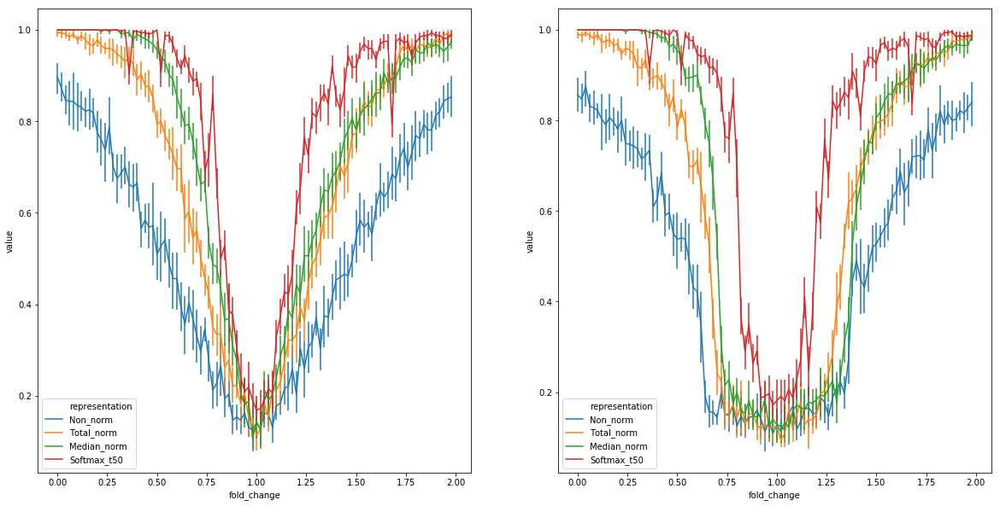

In [365]:

plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
pd_df_no = pd_df[(pd_df.metric=='KNN')&(pd_df.projection=='Non_projection')&(pd_df.representation.isin(['Non_norm','Total_norm','Median_norm','Softmax_t50']))]
ax = sns.lineplot(x="fold_change", y="value", data=pd_df_no,err_style='bars',hue='representation')
plt.subplot(1,2,2)
pd_df_PCA = pd_df[(pd_df.metric=='KNN')&(pd_df.projection=='PCA')&(pd_df.representation.isin(['Non_norm','Total_norm','Median_norm','Softmax_t50']))]
ax = sns.lineplot(x="fold_change", y="value", data=pd_df_PCA,err_style='bars',hue='representation')

plt.show()

In [363]:
pd_df_softmax = pd_df[(pd_df.metric=='KNN')&(pd_df.projection=='Non_projection')&(pd_df.representation.isin(['Non_norm','Total_norm','Median_norm','Softmax_t50']))]

In [109]:
# rst_dump_all = pickle.load(open("/home/yzy/SIMS/celline_simu_k2_againstfoldchange.pkl","rb"))
# rst_dump_all = pickle.load(open("/home/yzy/SIMS/celline_simu_k4_0~0.5foldchange_base1.pkl","rb"))
rst_dump_all = pickle.load(open("/home/yzy/SIMS/celline_simu_k4_0.5foldchange_base4.pkl","rb"))



pd_dict = {
    'representation':[],#softmax/mean/mean_total/mean_median
    'clustering':[],
    'fold_change':[],
    'projection':[],
    'metric':[],
    'value':[],
}
# temperature_list = [10,20,30,40,50,60,70,80,90,100]
# temperature_list = range(1,20)

# 添加mean的部分
for fold_change,representation_dict in rst_dump_all.items():
    for representation,projection_dict in representation_dict.items():
        for projection,clustering_dict in projection_dict.items():
            for clustering,metric_dict in clustering_dict.items():
                for metric,metric_value_list in metric_dict.items():

                    metric_value_list = np.array(metric_value_list).flatten()



                    for metric_value in metric_value_list:
                        pd_dict['clustering'].append(clustering)
                        pd_dict['representation'].append(representation)
                        pd_dict['fold_change'].append(fold_change)
                        pd_dict['projection'].append(projection)
                        pd_dict['metric'].append(metric)
                        pd_dict['value'].append(metric_value)

#         for projection,metric_dict in projection_dict.items():
            
#                 for metric,metric_value_list in metric_dict.items():

#                     metric_value_list = np.array(metric_value_list).flatten()



#                     for metric_value in metric_value_list:
#                         pd_dict['representation'].append(representation)
#                         pd_dict['fold_change'].append(fold_change)
#                         pd_dict['projection'].append(projection)
#                         pd_dict['metric'].append(metric)
#                         pd_dict['value'].append(metric_value)


In [110]:
a=pd.DataFrame(pd_dict)
np.unique(a.fold_change)

array([ 0.5])

In [78]:
pd_df_selected

,clustering,fold_change,metric,projection,representation,value
7810,KMeans,0.4,ARI,Non_projection,Total_norm,0.339046
7811,KMeans,0.4,ARI,Non_projection,Total_norm,0.339046
7812,KMeans,0.4,ARI,Non_projection,Total_norm,0.339046
7813,KMeans,0.4,ARI,Non_projection,Total_norm,0.566338
7814,KMeans,0.4,ARI,Non_projection,Total_norm,0.566338
7875,SC3,0.4,ARI,Non_projection,Total_norm,-0.002243
7876,SC3,0.4,ARI,Non_projection,Total_norm,0.260734
7877,SC3,0.4,ARI,Non_projection,Total_norm,0.298627
7878,SC3,0.4,ARI,Non_projection,Total_norm,0.223033
7879,SC3,0.4,ARI,Non_projection,Total_norm,-0.002243


In [93]:
a.loc[len(a)] = ['SIMS-Cluster',0.4,'ARI','Non_projection','Total_norm',0.92]

In [94]:
a[a.clustering=='SIMS-Cluster']

,clustering,fold_change,metric,projection,representation,value
9750,SIMS-Cluster,0.4,ARI,Non_projection,Total_norm,0.92


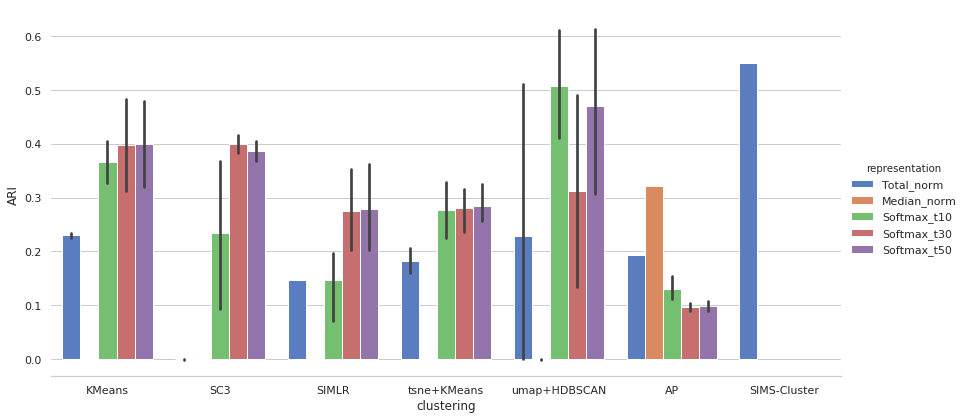

In [114]:
sns.set(style="whitegrid")
pd_df_selected = pd.DataFrame(pd_dict)
# pd_df_selected = pd_df_selected[(a.fold_change>0.2)&(a.fold_change<0.4)]
# pd_df_selected[pd_df_selected]
pd_df_selected = pd_df_selected[(a.fold_change==0.5)]
pd_df_selected.loc[len(pd_df_selected)] = ['SIMS-Cluster',0.4,'ARI','Non_projection','Total_norm',0.55]
pd_df_selected = pd_df_selected[pd_df_selected.metric=='ARI']
pd_df_selected = pd_df_selected.loc[pd_df_selected.clustering!='Spectral']
pd_df_selected.loc[(pd_df_selected.representation=='Median_norm'),'value']/=3
# pd_df_selected = pd_df_selected[pd_df_selected.representation!='Total_norm']
# Load the example Titanic dataset
# titanic = sns.load_dataset("titanic")

# Draw a nested barplot to show survival for class and sex
g = sns.catplot(x="clustering", y="value", hue="representation", data=pd_df_selected,
                height=6, aspect=2,kind="bar", palette="muted")
g.despine(left=True)
g.set_ylabels("ARI")
plt.show()

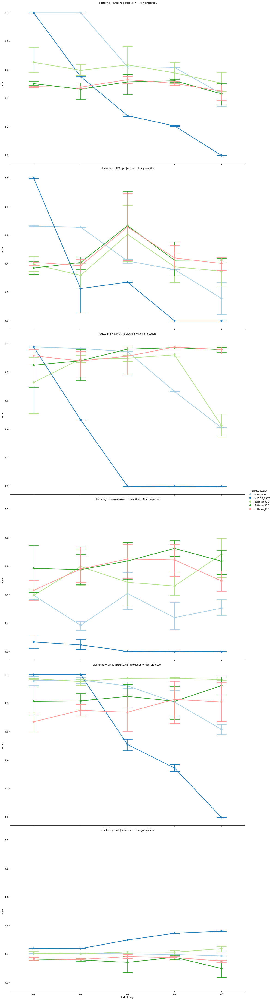

In [12]:
pd_df = pd.DataFrame(pd_dict)
pd_df=pd_df[pd_df.metric=='ARI']
# pd_df = pd_df[pd_df.representation.isin(['Softmax_t10','Non_norm','Total_norm','Median_norm'])]
# pd_df = pd_df[pd_df.fold_change>=0 and pd_df.fold_change<=2]
# pd_df = pd_df.query('fold_change>=0 & fold_change<=2')

g = sns.catplot(x="fold_change", y="value", hue="representation", col="projection",row="clustering",
                capsize=.2, palette="Paired", height=10, aspect=1.5,
                kind="point", data=pd_df)
g.despine(left=True)
# g.set(xlim=(0,100),xticks=range(100))
plt.show()
# plt.savefig('test_SIMLR.svg')


In [9]:
1+1

2

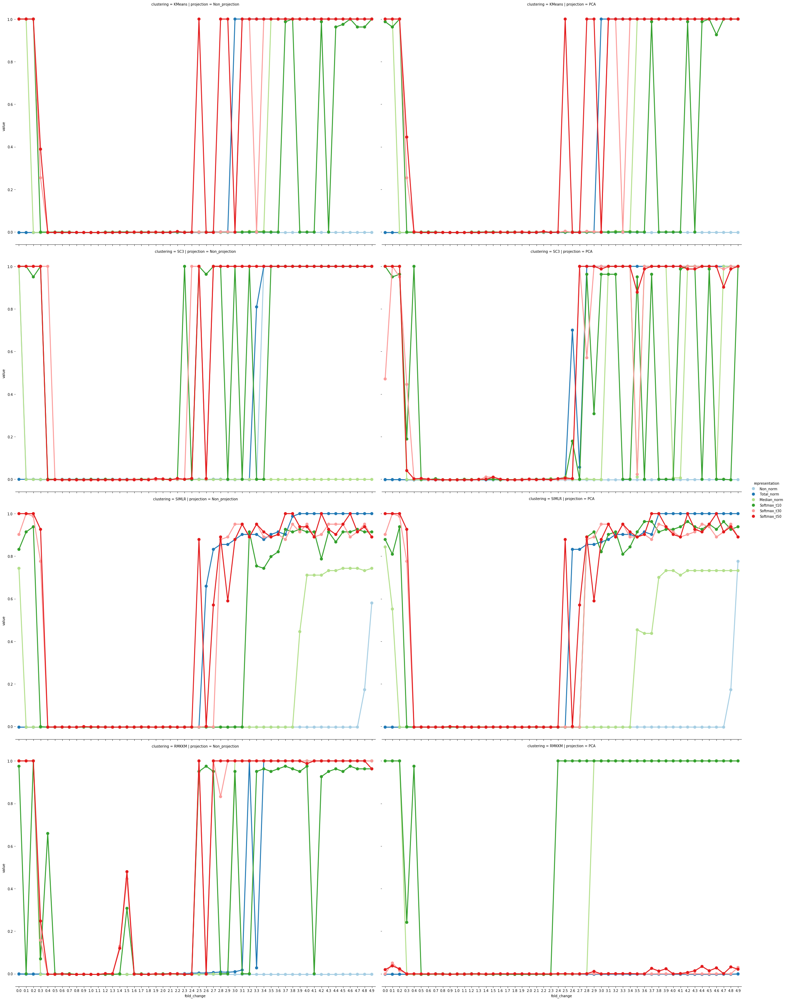

In [19]:
plt.show()

In [366]:
rst_dump_svm = pickle.load(open("/home/yzy/SIMS/celline_simu_k2_againstfoldchange_svm.pkl","rb"))

pd_dict = {
    'representation':[],#softmax/mean/mean_total/mean_median
    'fold_change':[],
    'projection':[],
    'metric':[],
    'value':[],
}
# temperature_list = [10,20,30,40,50,60,70,80,90,100]
# temperature_list = range(1,20)

# 添加mean的部分
for fold_change,representation_dict in rst_dump_svm.items():
    for representation,projection_dict in representation_dict.items():
        for projection,metric_dict in projection_dict.items():
            
                for metric,metric_value_list in metric_dict.items():

                    metric_value_list = np.array(metric_value_list).flatten()



                    for metric_value in metric_value_list:
                        pd_dict['representation'].append(representation)
                        pd_dict['fold_change'].append(fold_change)
                        pd_dict['projection'].append(projection)
                        pd_dict['metric'].append(metric)
                        pd_dict['value'].append(metric_value)


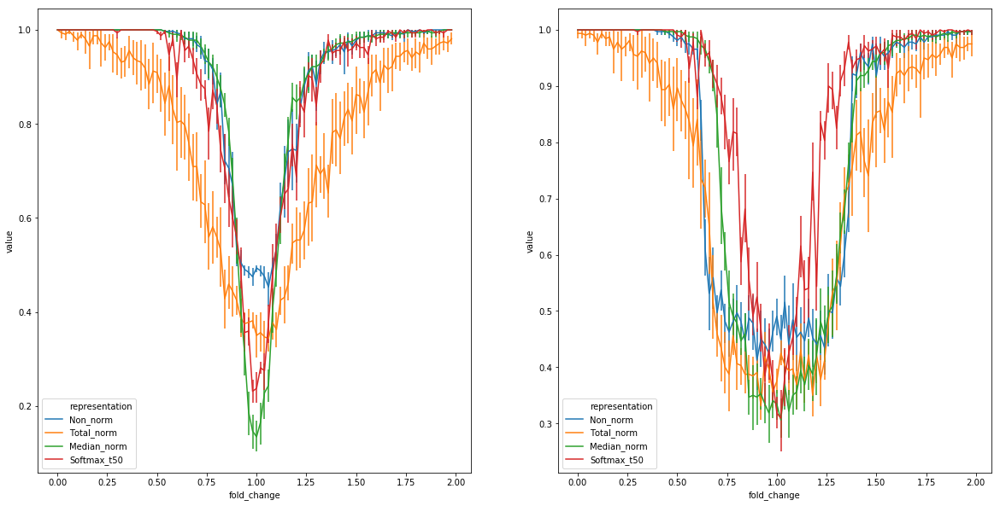

In [367]:
pd_df = pd.DataFrame(pd_dict)
plt.figure(figsize=(20,10))
plt.subplot(1,2,1)
pd_df_no = pd_df[(pd_df.metric=='KNN')&(pd_df.projection=='Non_projection')&(pd_df.representation.isin(['Non_norm','Total_norm','Median_norm','Softmax_t50']))]
ax = sns.lineplot(x="fold_change", y="value", data=pd_df_no,err_style='bars',hue='representation')
plt.subplot(1,2,2)
pd_df_PCA = pd_df[(pd_df.metric=='KNN')&(pd_df.projection=='PCA')&(pd_df.representation.isin(['Non_norm','Total_norm','Median_norm','Softmax_t50']))]
ax = sns.lineplot(x="fold_change", y="value", data=pd_df_PCA,err_style='bars',hue='representation')

plt.show()

In [320]:
pd_df = pd.DataFrame(pd_dict)
pd_df=pd_df[pd_df.metric=='KNN']
# pd_df = pd_df[pd_df.representation.isin(['Softmax_t10','Non_norm','Total_norm','Median_norm'])]
# pd_df = pd_df[pd_df.fold_change>=0 and pd_df.fold_change<=2]
pd_df = pd_df.query('fold_change>=0 & fold_change<=2')
# fig, ax = plt.subplots(figsize=(10,5))
g = sns.catplot(x="fold_change", y="value", hue="representation", col="projection",row="metric",
                capsize=.2, palette="Paired", height=10, aspect=1.5,
                kind="point", data=pd_df)
# g.despine(left=True)
# plt.savefig('test.svg')


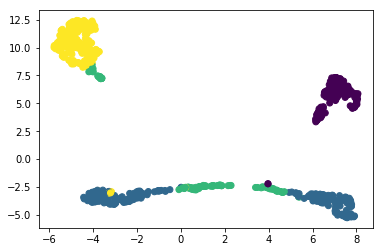

umap mean ARI 0.6771517065750087


In [108]:
umap_embed_mean = umap.UMAP(metric='cosine').fit_transform(softmax_representation_list[0])
umap_mean_kmeans_pred = KMeans(4).fit_predict(mean_profile_list)
kmeans_pred = KMeans(4).fit_predict(softmax_representation_list[0])
umap_mean_rcc_pred = rcc.RccCluster(measure='euclidean',verbose=0,clustering_threshold=0.1).fit(mean_profile_list)
show_pred = y_RMKKM
plt.scatter(umap_embed_mean[:,0],umap_embed_mean[:,1],c=show_pred)
plt.show()
print('umap mean ARI {score}'.format(score=metrics.adjusted_mutual_info_score(show_pred,true_y)))

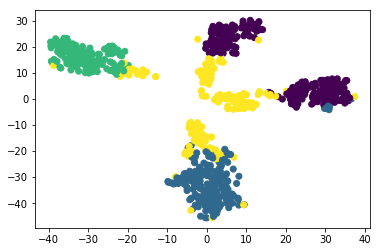

umap mean ARI 0.5664989818562712


In [172]:
umap_embed_mean = TSNE(metric='cosine').fit_transform(softmax_representation_list[1])
umap_mean_kmeans_pred = KMeans(4).fit_predict(umap_embed_mean)
# spetral_pred = SpectralClustering(affinity='rbf',n_clusters=4).fit_predict(softmax_representation_list[0])
# umap_mean_rcc_pred = rcc.RccCluster(measure='euclidean',verbose=0,clustering_threshold=0.1).fit(mean_profile_list)
# ClustRF_aff_ap_pred = AffinityPropagation(affinity='precomputed',damping=0.99).fit_predict(affinity_mat)
show_pred = spetral_pred
plt.scatter(umap_embed_mean[:,0],umap_embed_mean[:,1],c=show_pred)
plt.show()
print('umap mean ARI {score}'.format(score=metrics.adjusted_mutual_info_score(show_pred,true_y)))

In [157]:
np.unique(show_pred)

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16,
       17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33,
       34, 35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50,
       51, 52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67,
       68, 69, 70, 71, 72, 73, 74, 75, 76, 77, 78, 79, 80, 81, 82, 83, 84,
       85, 86, 87, 88, 89, 90, 91, 92, 93, 94, 95])

In [37]:
max_dist = np.max(pdist(mean_profile_list,'euclidean'))


In [253]:
# consensus clustering
# step 1:首先得到n个softmax空间的表示
n_softmax = 10
t_list = [10,20,30,40,50]

softmax_representation_list = []
logit_list = []
logit_model = Model(SIMS_input,d4)

for i in range(n_softmax):

    reset_weights(softmax_model) 
    history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=1)
        
       
    while np.abs(history.history['loss'][-1]-np.max(history.history['loss']))<=2:
        print('error')
        reset_weights(softmax_model)
        history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64,verbose=False)
    pred_logit = logit_model.predict(train_x)
    logit_list.append(pred_logit)
    for t in t_list:
        print(i,t)
    #     history=softmax_model.fit([train_x,cur_label],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=50,shuffle=True,batch_size=64,verbose=True)

        pred_t_softmax = np.exp(pred_logit/t)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        softmax_representation_list.append(np.transpose(pred_t_softmax))



Epoch 1/200
13650/13650 [==============================] - 1s 60us/step - loss: 5.8437 - softmax_loss: 5.8437 - center_loss: 63.3410
Epoch 2/200
13650/13650 [==============================] - 1s 59us/step - loss: 5.6951 - softmax_loss: 5.6951 - center_loss: 35.1440
Epoch 3/200
13650/13650 [==============================] - 1s 60us/step - loss: 5.5748 - softmax_loss: 5.5748 - center_loss: 74.3465
Epoch 4/200
13650/13650 [==============================] - 1s 59us/step - loss: 5.4459 - softmax_loss: 5.4459 - center_loss: 140.7702
Epoch 5/200
13650/13650 [==============================] - 1s 60us/step - loss: 5.3010 - softmax_loss: 5.3010 - center_loss: 240.2305
Epoch 6/200
13650/13650 [==============================] - 1s 62us/step - loss: 5.1800 - softmax_loss: 5.1800 - center_loss: 337.3724
Epoch 7/200
13650/13650 [==============================] - 1s 63us/step - loss: 5.0877 - softmax_loss: 5.0877 - center_loss: 441.5442
Epoch 8/200
13650/13650 [==============================] - 1s 60u

In [151]:
y_ClustRF = np.array(y_ClustRF)[:,0]
affinity_mat=np.array(affinity_mat)

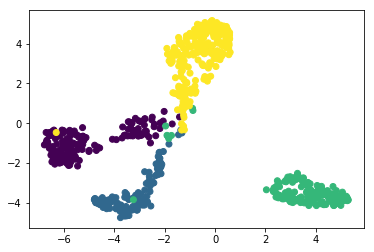

In [152]:
aff_embed = umap.UMAP(metric='precomputed').fit_transform(1/affinity_mat)
plt.scatter(aff_embed[:,0],aff_embed[:,1],c=true_y)
plt.show()

In [58]:
y_Kmeans = KMeans(2.0).fit_predict(mean_profile_list_median)

TypeError: 'float' object cannot be interpreted as an integer

In [166]:
y_SSR = np.array(y_SSR)
# affinity_mat=np.array(affinity_mat)

In [ ]:
[y_SSR] = eng.simplexSC(data_x,4.0,10.0)

In [ ]:
# data_x = softmax_representation_list[0]
# # data_x = mean_profile_list
# data_x = numpy2mat(data_x)
[y_ClustRF,affinity_mat] = eng.ClustRF(data_x,'adaptive',4.0,nargout=2)

In [36]:
cur_representation = np.exp(logit_list_dict[0][0]/30)
cur_representation = cur_representation/np.sum(cur_representation,axis=1,keepdims=True)
cur_representation = np.transpose(cur_representation)

In [37]:
y_RMKKM = RMKKM(cur_representation,2.0)

In [41]:
y_SSR = SSR(cur_representation,2.0)

In [ ]:
y_ClustRF = ClustRF(cur_representation,2.0)

In [57]:
adjusted_mutual_info_score(y_Kmeans,true_y)

-0.0014855201968665239

In [44]:
np.unique(y_SSR,return_counts=1)

(array([ 1.,  2.]), array([104, 216]))

In [50]:
y_SSR.shape

(320,)

In [ ]:
def SIMLR(data_x,k):
    data_x = numpy2mat(data_x)
    [cur_label, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(data_x,k,10.0,nargout=8)
    y_SIMLR = np.array(cur_label)[:,0]
    return y_SIMLR

In [45]:
def SIMLR(data_x,k):
    data_x = numpy2mat(data_x)
    [cur_label, S, F, ydata,alphaK,timeOurs,converge,LF] = eng.SIMLR(data_x,k,10.0,nargout=8)
    y_SIMLR = np.array(cur_label)[:,0]
    return y_SIMLR
def ClustRF(data_x,k):
    data_x = numpy2mat(data_x)
    [y_ClustRF,affinity_mat] = eng.ClustRF(data_x,'adaptive',k,nargout=2)    
    y_ClustRF = np.array(y_ClustRF)[:,0]
    return y_ClustRF
def SSR(data_x,k):
    data_x = numpy2mat(data_x)
    [y_SSR] = eng.simplexSC(data_x,k,10.0)
    y_SSR = np.array(y_SSR)
    return y_SSR
def RMKKM(data_x,k):
#     data_x：numpyarray；
#     k：float，e.g，2.0
    kernel_list = []
    gaussian_ts = [0.01,0.05,0.1,1,10,50,100]
    poly_as = [0,1]
    poly_bs = [2,4]

    # 先是gaussian kernel，
    max_dist = np.max(pdist(data_x,'euclidean'))
    for gaussian_t in gaussian_ts:
        delta = gaussian_t*max_dist
        gamma = 1/(2*np.square(delta))
        cur_kernel = rbf_kernel(data_x,gamma=gamma)
        kernel_list.append(cur_kernel)

    # 再是poly kernel
    for i in range(len(poly_as)):
        poly_a = poly_as[i]
        poly_b = poly_bs[i]
        cur_kernel = polynomial_kernel(data_x,coef0=poly_a,degree=poly_b)
        kernel_list.append(cur_kernel)

    #cosine kernel
    kernel_list.append(cosine_similarity(data_x))

    kernel_list = list(map(lambda m:numpy2mat(m),kernel_list))
    rst = eng.RMKKM(kernel_list,k,'gamma',0.5, 'maxiter', 50, 'replicates', 1,nargout=1)
    y_RMKKM=np.array(rst)[:,0]
    return y_RMKKM

def SC3(data_x,k,transformations=['PCA']):
    # data_x = rep
    # k=3
    # transformations = ['PCA','Laplacian']
    d_range_low = np.max([np.floor(data_x.shape[0]*0.04),1])
    d_range_high = np.ceil(data_x.shape[0]*0.07)
    d_range = np.arange(d_range_low,d_range_high+1)
    distance_metrics = ['euclidean','pearson','spearman']
    kmeans_input_pool = []
    kmeans_label_list = []
    CM = np.zeros(shape=(data_x.shape[0],data_x.shape[0]))
    for distance_metric in distance_metrics:
        if distance_metric=='euclidean':
            dist_mat = squareform(pdist(data_x,'euclidean'))
        elif distance_metric=='pearson':
            dist_mat = squareform(pdist(data_x,'correlation'))
        elif distance_metric=='spearman':
            dist_mat = 1-spearmanr(np.transpose(data_x))[0]
        for transformation in transformations:
            if transformation=='PCA':
                trans_dist_mat = PCA(n_components=int(d_range_high)).fit_transform(dist_mat)
            elif transformation=='Laplacian':
                simi_mat = np.exp(-dist_mat/(np.max(dist_mat)))
                graph_lap = laplacian(simi_mat,normed=True,return_diag=False)
                eig_value,eig_vector = eig(graph_lap)
                trans_dist_mat = eig_vector[:,np.flip(np.argsort(eig_value),axis=0)[0:int(d_range_high)]]
            for d in d_range:
                cur_input = trans_dist_mat[:,0:int(d)]
                kmeans_input_pool.append(cur_input)
    for kmeans_input in kmeans_input_pool:
        cur_y = KMeans(k).fit_predict(kmeans_input)
        kmeans_label_list.append(cur_y)
        cur_CM = label2CM(cur_y)
        CM = CM + cur_CM
    CM = CM/np.max(CM)
    y_SC3=AgglomerativeClustering(n_clusters=k,affinity='precomputed',linkage='complete').fit_predict(1-CM)

    return y_SC3


In [40]:
def SSR(data_x,k):
    data_x = numpy2mat(data_x)
    [y_SSR] = eng.simplexSC(data_x,k,10.0)
    y_SSR = np.array(y_SSR)
    return y_SSR

In [32]:
def RMKKM(data_x,k):
#     data_x：numpyarray；
#     k：float，e.g，2.0
    kernel_list = []
    gaussian_ts = [0.01,0.05,0.1,1,10,50,100]
    poly_as = [0,1]
    poly_bs = [2,4]

    # 先是gaussian kernel，
    max_dist = np.max(pdist(data_x,'euclidean'))
    for gaussian_t in gaussian_ts:
        delta = gaussian_t*max_dist
        gamma = 1/(2*np.square(delta))
        cur_kernel = rbf_kernel(data_x,gamma=gamma)
        kernel_list.append(cur_kernel)

    # 再是poly kernel
    for i in range(len(poly_as)):
        poly_a = poly_as[i]
        poly_b = poly_bs[i]
        cur_kernel = polynomial_kernel(data_x,coef0=poly_a,degree=poly_b)
        kernel_list.append(cur_kernel)

    #cosine kernel
    kernel_list.append(cosine_similarity(data_x))

    kernel_list = list(map(lambda m:numpy2mat(m),kernel_list))
    rst = eng.RMKKM(kernel_list,k,'gamma',0.5, 'maxiter', 50, 'replicates', 1,nargout=1)
    y_RMKKM=np.array(rst)[:,0]
    return y_RMKKM


In [63]:
# 构建kernel pool,参照Robust Multiple Kernel K-means Using l2,1-Norm
# data_X = mean_profile_list
data_x = softmax_representation_list[4]
kernel_list = []
gaussian_ts = [0.01,0.05,0.1,1,10,50,100]
poly_as = [0,1]
poly_bs = [2,4]

# 先是gaussian kernel，
max_dist = np.max(pdist(mean_profile_list,'euclidean'))
for gaussian_t in gaussian_ts:
    delta = gaussian_t*max_dist
    gamma = 1/(2*np.square(delta))
    cur_kernel = rbf_kernel(data_X,gamma=gamma)
    kernel_list.append(cur_kernel)

# 再是poly kernel
for i in range(len(poly_as)):
    poly_a = poly_as[i]
    poly_b = poly_bs[i]
    cur_kernel = polynomial_kernel(data_X,coef0=poly_a,degree=poly_b)
    kernel_list.append(cur_kernel)
    
#cosine kernel
kernel_list.append(cosine_similarity(data_X))

kernel_list = list(map(lambda m:numpy2mat(m),kernel_list))
    

In [ ]:
# 构建kernel pool,参照Robust Multiple Kernel K-means Using l2,1-Norm
# data_X = mean_profile_list
kernel_list = []

for data_x in softmax_representation_list:
# data_x = softmax_representation_list[4]
    gaussian_ts = [0.01,0.05,0.1,1,10,50,100]
    poly_as = [0,1]
    poly_bs = [2,4]

    # 先是gaussian kernel，
    max_dist = np.max(pdist(mean_profile_list,'euclidean'))
    for gaussian_t in gaussian_ts:
#         delta = gaussian_t*max_dist
#         gamma = 1/(2*np.square(delta))
        gamma = 1/(t*np.square(max_dist))
        cur_kernel = rbf_kernel(data_X,gamma=gamma)
        kernel_list.append(cur_kernel)

    # 再是poly kernel
    for i in range(len(poly_as)):
        poly_a = poly_as[i]
        poly_b = poly_bs[i]
        cur_kernel = polynomial_kernel(data_X,coef0=poly_a,degree=poly_b)
        kernel_list.append(cur_kernel)

    #cosine kernel
    kernel_list.append(cosine_similarity(data_X))

kernel_list = list(map(lambda m:numpy2mat(m),kernel_list))


In [160]:
eng.quit()

In [161]:
eng = matlab.engine.start_matlab()

In [ ]:
rst = eng.RMKKM(kernel_list,4.0,'gamma',0.5, 'maxiter', 50, 'replicates', 1,nargout=3)
y_RMKKM=np.array(rst[0])[:,0]

In [6]:
import keras
from keras.constraints import *
from keras.regularizers import *
from keras.layers import *

from keras.initializers import *
activa = 'relu'
dp_rate = 0.5
low_dim = 128
l2_penalty = 0
l1_penalty = 1e-5
use_bias = False
def modi_softmax(args):
    t =1
    pixel_embed,nuclei_embed = args
    
    
    
    pixel_embed = pixel_embed[:,None]
#     pixel_embed = K.l2_normalize(pixel_embed,axis=-1)
#     nuclei_embed = K.l2_normalize(nuclei_embed,axis=-1)
    
    print('pixel_embed',pixel_embed.shape)
    print('nuclei_embed',nuclei_embed.shape)
    minus_square = (pixel_embed*nuclei_embed/t)
#     minus_square = K.square(pixel_embed-nuclei_embed)
    print('minus_square',minus_square.shape)
    
#     sum_minus_square = -K.sum(minus_square,axis=-1)/t
    sum_minus_square = K.sum(minus_square,axis=-1)
    norm_exp = K.softmax(sum_minus_square)
    return norm_exp
    
    print('norm_exp',norm_exp)
    
def modi_softeuc(args):
    t = 1
    p = 1
    pixel_embed,nuclei_embed = args
    
    
    
    pixel_embed = pixel_embed[:,None]
#     pixel_embed = K.l2_normalize(pixel_embed,axis=-1)
#     nuclei_embed = K.l2_normalize(nuclei_embed,axis=-1)
    
    print('pixel_embed',pixel_embed.shape)
    print('nuclei_embed',nuclei_embed.shape)
#     minus_square = (pixel_embed*nuclei_embed/t)
    minus_square = K.square(pixel_embed-nuclei_embed)
#     minus_square = K.abs(pixel_embed-nuclei_embed)

    print('minus_square',minus_square.shape)
    
#     sum_minus_square = -K.sqrt(K.sum(minus_square,axis=-1))/t
    sum_minus_square = -K.pow(K.sum(minus_square,axis=-1)/t,p)

#     sum_minus_square = K.sum(minus_square,axis=-1)
    norm_exp = K.softmax(sum_minus_square)
    return norm_exp
    
    print('norm_exp',norm_exp)
def cal_kld(nuclei_embed):
#     计算nuclei embed的arccos矩阵和均匀分布的kl散度
#     也就是arccos矩阵的熵
    pass

def cal_pl_loss(args):
    nuclei_embed,target,pixel_embed = args
#     target = K.expand_dims(target,axis=1)
#     print('nuclei_embed',nuclei_embed.shape)
#     print('target',target.shape)
    target = K.expand_dims(target,axis=1)
#     print('pixel_embed',pixel_embed.shape)
    print('nuclei_embed',nuclei_embed.shape)
    print('target',target.shape)
    aaa = K.batch_dot(target,nuclei_embed)
    print('aaa1',aaa.shape)
#     aaa = K.squeeze(aaa,2)
#     pixel_embed = K.squeeze(pixel_embed,1)
#     aaa = K.squeeze(aaa,1)
    pixel_embed = K.expand_dims(pixel_embed,axis=1)
    print('aaa',aaa.shape)
    print('pixel_embed',pixel_embed.shape)
    rst = K.sum(K.square(aaa-pixel_embed),axis=-1,keepdims=False)
    return rst
    
    
####################MLP################################################################################
SIMS_input = Input(shape=(train_x.shape[1],))
target_input = Input(shape=(1,))

d1 = Dense(512,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(SIMS_input)
# d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(SIMS_input)
# d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(d1)


d2 = Dense(256,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d1)
# d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d1)
# d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d2)
d2 = Dense(low_dim,activation='linear',kernel_initializer='random_uniform',use_bias=use_bias)(d2)


# d3 = Dense(64,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d2)
# d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d2)
# d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d3)


# d4 = Dense(low_dim,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d3)
d4 = Dense(num_cells,activation='linear',kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
####################MLP################################################################################
centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center')([d2,centerloss_embed_layer])



softmax_out = Activation('softmax',name='softmax')(d4)

softmax_model = Model([SIMS_input,target_input],[softmax_out,centerloss_out])
softmax_model.compile(optimizer=sgd(),loss=['categorical_crossentropy',lambda y_true,y_pred:y_pred],loss_weights=[1,0])
onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
reset_weights(softmax_model)


# history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64)




# dummy_input = Input(shape=(num_cells,))
# target_input = Input(shape=(num_cells,))
# # embed_layer = Embedding(num_cells,2,input_length=num_cells,embeddings_initializer='random_uniform',embeddings_constraint=keras.constraints.min_max_norm(min_value=1, max_value=10, rate=1.0, axis=0))(dummy_input)
# embed_layer = Embedding(num_cells,low_dim,input_length=num_cells,embeddings_initializer='random_uniform')(dummy_input)

# # softmax_out = Lambda(modi_softmax)([d4,embed_layer])
# softmax_out = Lambda(modi_softmax,name='modified_softmax')([d4,embed_layer])

# centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
# centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center_loss')([d4,centerloss_embed_layer])

# pl_loss_out = Lambda(cal_pl_loss,name='pl_loss')([embed_layer,target_input,d4])


# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform',kernel_constraint=unit_norm(),use_bias=False)(d4)
# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform')(d4)

# # d4 = Lambda(lambda  x: K.l2_normalize(x,axis=1))(d4)
# # softmax_out = Dense(num_cells,activation = 'softmax',kernel_initializer='random_uniform')(d4)


# #下面是euclidean based softmax



# classification_model_singlegpu = Model(inputs=[SIMS_input,dummy_input,target_input],outputs=[softmax_out,pl_loss_out])
# # classification_model = multi_gpu_model(classification_model_singlegpu,gpus=2)
# classification_model_singlegpu.compile(optimizer=nadam(),loss=['categorical_crossentropy',lambda y_true,y_pred: y_pred], loss_weights=[1.,0])

# onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
# # onehot_label1 = onehot_label[:,None,:]
# print('onehot_label',onehot_label.shape)
# # classification_model.fit(train_x,onehot_label,epochs=200,shuffle=True,batch_size=128,sample_weight=cell_center_dist_exp)
# history=classification_model_singlegpu.fit([train_x,np.tile(np.arange(num_cells),(train_x.shape[0],1)),onehot_label],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=500,shuffle=True,batch_size=128)





NameError: name 'train_x' is not defined

In [52]:
history

t=5


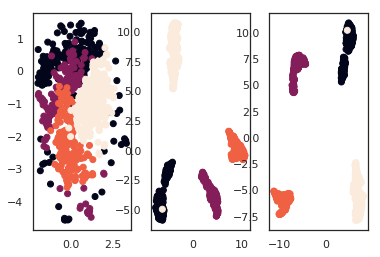

t=10


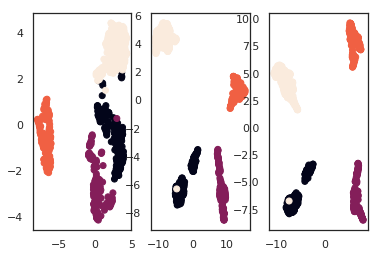

t=15


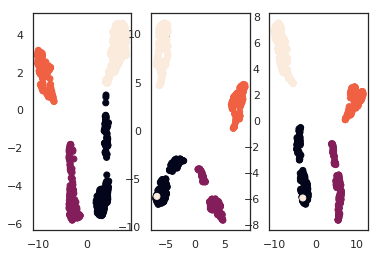

t=20


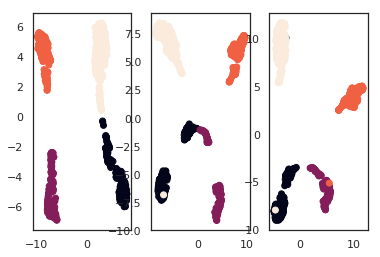

t=25


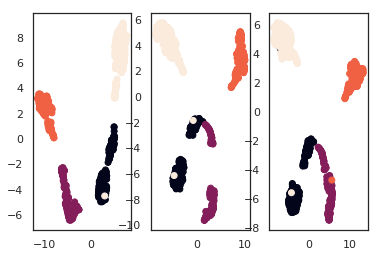

t=30


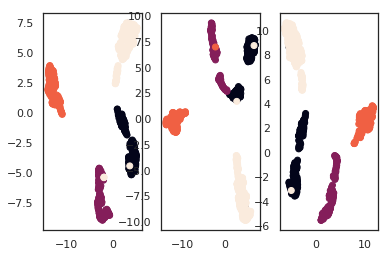

t=35


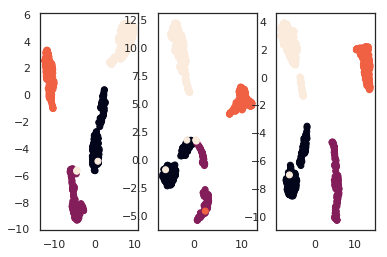

t=40


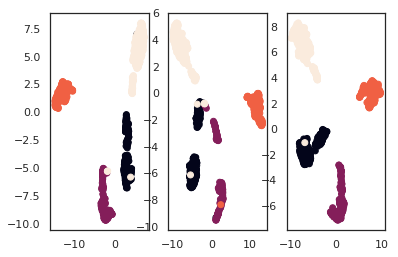

t=45


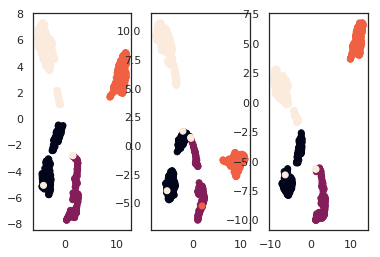

t=50


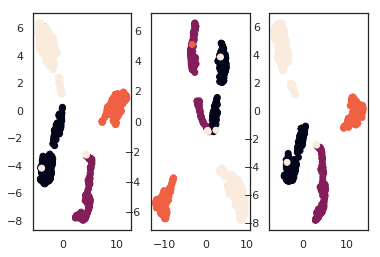

t=55


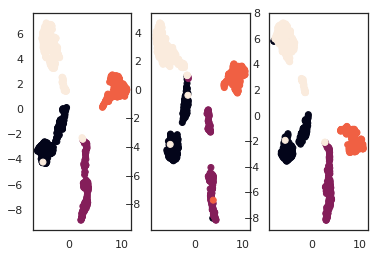

t=60


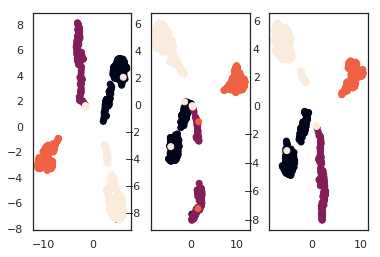

In [ ]:
t_list = range(5,100,5)

logit_model = Model(SIMS_input,d4)

pred_logit = logit_model.predict(train_x)

softmax_rep_list = []
for t in t_list:
    pred_t_softmax = np.exp(pred_logit/t)
    pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
            # softmax_representation_list.append(np.transpose(pred_t_softmax))
    rep = np.transpose(pred_t_softmax)
    ol
    embed_mat_euc = umap.UMAP(metric='euclidean',n_neighbors=10).fit_transform(rep)
    embed_mat_cor = umap.UMAP(metric='correlation',n_neighbors=10).fit_transform(rep)
    embed_mat_cos = umap.UMAP(metric='cosine',n_neighbors=10).fit_transform(rep)




    plt.figure()
    plt.subplot(1,3,1)
    plt.scatter(embed_mat_euc[:,0],embed_mat_euc[:,1],c=true_y)
    plt.subplot(1,3,2)
    plt.scatter(embed_mat_cor[:,0],embed_mat_cor[:,1],c=true_y)
    plt.subplot(1,3,3)
    plt.scatter(embed_mat_cos[:,0],embed_mat_cos[:,1],c=true_y)
    print('t={t}'.format(t=t))
    plt.show()


In [21]:
mean_profile_list = []
for i in range(num_cells):
    mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
mean_profile_list = np.array(mean_profile_list)
# num_cells_list = []
# for i in range(4):
#     num_cells_list.append(np.max(cell_dict[i+1]))
# cur = 0
# for n_cells in num_cells_list:
#     cur_train_x = train_x[cur:n_ce]

t=10 ARI=0.7761869074535749
t=30 ARI=0.5087358151816208
t=50 ARI=0.5028495666259686
t=70 ARI=0.5037507753717874
t=90 ARI=0.5053896161162212


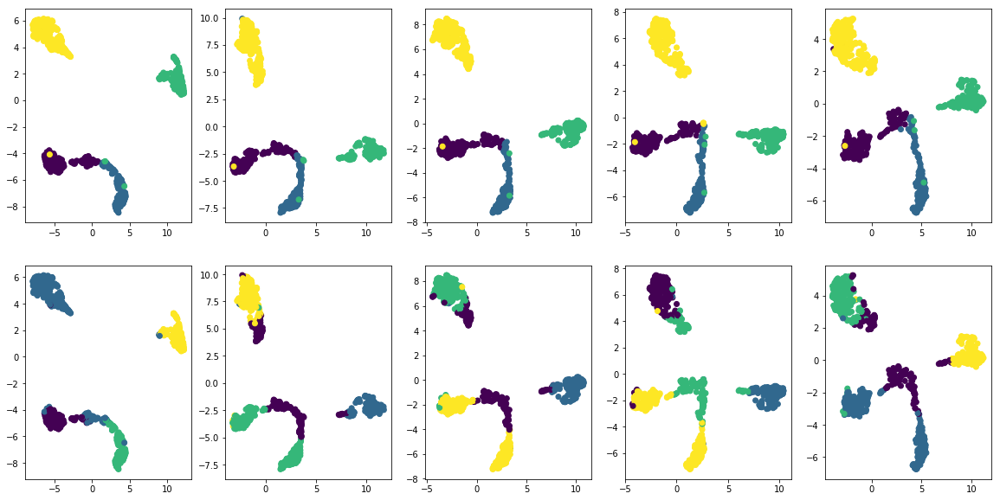

In [12]:
t_list = [10,30,50,70,90]
logit_model = Model(SIMS_input,d4)
pred_logit = logit_model.predict(train_x)
ARI_list = []
# 用来给subplot做idx
i=1
j=len(t_list)+1
plt.figure(figsize=(20,10))
for t in t_list:
    pred_t_softmax = np.exp(pred_logit/t)
    pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        # softmax_representation_list.append(np.transpose(pred_t_softmax))
    rep = np.transpose(pred_t_softmax)
    cur_corr_mat = squareform(pdist(rep,'correlation'))
    cur_corr_mat = 1/(1+cur_corr_mat)
    cur_label = SpectralClustering(n_clusters=4,affinity='precomputed').fit_predict(cur_corr_mat)
    cur_ARI = metrics.adjusted_rand_score(true_y, cur_label)
    ARI_list.append(cur_ARI)
    print('t={t} ARI={ARI}'.format(t=t,ARI=cur_ARI))
    cur_embed = umap.UMAP(metric='correlation').fit_transform(rep)
    plt.subplot(2,len(t_list),i)
    plt.scatter(cur_embed[:,0],cur_embed[:,1],c=true_y)
    plt.subplot(2,len(t_list),j)
    plt.scatter(cur_embed[:,0],cur_embed[:,1],c=cur_label)


    i+=1
    j+=1
plt.show()

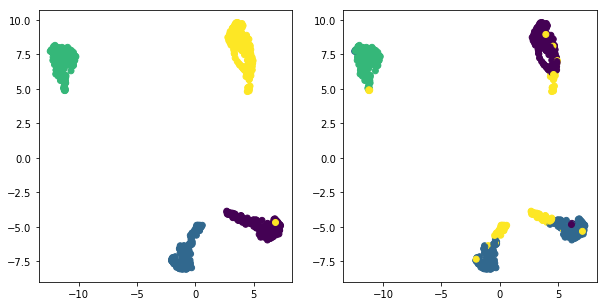

mean ARI=0.6204558855436634


In [23]:
train_x_norm = train_x/np.percentile(train_x,80,axis=1,keepdims=True)
train_x_norm = np.log(train_x_norm+1)
# train_x_norm = StandardScaler().fit_transform(train_x_norm)
mean_profile_list_norm = []
for i in range(num_cells):
    mean_profile_list_norm.append(np.mean(train_x_norm[cell_idx==i+1,:],axis=0))
mean_profile_list_norm = np.array(mean_profile_list_norm)
mean_embed = umap.UMAP(metric='euclidean').fit_transform(mean_profile_list_norm)
mean_label = SpectralClustering(n_clusters=4).fit_predict(mean_profile_list_norm)
plt.figure(figsize=(10,5))
plt.subplot(1,2,1)
plt.scatter(mean_embed[:,0],mean_embed[:,1],c=true_y)
plt.subplot(1,2,2)
plt.scatter(mean_embed[:,0],mean_embed[:,1],c=mean_label)
plt.show()
mean_ARI = metrics.adjusted_rand_score(true_y, mean_label)
print('mean ARI={ARI}'.format(ARI=mean_ARI))



In [7]:
_,unique_idx = np.unique(cell_idx,return_index=True)
true_y = cell_type[unique_idx]
np.unique(true_y)

array([1, 2, 3, 4], dtype=int32)

In [29]:
rst_dump = {
    'aa':1
}

In [48]:
rst_dump

{'Median_norm': {'Non_projection': {'AMI': [0.62607763642538961,
    0.62510195273209257,
    0.62607763642538961,
    0.62460272871089295,
    0.62460272871089295,
    0.62589408016112968,
    0.62589408016112968,
    0.62607763642538972,
    0.62607763642538961,
    0.62716769178253462],
   'ARI': [0.63305718435097014,
    0.63025376758032881,
    0.63137690789487655,
    0.63137690789487655,
    0.63137690789487655,
    0.62955670188337454,
    0.63137690789487655,
    0.63314542489327008,
    0.6325192084231287,
    0.63137690789487655],
   'KNN': [array([ 1.        ,  0.97222222,  0.98611111,  1.        ,  0.98591549,
            1.        ,  1.        ,  0.98550725,  0.98550725,  1.        ]),
    array([ 0.98611111,  1.        ,  0.98611111,  1.        ,  0.98591549,
            1.        ,  1.        ,  0.98550725,  0.98550725,  0.98550725]),
    array([ 0.97222222,  1.        ,  1.        ,  1.        ,  0.97183099,
            0.98571429,  0.98550725,  1.        ,  1.        

In [ ]:
# mean_total
train_x_total = train_x/np.sum(train_x,axis=1,keepdims=True)
train_x_total = np.log(train_x_total+1)
mean_profile_list_total = []
for i in range(num_cells):
    mean_profile_list_total.append(np.mean(train_x_total[cell_idx==i+1,:],axis=0))
mean_profile_list_total = np.array(mean_profile_list_total)


#mean median
train_x_median = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
train_x_median = np.log(train_x_median+1)
mean_profile_list_median = []
for i in range(num_cells):
    mean_profile_list_median.append(np.mean(train_x_median[cell_idx==i+1,:],axis=0))
mean_profile_list_median = np.array(mean_profile_list_median)



# mean
mean_profile_list = []
for i in range(num_cells):
    mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
mean_profile_list = np.array(mean_profile_list)


# tsne_param_list = [10,20,30,40,50]
# umap_param_list = [5,10,15,20,25,30]
projection_dim = 10
mean_variant_list = ['Non_norm','Total_norm','Median_norm']
projection_list = ['Non_projection','PCA','TSNE','UMAP']
metrics_list = ['AMI','NMI','ARI','KNN']
rst_dump = {}
run_times = 10

for _ in range(run_times):
    for mean_variant in mean_variant_list:
        cur_representation = None
        if mean_variant == 'Non_norm':
            cur_representation = mean_profile_list
        elif mean_variant == 'Total_norm':
            cur_representation = mean_profile_list_total
        elif mean_variant == 'Median_norm':
            cur_representation = mean_profile_list_median
        if mean_variant not in rst_dump:
            rst_dump[mean_variant] = {}
        for projection in projection_list:
            cur_embed = None
            if projection=='Non_projection':
                cur_embed = cur_representation
            elif projection=='PCA':
                cur_embed = PCA(n_components=projection_dim).fit_transform(cur_representation)
            elif projection=='TSNE':
                cur_embed = TSNE(n_components=projection_dim,metric='euclidean',verbose=False,method='exact').fit_transform(cur_representation)
            elif projection=='UMAP':
                cur_embed = umap.UMAP(n_components=projection_dim,metric='euclidean',verbose=False).fit_transform(cur_representation)
            if projection not in rst_dump[mean_variant]:
                rst_dump[mean_variant][projection] = {}
            for metric in metrics_list:
                cur_rst = None
                cur_label = KMeans(n_clusters=4).fit_predict(cur_embed)
                if metric=='AMI':
                    cur_rst = metrics.adjusted_mutual_info_score(true_y,cur_label)
                elif metric=='NMI':
                    cur_rst = metrics.normalized_mutual_info_score(true_y,cur_label)
                elif metric=='ARI':
                    cur_rst = metrics.adjusted_rand_score(true_y,cur_label)
                elif metric=='KNN':
                    kf = StratifiedKFold(n_splits=10,shuffle=True)
                    knn = KNeighborsClassifier(metric='euclidean')
                    cur_rst=cross_val_score(knn, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                if metric not in rst_dump[mean_variant][projection]:
                    rst_dump[mean_variant][projection][metric] = [cur_rst]
                else:
                    rst_dump[mean_variant][projection][metric].append(cur_rst)
                print(str(_),mean_variant,projection,metric,'|',cur_rst)



pickle.dump(rst_dump,open("/home/yzy/SIMS/mean_rst_dump_4cellline_1031.pkl","wb"))


            

        




0 Non_norm Non_projection AMI | 0.282140319253
0 Non_norm Non_projection NMI | 0.291146973397
0 Non_norm Non_projection ARI | 0.190352081834
0 Non_norm Non_projection KNN | [ 0.91666667  0.95833333  1.          0.94444444  0.92957746  0.98571429
  0.98550725  0.89855072  0.95652174  0.94202899]
0 Non_norm PCA AMI | 0.282140319253
0 Non_norm PCA NMI | 0.291146973397
0 Non_norm PCA ARI | 0.187698181498
0 Non_norm PCA KNN | [ 0.97222222  0.95833333  0.91666667  0.91666667  0.94366197  0.94285714
  0.98550725  0.97101449  0.97101449  0.98550725]
0 Non_norm TSNE AMI | 0.280559457511
0 Non_norm TSNE NMI | 0.315608017575
0 Non_norm TSNE ARI | 0.306577872644
0 Non_norm TSNE KNN | [ 0.93055556  0.94444444  0.97222222  0.91666667  0.92957746  0.91428571
  0.95652174  0.94202899  0.92753623  1.        ]
0 Non_norm UMAP AMI | 0.406015278459
0 Non_norm UMAP NMI | 0.409272283814
0 Non_norm UMAP ARI | 0.29484022732
0 Non_norm UMAP KNN | [ 0.93055556  0.90277778  0.93055556  0.90277778  0.90140845  0.

In [106]:
# pixel_total
train_x_total = train_x/np.sum(train_x,axis=1,keepdims=True)
train_x_total = np.log(train_x_total+1)

# pixel median
train_x_median = train_x/np.percentile(train_x,50,axis=1,keepdims=True)
train_x_median = np.log(train_x_median+1)


# mean


# tsne_param_list = [10,20,30,40,50]
# umap_param_list = [5,10,15,20,25,30]
projection_dim = 10
mean_variant_list = ['Non_norm','Total_norm','Median_norm']
projection_list = ['Non_projection','PCA','TSNE','UMAP']
metrics_list = ['AMI','NMI','ARI','KNN']
rst_dump = {}
run_times = 10

for _ in range(run_times):
    for mean_variant in mean_variant_list:
        cur_representation = None
        if mean_variant == 'Non_norm':
            cur_representation = train_x
        elif mean_variant == 'Total_norm':
            cur_representation = train_x_total
        elif mean_variant == 'Median_norm':
            cur_representation = train_x_median
        if mean_variant not in rst_dump:
            rst_dump[mean_variant] = {}
        for projection in projection_list:
            cur_embed = None
            if projection=='Non_projection':
                cur_embed = cur_representation
            elif projection=='PCA':
                cur_embed = PCA(n_components=projection_dim).fit_transform(cur_representation)
            elif projection=='TSNE':
#                 cur_embed = TSNE(n_components=projection_dim,metric='euclidean',verbose=True,method='exact').fit_transform(cur_representation)
                cur_embed = cur_representation
            elif projection=='UMAP':
                cur_embed = umap.UMAP(n_components=projection_dim,metric='euclidean',verbose=True).fit_transform(cur_representation)
            if projection not in rst_dump[mean_variant]:
                rst_dump[mean_variant][projection] = {}
            for metric in metrics_list:
                cur_rst = None
#                 cur_label = KMeans(n_clusters=4).fit_predict(cur_embed)
                cur_label = majorvote_clustering(cur_embed,cell_idx,4,norm=True)
                if metric=='AMI':
                    cur_rst = metrics.adjusted_mutual_info_score(true_y,cur_label)
                elif metric=='NMI':
                    cur_rst = metrics.normalized_mutual_info_score(true_y,cur_label)
                elif metric=='ARI':
                    cur_rst = metrics.adjusted_rand_score(true_y,cur_label)
                elif metric=='KNN':
                    cur_rst = 0
#                     kf = StratifiedKFold(n_splits=10,shuffle=True)
#                     knn = KNeighborsClassifier(metric='euclidean')
#                     cur_rst=cross_val_score(knn, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                if metric not in rst_dump[mean_variant][projection]:
                    rst_dump[mean_variant][projection][metric] = [cur_rst]
                else:
                    rst_dump[mean_variant][projection][metric].append(cur_rst)
                print(str(_),mean_variant,projection,metric,'|',cur_rst)



pickle.dump(rst_dump,open("/home/yzy/SIMS/vote_norm_rst_dump_4cellline_1031.pkl","wb"))


            

        





0 Non_norm Non_projection AMI | 0.276036412688
0 Non_norm Non_projection NMI | 0.28854593985
0 Non_norm Non_projection ARI | 0.193282679097
0 Non_norm Non_projection KNN | 0
0 Non_norm PCA AMI | 0.275055304879
0 Non_norm PCA NMI | 0.290929955173
0 Non_norm PCA ARI | 0.190083789398
0 Non_norm PCA KNN | 0
0 Non_norm TSNE AMI | 0.276036412688
0 Non_norm TSNE NMI | 0.289456883547
0 Non_norm TSNE ARI | 0.193282679097
0 Non_norm TSNE KNN | 0
UMAP(a=None, angular_rp_forest=False, b=None, init='spectral',
   learning_rate=1.0, local_connectivity=1.0, metric='euclidean',
   metric_kwds=None, min_dist=0.1, n_components=10, n_epochs=None,
   n_neighbors=15, negative_sample_rate=5, random_state=None,
   repulsion_strength=1.0, set_op_mix_ratio=1.0, spread=1.0,
   target_metric='categorical', target_metric_kwds=None,
   target_n_neighbors=-1, target_weight=0.5, transform_queue_size=4.0,
   transform_seed=42, verbose=True)
Construct fuzzy simplicial set
	 0  /  14
	 1  /  14
	 2  /  14
	 3  /  14
	 

In [119]:
# for i in range(n_softmax):
#     reset_weights(softmax_model)
    
#     history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64)
softmax_representation_list = []
t_list = range(5,15)
for pred_logit in logit_list:  
    for t in t_list:
        print(i)
    #     history=softmax_model.fit([train_x,cur_label],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=50,shuffle=True,batch_size=64,verbose=True)

#         pred_logit = logit_model.predict(train_x)
        pred_t_softmax = np.exp(pred_logit/t)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        softmax_representation_list.append(np.transpose(pred_t_softmax))




9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9
9


In [126]:
sio.savemat('cellline_member_mat_original_t5~t20',{'member_mat_original':member_mat_original})
sio.savemat('cellline_member_mat_embed_t5~t20',{'member_mat_embed':member_mat_embed})

In [125]:
sio.savemat('cellline_true_y',{'cellline_true_y':true_y})

In [ ]:
k_list = [2,3,4,5,6,7,8]
CM_list = [np.zeros(shape=(num_cells,num_cells))]*len(k_list)
CM_list_embed = [np.zeros(shape=(num_cells,num_cells))]*len(k_list)
member_mat_original = []
member_mat_embed = []

# n_neighbor_list = [5,10]
n_neighbor_list = [15]


nan_repair_max_times = 10
times = 1
for n_time in range(times):
    rep_count = -1
    for rep in softmax_representation_list:
        cur_corr_mat = squareform(pdist(rep),'correlation')
        cur_corr_mat = 1/(1+cur_corr_mat)
        rep_count += 1
        for nn in n_neighbor_list:
            cur_embed = umap.UMAP(metric='correlation',n_neighbors=nn).fit_transform(rep)
            nan_repair_times = 0
            while np.any(np.isnan(cur_embed)) and nan_repair_times<=nan_repair_max_times:
                nan_repair_times+=1
                cur_embed = umap.UMAP(metric='correlation',n_neighbors=nn).fit_transform(rep)
            if np.any(np.isnan(cur_embed)):
                print('***************************',n_time,rep_count,nn)
                continue

            for k in k_list:
                print(n_time,rep_count,nn,k)
                cur_label = SpectralClustering(n_clusters=k,affinity='precomputed').fit_predict(cur_corr_mat)
                member_mat_original.append(cur_label)
                cur_label_embed = KMeans(k).fit_predict(cur_embed)
                member_mat_embed.append(cur_label_embed)
                CM_list[k-2] = CM_list[k-2] + label2CM(cur_label)
                CM_list_embed[k-2] = CM_list_embed[k-2] + label2CM(cur_label_embed)







0 0 15 2
0 0 15 3
0 0 15 4
0 0 15 5
0 0 15 6
0 0 15 7
0 0 15 8
0 1 15 2
0 1 15 3
0 1 15 4
0 1 15 5
0 1 15 6
0 1 15 7
0 1 15 8
0 2 15 2
0 2 15 3
0 2 15 4
0 2 15 5
0 2 15 6
0 2 15 7
0 2 15 8
0 3 15 2
0 3 15 3
0 3 15 4
0 3 15 5
0 3 15 6
0 3 15 7
0 3 15 8
0 4 15 2
0 4 15 3
0 4 15 4
0 4 15 5
0 4 15 6
0 4 15 7
0 4 15 8
0 5 15 2
0 5 15 3
0 5 15 4
0 5 15 5
0 5 15 6
0 5 15 7
0 5 15 8
0 6 15 2
0 6 15 3
0 6 15 4
0 6 15 5
0 6 15 6
0 6 15 7
0 6 15 8
0 7 15 2
0 7 15 3
0 7 15 4
0 7 15 5
0 7 15 6
0 7 15 7
0 7 15 8
0 8 15 2
0 8 15 3
0 8 15 4
0 8 15 5
0 8 15 6
0 8 15 7
0 8 15 8
0 9 15 2
0 9 15 3
0 9 15 4
0 9 15 5
0 9 15 6
0 9 15 7
0 9 15 8
0 10 15 2
0 10 15 3
0 10 15 4
0 10 15 5
0 10 15 6
0 10 15 7
0 10 15 8
0 11 15 2
0 11 15 3
0 11 15 4
0 11 15 5
0 11 15 6
0 11 15 7
0 11 15 8
0 12 15 2
0 12 15 3
0 12 15 4
0 12 15 5
0 12 15 6
0 12 15 7
0 12 15 8
0 13 15 2
0 13 15 3
0 13 15 4
0 13 15 5
0 13 15 6
0 13 15 7
0 13 15 8
0 14 15 2
0 14 15 3
0 14 15 4
0 14 15 5
0 14 15 6
0 14 15 7
0 14 15 8
0 15 15 2
0 15 15 3


In [ ]:
tsne_param_list = [10,20,30,40,50]
umap_param_list = [5,10,15,20,25,30]
projection_dim = 10
# mean_variant_list = ['Non_norm','Total_norm','Median_norm']
# temperature_list = [10,20,30,40,50,60,70,80,90,100]
temperature_list = range(1,20)
train_epoch = 200
train_batch_size = 64
projection_list = ['Non_projection','PCA','TSNE','UMAP']
metrics_list = ['AMI','NMI','ARI','KNN']
rst_dump = {}
logit_list = pickle.load(open("/home/yzy/SIMS/softmax_logit_dump_4cellline_1031_new.pkl","rb"))
# logit_list = logit_list[1:]
run_times = 10

   



# for _ in range(run_times):
#     reset_weights(softmax_model)
#     history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=200,shuffle=True,batch_size=64)
#     logit_model = Model(SIMS_input,d4)
#     pred_logit = logit_model.predict(train_x)
#     logit_list.append(pred_logit)
_=0
for pred_logit in logit_list:
    _+=1
    for temperature in temperature_list:
        pred_t_softmax = np.exp(pred_logit/temperature)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        pred_t_softmax[np.isnan(pred_t_softmax)]=1
        cur_representation = np.transpose(pred_t_softmax)
        if temperature not in rst_dump:
            rst_dump[temperature] = {}
        
        
        for projection in projection_list:
            cur_embed = None
            if projection=='Non_projection':
                cur_embed = cur_representation
            elif projection=='PCA':
                cur_embed = PCA(n_components=projection_dim).fit_transform(cur_representation)
            elif projection=='TSNE':
                cur_embed = TSNE(n_components=projection_dim,metric='correlation',verbose=False,method='exact').fit_transform(cur_representation)
            elif projection=='UMAP':
                cur_embed = umap.UMAP(n_components=projection_dim,metric='correlation',verbose=False).fit_transform(cur_representation)
            if projection not in rst_dump[temperature]:
                rst_dump[temperature][projection] = {}
            for metric in metrics_list:
                cur_rst = None
                if projection in ['Non_projection','PCA']:
                    corr_mat = squareform(pdist(cur_embed,'correlation'))
                    corr_mat = 1/(1+corr_mat)
                    cur_label = SpectralClustering(n_clusters=4,affinity='precomputed').fit_predict(corr_mat)
                else:
                    cur_label = KMeans(n_clusters=4).fit_predict(cur_embed)
                if metric=='AMI':
                    cur_rst = metrics.adjusted_mutual_info_score(true_y,cur_label)
                elif metric=='NMI':
                    cur_rst = metrics.normalized_mutual_info_score(true_y,cur_label)
                elif metric=='ARI':
                    cur_rst = metrics.adjusted_rand_score(true_y,cur_label)
                elif metric=='KNN':
                    kf = StratifiedKFold(n_splits=10,shuffle=True)
                    knn = KNeighborsClassifier(metric='correlation')
                    cur_rst=cross_val_score(knn, cur_embed, true_y, scoring='accuracy',cv=kf,verbose=0)
                if metric not in rst_dump[temperature][projection]:
                    rst_dump[temperature][projection][metric] = [cur_rst]
                else:
                    rst_dump[temperature][projection][metric].append(cur_rst)
                print(str(_),temperature,projection,metric,'|',cur_rst)



pickle.dump(rst_dump,open("/home/yzy/SIMS/softmax_rst_dump_4cellline_1031_t1~t20.pkl","wb"))
# pickle.dump(logit_list,open("/home/yzy/SIMS/softmax_logit_dump_4cellline_1031_new.pkl","wb"))



/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


1 1 Non_projection AMI | 0.0573872417089
1 1 Non_projection NMI | 0.117731850939
1 1 Non_projection ARI | -0.00572669241304
1 1 Non_projection KNN | [ 0.65277778  0.65277778  0.66666667  0.69444444  0.81690141  0.74285714
  0.72463768  0.79710145  0.73913043  0.71014493]
1 1 PCA AMI | 0.0730298654925
1 1 PCA NMI | 0.105110013908
1 1 PCA ARI | 0.00100071271751
1 1 PCA KNN | [ 0.77777778  0.66666667  0.81944444  0.80555556  0.71830986  0.7
  0.73913043  0.76811594  0.7826087   0.69565217]
1 1 TSNE AMI | 0.00278156082777
1 1 TSNE NMI | 0.0097581073347
1 1 TSNE ARI | 0.00762747590973
1 1 TSNE KNN | [ 0.29166667  0.33333333  0.38888889  0.29166667  0.29577465  0.3
  0.33333333  0.39130435  0.33333333  0.34782609]
1 1 UMAP AMI | 0.054984740627
1 1 UMAP NMI | 0.0650483086885
1 1 UMAP ARI | 0.0232394580499
1 1 UMAP KNN | [ 0.88888889  0.875       0.84722222  0.91666667  0.85915493  0.85714286
  0.85507246  0.89855072  0.89855072  0.89855072]
1 2 Non_projection AMI | 0.438300833668
1 2 Non_proj

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


2 1 Non_projection AMI | 0.0500782781724
2 1 Non_projection NMI | 0.097896514812
2 1 Non_projection ARI | -0.00650120520445
2 1 Non_projection KNN | [ 0.73611111  0.75        0.66666667  0.72222222  0.73239437  0.78571429
  0.66666667  0.60869565  0.7826087   0.73913043]
2 1 PCA AMI | 0.0779460559244
2 1 PCA NMI | 0.110500539676
2 1 PCA ARI | 0.0011995656303
2 1 PCA KNN | [ 0.75        0.76388889  0.68055556  0.76388889  0.70422535  0.7
  0.69565217  0.65217391  0.5942029   0.69565217]
2 1 TSNE AMI | 0.00562958863254
2 1 TSNE NMI | 0.00934866099486
2 1 TSNE ARI | 0.00319429253797
2 1 TSNE KNN | [ 0.375       0.43055556  0.31944444  0.33333333  0.30985915  0.24285714
  0.23188406  0.23188406  0.31884058  0.23188406]
2 1 UMAP AMI | 0.0952708841561
2 1 UMAP NMI | 0.10847933784
2 1 UMAP ARI | 0.0367271276336
2 1 UMAP KNN | [ 0.88888889  0.88888889  0.83333333  0.79166667  0.84507042  0.91428571
  0.85507246  0.8115942   0.85507246  0.88405797]


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


2 2 Non_projection AMI | 0.464585130668
2 2 Non_projection NMI | 0.523803224211
2 2 Non_projection ARI | 0.336392879624
2 2 Non_projection KNN | [ 0.98611111  0.98611111  1.          1.          1.          1.          1.
  1.          0.97101449  1.        ]
2 2 PCA AMI | 0.353694976773
2 2 PCA NMI | 0.401892222709
2 2 PCA ARI | 0.324936167721
2 2 PCA KNN | [ 0.79166667  0.81944444  0.88888889  0.77777778  0.85915493  0.9
  0.79710145  0.86956522  0.7826087   0.85507246]
2 2 TSNE AMI | -0.0011763826841
2 2 TSNE NMI | 0.0188483462701
2 2 TSNE ARI | -0.000243118727492
2 2 TSNE KNN | [ 0.29166667  0.38888889  0.40277778  0.45833333  0.46478873  0.41428571
  0.42028986  0.37681159  0.42028986  0.4057971 ]
2 2 UMAP AMI | 0.976425342931
2 2 UMAP NMI | 0.977302136362
2 2 UMAP ARI | 0.983385394055
2 2 UMAP KNN | [ 1.          1.          1.          1.          0.98591549  0.98571429
  0.98550725  1.          0.98550725  1.        ]
2 3 Non_projection AMI | 0.577595698613
2 3 Non_projection N

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


5 1 Non_projection AMI | 0.0509806209837
5 1 Non_projection NMI | 0.106994976788
5 1 Non_projection ARI | -0.0072519259845
5 1 Non_projection KNN | [ 0.625       0.66666667  0.77777778  0.59722222  0.71830986  0.7
  0.75362319  0.7826087   0.69565217  0.69565217]
5 1 PCA AMI | 0.0837539137191
5 1 PCA NMI | 0.118253451911
5 1 PCA ARI | 0.00474107300841
5 1 PCA KNN | [ 0.68055556  0.76388889  0.70833333  0.65277778  0.69014085  0.67142857
  0.68115942  0.71014493  0.69565217  0.69565217]
5 1 TSNE AMI | 0.010620664638
5 1 TSNE NMI | 0.0221413910067
5 1 TSNE ARI | 0.014214486426
5 1 TSNE KNN | [ 0.29166667  0.29166667  0.375       0.34722222  0.28169014  0.27142857
  0.33333333  0.30434783  0.1884058   0.37681159]
5 1 UMAP AMI | 0.0811662764414
5 1 UMAP NMI | 0.0925425538972
5 1 UMAP ARI | 0.0379408341861
5 1 UMAP KNN | [ 0.81944444  0.81944444  0.76388889  0.81944444  0.90140845  0.84285714
  0.89855072  0.86956522  0.85507246  0.88405797]


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


5 2 Non_projection AMI | 0.477099820748
5 2 Non_projection NMI | 0.535165587058
5 2 Non_projection ARI | 0.352000595274
5 2 Non_projection KNN | [ 1.          1.          1.          1.          1.          1.          1.
  0.95652174  1.          1.        ]
5 2 PCA AMI | 0.383326005611
5 2 PCA NMI | 0.422427397317
5 2 PCA ARI | 0.378595327875
5 2 PCA KNN | [ 0.72222222  0.80555556  0.79166667  0.84722222  0.81690141  0.81428571
  0.8115942   0.82608696  0.75362319  0.82608696]
5 2 TSNE AMI | -0.000884334834724
5 2 TSNE NMI | 0.0215824457042
5 2 TSNE ARI | -0.00157565988244
5 2 TSNE KNN | [ 0.38888889  0.375       0.375       0.31944444  0.28169014  0.42857143
  0.37681159  0.33333333  0.39130435  0.34782609]
5 2 UMAP AMI | 0.973906681124
5 2 UMAP NMI | 0.974143664734
5 2 UMAP ARI | 0.984254795927
5 2 UMAP KNN | [ 0.98611111  0.98611111  0.98611111  0.98611111  1.          1.          1.
  1.          1.          1.        ]
5 3 Non_projection AMI | 0.560962948834
5 3 Non_projection N

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


7 1 Non_projection AMI | 0.0507289881157
7 1 Non_projection NMI | 0.102344115689
7 1 Non_projection ARI | -0.0068325081495
7 1 Non_projection KNN | [ 0.75        0.76388889  0.81944444  0.76388889  0.76056338  0.6
  0.79710145  0.7826087   0.75362319  0.72463768]
7 1 PCA AMI | 0.0647272868705
7 1 PCA NMI | 0.0978107519217
7 1 PCA ARI | -0.00209299550451
7 1 PCA KNN | [ 0.72222222  0.65277778  0.625       0.68055556  0.71830986  0.67142857
  0.71014493  0.82608696  0.71014493  0.71014493]
7 1 TSNE AMI | 0.00439937475398
7 1 TSNE NMI | 0.0108307942337
7 1 TSNE ARI | -8.44008444473e-05
7 1 TSNE KNN | [ 0.36111111  0.36111111  0.31944444  0.29166667  0.25352113  0.28571429
  0.39130435  0.4057971   0.33333333  0.26086957]
7 1 UMAP AMI | 0.079390315949
7 1 UMAP NMI | 0.0944946353838
7 1 UMAP ARI | 0.0434629294108
7 1 UMAP KNN | [ 0.875       0.81944444  0.83333333  0.84722222  0.85915493  0.84285714
  0.88405797  0.88405797  0.92753623  0.85507246]


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


7 2 Non_projection AMI | 0.442308750896
7 2 Non_projection NMI | 0.506082789804
7 2 Non_projection ARI | 0.310363734995
7 2 Non_projection KNN | [ 1.          1.          0.97222222  1.          1.          1.
  0.98550725  1.          1.          0.97101449]
7 2 PCA AMI | 0.243329383796
7 2 PCA NMI | 0.293745987945
7 2 PCA ARI | 0.222448484699
7 2 PCA KNN | [ 0.88888889  0.86111111  0.88888889  0.86111111  0.8028169   0.9
  0.79710145  0.84057971  0.8115942   0.85507246]
7 2 TSNE AMI | -0.000185967970063
7 2 TSNE NMI | 0.0226060422647
7 2 TSNE ARI | -0.00239309928902
7 2 TSNE KNN | [ 0.34722222  0.375       0.38888889  0.40277778  0.47887324  0.38571429
  0.39130435  0.4057971   0.42028986  0.42028986]
7 2 UMAP AMI | 0.973906681124
7 2 UMAP NMI | 0.974143664734
7 2 UMAP ARI | 0.984254795927
7 2 UMAP KNN | [ 1.          0.98611111  1.          0.98611111  0.98591549  0.98571429
  1.          1.          1.          1.        ]
7 3 Non_projection AMI | 0.556185666126
7 3 Non_projection 

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


8 1 Non_projection AMI | 0.0655911937113
8 1 Non_projection NMI | 0.12518006862
8 1 Non_projection ARI | 0.00785967042713
8 1 Non_projection KNN | [ 0.69444444  0.66666667  0.77777778  0.66666667  0.66197183  0.78571429
  0.68115942  0.69565217  0.7826087   0.63768116]
8 1 PCA AMI | 0.0789808884608
8 1 PCA NMI | 0.112967524366
8 1 PCA ARI | 0.00344093368387
8 1 PCA KNN | [ 0.75        0.75        0.68055556  0.77777778  0.8028169   0.8
  0.82608696  0.8115942   0.72463768  0.79710145]
8 1 TSNE AMI | 0.0137961327231
8 1 TSNE NMI | 0.0317906878266
8 1 TSNE ARI | 0.0131653056562
8 1 TSNE KNN | [ 0.29166667  0.33333333  0.27777778  0.375       0.4084507   0.38571429
  0.31884058  0.2173913   0.27536232  0.34782609]
8 1 UMAP AMI | 0.0722592800517
8 1 UMAP NMI | 0.085075444022
8 1 UMAP ARI | 0.0270579723187
8 1 UMAP KNN | [ 0.875       0.88888889  0.90277778  0.86111111  0.81690141  0.84285714
  0.89855072  0.84057971  0.84057971  0.89855072]
8 2 Non_projection AMI | 0.475413181908
8 2 Non_p

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


9 1 Non_projection AMI | 0.0504754391046
9 1 Non_projection NMI | 0.0991526748167
9 1 Non_projection ARI | 0.00540928859457
9 1 Non_projection KNN | [ 0.80555556  0.83333333  0.79166667  0.72222222  0.8028169   0.81428571
  0.79710145  0.71014493  0.73913043  0.63768116]
9 1 PCA AMI | 0.0765464201057
9 1 PCA NMI | 0.110633131127
9 1 PCA ARI | 0.000528427795648
9 1 PCA KNN | [ 0.73611111  0.68055556  0.75        0.70833333  0.83098592  0.7
  0.7826087   0.76811594  0.72463768  0.71014493]
9 1 TSNE AMI | 0.0022668510743
9 1 TSNE NMI | 0.0119994083208
9 1 TSNE ARI | 0.00592714449288
9 1 TSNE KNN | [ 0.38888889  0.36111111  0.31944444  0.27777778  0.3943662   0.38571429
  0.31884058  0.23188406  0.33333333  0.37681159]
9 1 UMAP AMI | 0.086157165233
9 1 UMAP NMI | 0.0975261733397
9 1 UMAP ARI | 0.0369991742219
9 1 UMAP KNN | [ 0.77777778  0.90277778  0.84722222  0.86111111  0.90140845  0.87142857
  0.84057971  0.88405797  0.85507246  0.79710145]


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:30: RuntimeWarning: overflow encountered in exp
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:31: RuntimeWarning: invalid value encountered in true_divide


9 2 Non_projection AMI | 0.429034693365
9 2 Non_projection NMI | 0.49584001074
9 2 Non_projection ARI | 0.293498395387
9 2 Non_projection KNN | [ 1.          1.          0.98611111  1.          1.          0.98571429
  1.          0.97101449  1.          1.        ]
9 2 PCA AMI | 0.383890097679
9 2 PCA NMI | 0.429788777243
9 2 PCA ARI | 0.363767048374
9 2 PCA KNN | [ 0.91666667  0.875       0.88888889  0.84722222  0.84507042  0.84285714
  0.91304348  0.84057971  0.84057971  0.85507246]
9 2 TSNE AMI | -8.41871911161e-06
9 2 TSNE NMI | 0.0186638264333
9 2 TSNE ARI | -0.000431077943541
9 2 TSNE KNN | [ 0.52777778  0.5         0.47222222  0.43055556  0.42253521  0.44285714
  0.52173913  0.33333333  0.4057971   0.56521739]
9 2 UMAP AMI | 0.980479576842
9 2 UMAP NMI | 0.980658319813
9 2 UMAP ARI | 0.988364566236
9 2 UMAP KNN | [ 1.          1.          1.          0.98611111  1.          1.          1.
  0.98550725  0.98550725  1.        ]
9 3 Non_projection AMI | 0.532046533935
9 3 Non_proj

In [111]:
1+1

2

In [98]:
pred_t_softmax = np.exp(pred_logit/temperature)
pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
pred_t_softmax[np.isnan(pred_t_softmax)]=1


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:1: RuntimeWarning: overflow encountered in exp
  if __name__ == '__main__':
/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:2: RuntimeWarning: invalid value encountered in true_divide
  from ipykernel import kernelapp as app


In [103]:
rst_dump

{1: {'Non_projection': {'AMI': [0.057387241708868705, 0.050078278172441107],
   'ARI': [-0.0057266924130398586],
   'KNN': [array([ 0.69444444,  0.65277778,  0.72222222,  0.68055556,  0.78873239,
            0.78571429,  0.69565217,  0.75362319,  0.63768116,  0.75362319])],
   'NMI': [0.11630472299919872]},
  'PCA': {'AMI': [0.075543726486043031],
   'ARI': [0.0015268911968565363],
   'KNN': [array([ 0.80555556,  0.75      ,  0.66666667,  0.68055556,  0.73239437,
            0.72857143,  0.69565217,  0.75362319,  0.68115942,  0.75362319])],
   'NMI': [0.10844198156292775]},
  'TSNE': {'AMI': [0.0098079931503485575],
   'ARI': [0.01053241685302979],
   'KNN': [array([ 0.40277778,  0.40277778,  0.375     ,  0.38888889,  0.25352113,
            0.32857143,  0.42028986,  0.34782609,  0.27536232,  0.31884058])],
   'NMI': [0.014032242359359827]},
  'UMAP': {'AMI': [0.059479041716020101],
   'ARI': [0.027640447331910498],
   'KNN': [array([ 0.95833333,  0.875     ,  0.86111111,  0.86111111, 

In [90]:
b=a/np.sum(a,axis=1,keepdims=True)

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:1: RuntimeWarning: invalid value encountered in true_divide
  if __name__ == '__main__':


In [95]:
b[np.isnan(b)]=1

array([ 25.59420776,  10.32832336,  18.07431221,  34.72233963,
        32.70453644,  32.81842041,  34.57018661,  24.75727272,
        33.24163055,  16.82353401,   4.12779474,  32.53871155,
        20.55069923,  27.56026268,  34.45657349,  28.39626503,
        36.25389099,  14.46654987,  34.18328476,  30.74007034,
        10.83825397,  30.63479996,  31.38829613,  34.47069931,
        28.21143913,  32.7243042 ,  33.52941132,  33.87288284,
        31.99296761,  32.90219116,  34.31657791,  32.77772141,
        33.89428711,  29.75397491,  32.96408844,  27.32205391,
        35.08617401,  36.11362457,  39.48550034,  30.22997093,
        40.34594345,  20.1694355 ,   4.09157515,  32.47333908,
         9.12343025,   8.30591393,  10.06507397,  35.07472229,
        17.11633301,  42.19297028,  35.12594223,  34.62519836,
        35.42537689,  32.25922394,  43.02506638,  36.49113846,
        42.51724243,  34.88371277,  34.99103546,  37.34679413,
        12.5338192 ,  27.95546722,  28.40286446,  35.05

In [58]:
pickle.dump(logit_list,open("/home/yzy/SIMS/softmax_logit_dump_4cellline_1031.pkl","wb"))



In [9]:
noisy_pixel_perc_list = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
# noisy_pixel_perc_list = [0.9,1.0]
# noisy_pixel_perc_list = [1,2,3,4,5,6,7,8,9,10]
# noisy_pixel_perc_list = [10]

net_epochs = 200

a_list = {}
b_list = {}
c_list= {}
d_list = {}
e_list = {}
f_list = {}
g_list = {}
h_list = {}
data_dump = {}
rst_dump = {}
for noisy_perc in noisy_pixel_perc_list:
    
    a_list[noisy_perc] = []
    b_list[noisy_perc] = []
    c_list[noisy_perc] = []
    d_list[noisy_perc] = []
    e_list[noisy_perc] = []
    f_list[noisy_perc] = []
    g_list[noisy_perc] = []
    h_list[noisy_perc] = []


#     初始化数据集
    for i in range(4+1,len(batch_dict)+1):
        del batch_dict[i]
        del cell_dict[i]
        del label_dict[i]
        del pos_dict[i]
    
    
    for i in range(4):
        simu_base = i+1
        cur_batch_num = len(batch_dict)
#         simu_data_1,simu_cellidx = simulate_data(simu_base,2,0,noisy_perc,250)
        simu_data_1,simu_cellidx = simulate_data(simu_base,1,3,0,int(noisy_perc*274))
#         simu_data_1,simu_cellidx = simulate_data(simu_base,4,noisy_perc,0,250)



        batch_dict[cur_batch_num+1] = simu_data_1
        # batch_dict[cur_batch_num+1] = 111
        cell_dict[cur_batch_num+1] = simu_cellidx
        label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
        pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])
    
    
    # 有label情况的处理

    # 1.147 0.025
    batch_num_list = [1,2,3,4,5,6,7,8]
    # 5行
    # 1,2,3,4,5,6
    # batch_num = 4
    top_n_var = 250
    train_x_all = None
    cell_idx_all = None
    cell_type_all = None
    cell_pos_all = None
    batch_idx_all = None
    num_cells_all = 0


    for batch_num in batch_num_list:
        train_x = batch_dict[batch_num]
        # train_x = eval('batch_dict_{norm_type}[batch_num]'.format(norm_type=norm_type))
        # train_x = batch_dict[batch_num]
        cell_idx = cell_dict[batch_num]
        cell_type = label_dict[batch_num]
        cell_pos = pos_dict[batch_num]
        # batch_FE = FE_dict[batch_num]
        cell_related_ind = (cell_idx!=0)

        num_cells = int(np.max(cell_idx))
        # num_cells = 2
        train_x = train_x[cell_related_ind,:]

        cell_idx = cell_idx[cell_related_ind]
        cell_type = cell_type[cell_related_ind]
        # cell_type = np.ones(shape=cell_idx.shape)
        cell_pos = cell_pos[cell_related_ind]





        var_li = []
        normed_var_li = []
        for i in range(train_x.shape[1]):
            cur_col = train_x[:,i]
        #     cur_col= cur_row/np.sum(cur_col)
        #     cur_entropy = entropy(cur_col)
            cur_var = np.var(cur_col)
            cur_normed_var = cur_var/np.mean(cur_col)
        #     entropy_li.append(cur_entropy)
            var_li.append(cur_var)
            normed_var_li.append(cur_normed_var)
        # entropy_li = np.array(entropy_li)
        var_li = np.array(var_li)
        normed_var_li = np.array(normed_var_li)
        sort_ind = np.flip(np.argsort(normed_var_li),axis=0)
        sort_val = np.flip(np.sort(normed_var_li),axis=0)
        plt.plot(sort_val)
        plt.show()


    #     train_x = train_x/np.percentile(train_x,80,axis=1,keepdims=True)
    #     train_x = np.log(train_x+1)


        if train_x_all is None:
            train_x_all = train_x
        else:
            train_x_all = np.vstack([train_x_all,train_x])
        if cell_idx_all is None:
            cell_idx_all = cell_idx
        else:
            cell_idx_all = np.hstack([cell_idx_all,cell_idx+np.max(cell_idx_all)])
        if cell_type_all is None:
            cell_type_all = cell_type
        else:
            cell_type_all = np.hstack([cell_type_all,cell_type])
        if cell_pos_all is None:
            cell_pos_all = cell_pos
        else:
            cell_pos_all = np.hstack([cell_pos_all,cell_pos])
        if batch_idx_all is None:
            batch_idx_all = batch_num*np.ones(shape=(cell_idx.shape))
        else:
            batch_idx_all = np.hstack([batch_idx_all,batch_num*np.ones(shape=(cell_idx.shape))])


    train_x = train_x_all
    cell_idx = cell_idx_all
    cell_type = cell_type_all
    cell_pos = cell_pos_all
    batch_idx = batch_idx_all
    num_cells = np.max(cell_idx)
    # train_x = StandardScaler().fit_transform(train_x)

    
    SIMS_input = Input(shape=(train_x.shape[1],))
    target_input = Input(shape=(1,))
    activa='relu'
    use_bias = False
    d1 = Dense(512,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(d1)


    d2 = Dense(256,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d2)
    d2 = Dense(low_dim,activation='linear',kernel_initializer='random_uniform',use_bias=use_bias)(d2)


    # d3 = Dense(64,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d3)


    # d4 = Dense(low_dim,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d3)
    d4 = Dense(num_cells,activation='linear',kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
    ####################MLP################################################################################
    centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
    centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center')([d2,centerloss_embed_layer])



    softmax_out = Activation('softmax',name='softmax')(d4)

    softmax_model = Model([SIMS_input,target_input],[softmax_out,centerloss_out])
    softmax_model.compile(optimizer=sgd(),loss=['categorical_crossentropy',lambda y_true,y_pred:y_pred],loss_weights=[1,0])
    onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
    rep_list = []
    for k in range(5):
        reset_weights(softmax_model)
        history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=net_epochs,shuffle=True,batch_size=128)
        t=100
        logit_model = Model(SIMS_input,d4)
        pred_logit = logit_model.predict(train_x)
        pred_t_softmax = np.exp(pred_logit/t)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        # softmax_representation_list.append(np.transpose(pred_t_softmax))
        rep = np.transpose(pred_t_softmax)
        rep_list.append(rep)
        mean_profile_list = []
        for i in range(num_cells):
            mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
        mean_profile_list = np.array(mean_profile_list)


        _,unique_idx = np.unique(cell_idx,return_index=True)
        true_y = cell_type[unique_idx]
        np.unique(true_y)




        true_yy = true_y.copy()
        true_yy[true_yy>4] = true_yy[true_yy>4]
        from sklearn.model_selection import *
        from sklearn.model_selection import cross_val_score
        from sklearn.svm import *
        from sklearn.neighbors import *
        kf = StratifiedKFold(n_splits=5,shuffle=True)
        # for train,test in kf.split(mean_profile_list,true_y):

        #     print(train.shape)
        #     print(test.shape)

        clf = SVC(verbose=True)
        clf2 = SVC(verbose=True)
        knn1 = KNeighborsClassifier(metric='euclidean')
        knn2 = KNeighborsClassifier(metric='correlation')
        mean_profile_list_pca = PCA(n_components=10)
        mean_profile_list_pca.fit(mean_profile_list)
        mean_profile_list_10 = mean_profile_list_pca.transform(mean_profile_list)
        mean_profile_list_tsne = umap.UMAP(n_components=2,metric='euclidean').fit_transform(mean_profile_list)
        rep_tsne = umap.UMAP(n_components=2,metric='correlation').fit_transform(rep)
        rep_pca = PCA(n_components=10)
        rep_pca.fit(rep)
        rep_10 = rep_pca.transform(rep)
        a=cross_val_score(knn1, mean_profile_list, true_yy, scoring='accuracy',cv=kf,verbose=1)
        b=cross_val_score(knn2, rep, true_yy, scoring='accuracy',cv=kf,verbose=1)
        c = cross_val_score(knn1, mean_profile_list_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
        d = cross_val_score(knn2, rep_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
        e = cross_val_score(knn1, mean_profile_list_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)
        f = cross_val_score(knn1, rep_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)
        
        cur_corr_mat = squareform(pdist(rep),'correlation')
        cur_corr_mat = 1/(1+cur_corr_mat)


        cur_rep_label = SpectralClustering(n_clusters=8,affinity='precomputed').fit_predict(cur_corr_mat)
#         cur_mean_label = SpectralClustering(n_clusters=4,affinity='rbf').fit_predict(mean_profile_list)
        cur_mean_label = KMeans(n_clusters=8,init='k-means++').fit_predict(mean_profile_list)
        g = metrics.adjusted_rand_score(cur_rep_label, true_yy)
        h = metrics.adjusted_rand_score(cur_mean_label, true_yy)
        
        
        a_list[noisy_perc].append(a)
        b_list[noisy_perc].append(b)

        c_list[noisy_perc].append(c)

        d_list[noisy_perc].append(d)

        e_list[noisy_perc].append(e)

        
        f_list[noisy_perc].append(f)
        g_list[noisy_perc].append(g)
        h_list[noisy_perc].append(h)



        print(noisy_perc,k,'done')


    data_dump[noisy_perc] = {
        'rep':rep_list,
        'mean':mean_profile_list,
        'true_y':true_y
    }

        
rst_dump['a'] = a_list
rst_dump['b'] = b_list
rst_dump['c'] = c_list
rst_dump['d'] = d_list
rst_dump['e'] = e_list
rst_dump['f'] = f_list
rst_dump['g'] = g_list
rst_dump['h'] = h_list


pickle.dump(data_dump,open('cellline_dist_data_1028.pkl','wb'))
pickle.dump(rst_dump,open('cellline_dist_rst_1028.pkl','wb'))


# 跑完之后看一下最后一个数据（perc=1）是否是远来的的两倍












<module 'umap' from '/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/umap/__init__.py'>

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 1015 samples in 0.010s...
[t-SNE] Computed neighbors for 1015 samples in 0.358s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1015
[t-SNE] Computed conditional probabilities for sample 1015 / 1015
[t-SNE] Mean sigma: 6.163021
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.261135
[t-SNE] Error after 1000 iterations: 0.576237


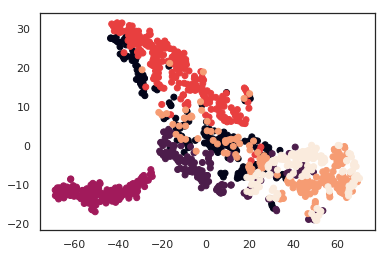

In [475]:
cur_embed2 = TSNE(n_components=2,metric='euclidean',verbose=True).fit_transform(mean_profile_list)
plt.scatter(cur_embed2[:,0],cur_embed2[:,1],c=true_y)



In [192]:
data_dump = pickle.load(open('cellline_randmul_data_randmul2_1026.pkl','rb'))

In [193]:
data_dump

{1: {'mean': array([[ 0.03846154,  3.38461538,  4.19230769, ...,  0.11538462,
           0.26923077,  0.11538462],
         [ 0.        ,  3.        ,  3.7       , ...,  0.1       ,
           0.6       ,  0.1       ],
         [ 0.05555556,  2.77777778,  3.27777778, ...,  0.11111111,
           0.5       ,  0.05555556],
         ..., 
         [ 0.        ,  0.95736965,  2.66282669, ...,  0.16979795,
           0.41419826,  0.1158388 ],
         [ 0.        ,  2.63189076,  3.40675481, ...,  0.26370297,
           0.28193718,  0.09730111],
         [ 0.        ,  1.27158212,  1.91894755, ...,  0.        ,
           0.39638307,  0.        ]]),
  'rep': [array([[ 0.00105733,  0.00102798,  0.00110629, ...,  0.00087035,
            0.00073142,  0.00074537],
          [ 0.00077317,  0.00069642,  0.00068913, ...,  0.00068693,
            0.00072539,  0.00069856],
          [ 0.00085648,  0.00072827,  0.00075669, ...,  0.00072713,
            0.00066604,  0.00072664],
          ..., 
       

1 0


/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


1 1
1 2
1 3
1 4


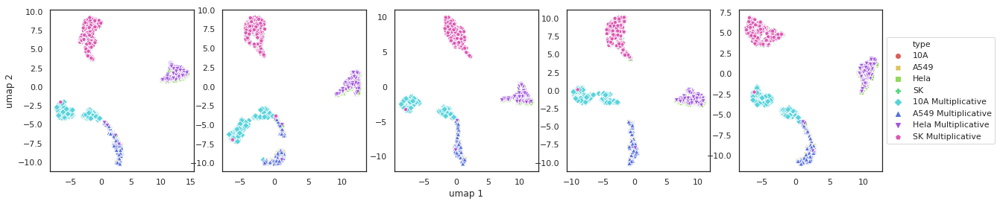

2 0
2 1
2 2
2 3
2 4


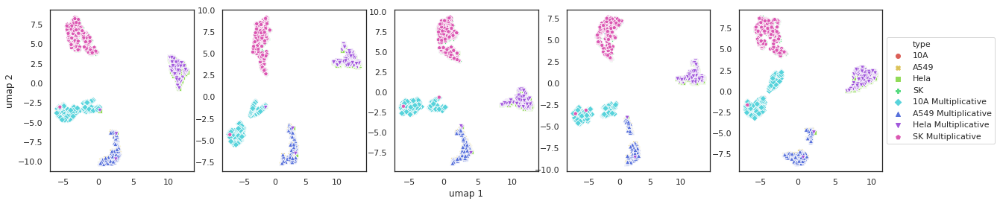

3 0
3 1
3 2
3 3
3 4


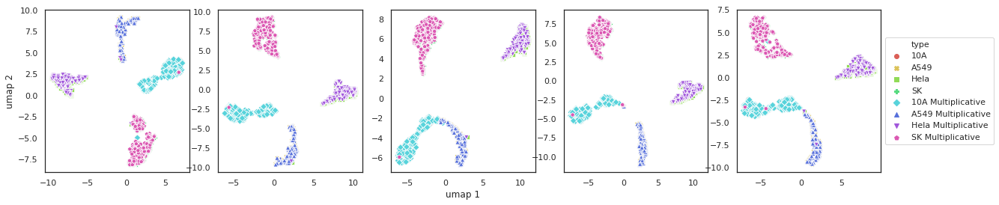

4 0
4 1
4 2
4 3
4 4


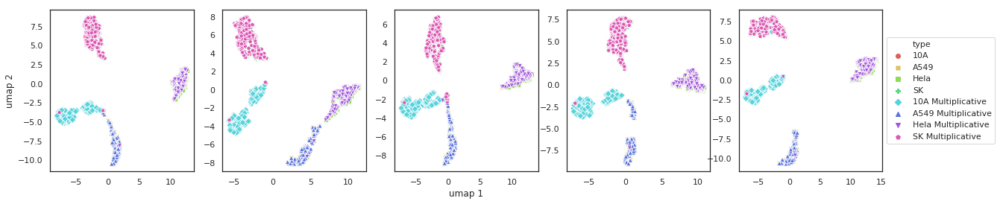

5 0
5 1
5 2
5 3
5 4


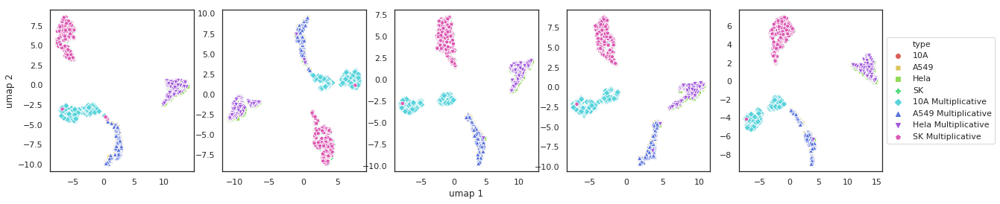

6 0
6 1
6 2
6 3
6 4


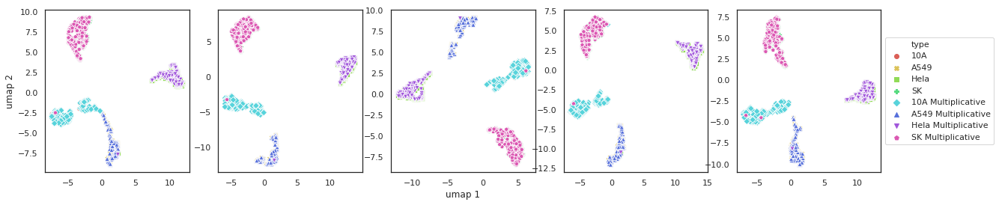

7 0
7 1
7 2
7 3
7 4


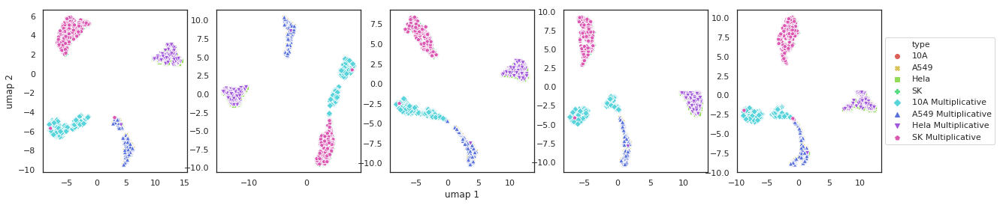

8 0
8 1
8 2
8 3
8 4


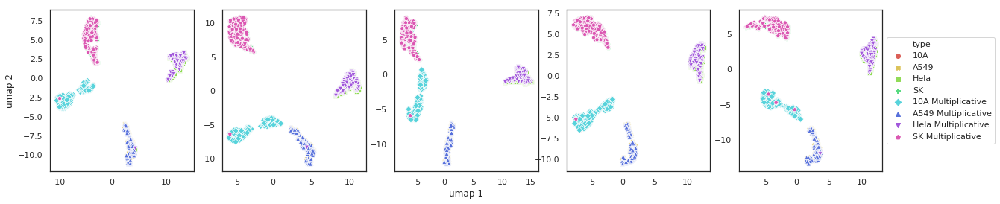

9 0
9 1
9 2
9 3
9 4


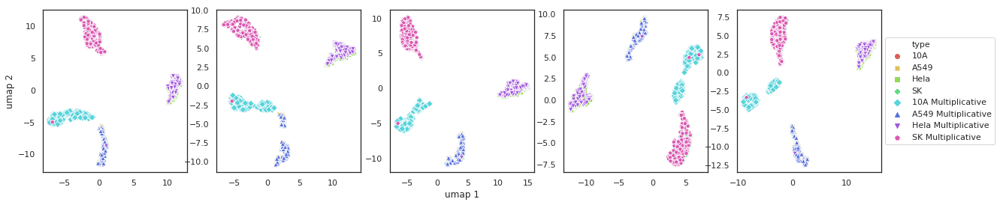

10 0
10 1
10 2
10 3
10 4


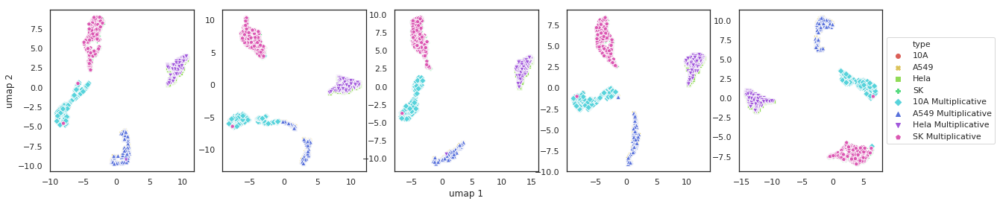

In [194]:
cat_map = {
    1:'10A',
    2:'A549',
    3:'Hela',
    4:'SK',
    5:'10A Multiplicative',
    6:'A549 Multiplicative',
    7:'Hela Multiplicative',
    8:'SK Multiplicative'
#     5:'10A Add zeros',
#     6:'A549 Add zeros',
#     7:'Hela Add zeros',
#     8:'SK Add zeros'
}
%matplotlib inline
sns.set()
sns.set_style("white")
sns.set_palette("hls")
# noisy_pixel_perc_list = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
# noisy_pixel_perc_list = [0.9,1.0]
noisy_pixel_perc_list = [1,2,3,4,5,6,7,8,9,10]



for noisy_perc in noisy_pixel_perc_list:
    cur_true_y = data_dump[noisy_perc]['true_y']
    plt.figure(figsize=(20,4))

    


    for i in range(5):
        if i==4:
            legend_flag = 'full'
        else:
            legend_flag = False
        print(noisy_perc,i)
        cur_rep = data_dump[noisy_perc]['rep'][i]
        cur_embed = umap.UMAP(n_components=2,metric='correlation',verbose=False).fit_transform(cur_rep)
        pd_dict = {
            'umap 1':cur_embed[:,0],
            'umap 2':cur_embed[:,1],
            
            'type':list(map(lambda a:cat_map[a],cur_true_y.astype('int')))



        }

        pd_data = pd.DataFrame(pd_dict)

        plt.subplot(1,5,i+1)
        sns.scatterplot(sizes=1000,x='umap 1',y='umap 2',hue='type',data=pd_data,style='type',palette=sns.hls_palette(8),legend=legend_flag)

        plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fancybox=True)
        if i!=2:
            plt.xlabel('')
        if i!=0:
            plt.ylabel('')
    
    plt.savefig("Cellline_randmul{noisy_perc}_umap_1029.svg".format(noisy_perc=noisy_perc))
    plt.show()
    




In [188]:
1+1

2

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


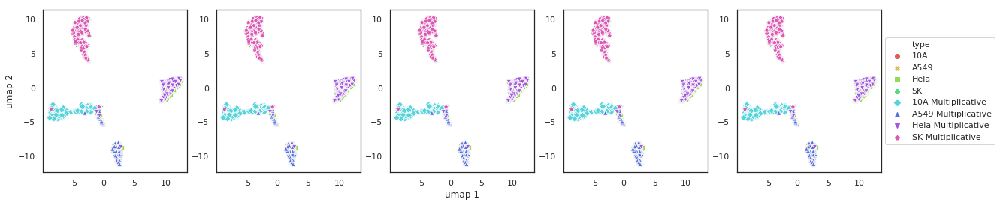

In [102]:
plt.figure(figsize=(20,4))


for i in range(5):
    if i==4:
        legend_flag = 'full'
    else:
        legend_flag = False

    plt.subplot(1,5,i+1)
    sns.scatterplot(sizes=1000,x='umap 1',y='umap 2',hue='type',data=pd_data,style='type',palette=sns.hls_palette(8),legend=legend_flag)
#     plt.legend(bbox_to_anchor=(1.05, 1), loc=2, borderaxespad=0.,fanc)
    plt.legend(loc='center left', bbox_to_anchor=(1, 0.5),fancybox=True)
    if i!=2:
        plt.xlabel('')
    if i!=0:
        plt.ylabel('')
#     plt.xlabel('')
#     plt.savefig("AB-H_randmul{noisy_perc}_umap.svg".format(noisy_perc=noisy_perc))
plt.savefig("AB-H_randmul{noisy_perc}_umap.svg".format(noisy_perc=noisy_perc))


plt.show()



In [83]:
a=sns.hls_palette(4)
b=sns.hls_palette(4, l=.3, s=.8)
a.extend(b)
sns.set_palette(a)

In [ ]:
%matplotlib inline
sns.set()
sns.set_style("white")
sns.set_palette("hls")
noisy_pixel_perc_list = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
# noisy_pixel_perc_list = [0.1]



for noisy_perc in noisy_pixel_perc_list:
    cur_true_y = data_dump[noisy_perc]['true_y']
    plt.figure(figsize=(50,10))


    for i in range(5):
        print(noisy_perc,i)
        cur_rep = data_dump[noisy_perc]['rep'][i]
        cur_embed = umap.UMAP(n_components=2,metric='correlation',verbose=False).fit_transform(cur_rep)
        pd_dict = {
            'softmax_embed_0':cur_embed[:,0],
            'softmax_embed_1':cur_embed[:,1],
            
            'type':list(map(lambda a:'celltype '+str(a),cur_true_y.astype('int')))



        }

        pd_data = pd.DataFrame(pd_dict)

        
        plt.subplot(1,5,i+1)
        sns.scatterplot(sizes=1000,x='softmax_embed_0',y='softmax_embed_1',hue='type',data=pd_data,style='type',palette='hls',legend='full')
    plt.show()



In [558]:
true_yy = true_y.copy()
true_yy[true_yy>4] = true_yy[true_yy>4]-4
from sklearn.model_selection import *
from sklearn.model_selection import cross_val_score
from sklearn.svm import *
from sklearn.neighbors import *
kf = StratifiedKFold(n_splits=5,shuffle=False)
# for train,test in kf.split(mean_profile_list,true_y):
    
#     print(train.shape)
#     print(test.shape)
    
clf = SVC(verbose=True)
clf2 = SVC(verbose=True)
knn1 = KNeighborsClassifier(metric='euclidean')
knn2 = KNeighborsClassifier(metric='correlation')
mean_profile_list_pca = PCA(n_components=10)
mean_profile_list_pca.fit(mean_profile_list)
mean_profile_list_10 = mean_profile_list_pca.transform(mean_profile_list)
mean_profile_list_tsne = TSNE(n_components=2,metric='euclidean').fit_transform(mean_profile_list)
rep_tsne = TSNE(n_components=2,metric='correlation').fit_transform(rep)
rep_pca = PCA(n_components=10)
rep_pca.fit(rep)
rep_10 = rep_pca.transform(rep)
a=cross_val_score(knn1, mean_profile_list, true_yy, scoring='accuracy',cv=kf,verbose=1)
b=cross_val_score(knn2, rep, true_yy, scoring='accuracy',cv=kf,verbose=1)
c = cross_val_score(knn1, mean_profile_list_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
d = cross_val_score(knn2, rep_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
e = cross_val_score(knn1, mean_profile_list_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)
f = cross_val_score(knn1, rep_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)




[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.9min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


In [160]:
metrics.adjusted_rand_score(cur_mean_label, true_yy)



0.064658986373417576

In [161]:
np.unique(true_yy)

array([ 1.,  2.,  3.,  4.])

In [159]:
cur_mean_label = KMeans(n_clusters=4,init='k-means++').fit_predict(mean_profile_list)



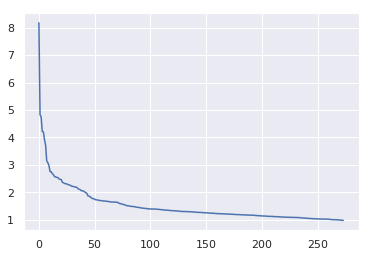

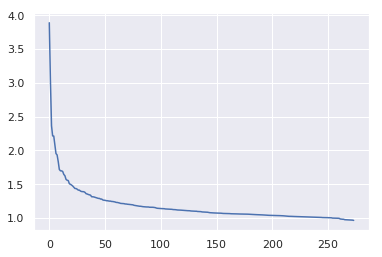

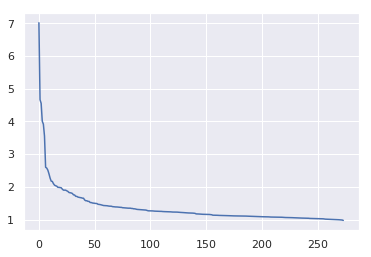

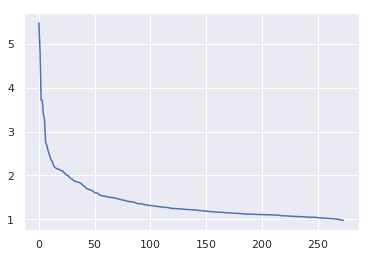

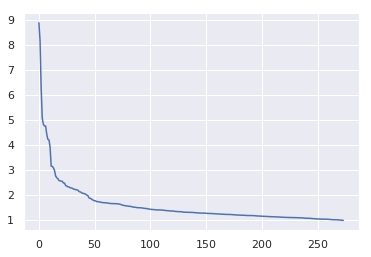

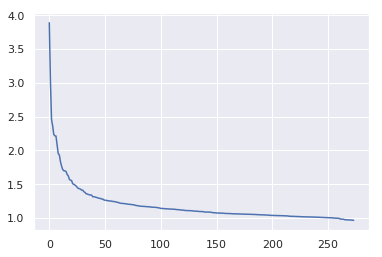

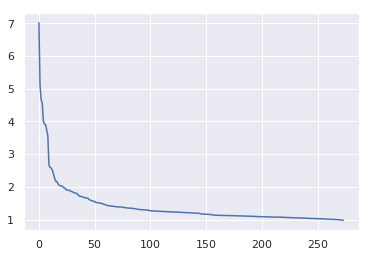

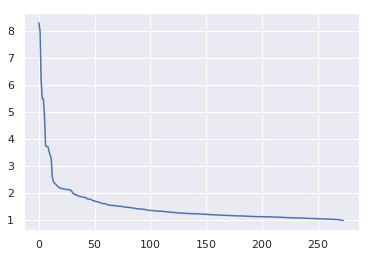

Epoch 1/200
43634/43634 [==============================] - 4s 94us/step - loss: 7.2050 - softmax_loss: 7.2050 - center_loss: 133.2341
Epoch 2/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.8497 - softmax_loss: 6.8497 - center_loss: 548.0535
Epoch 3/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.5515 - softmax_loss: 6.5515 - center_loss: 1345.2038
Epoch 4/200
43634/43634 [==============================] - 2s 41us/step - loss: 6.2900 - softmax_loss: 6.2900 - center_loss: 2303.2859
Epoch 5/200
43634/43634 [==============================] - 2s 40us/step - loss: 5.9722 - softmax_loss: 5.9722 - center_loss: 3470.2963
Epoch 6/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.7087 - softmax_loss: 5.7087 - center_loss: 4572.6868
Epoch 7/200
43634/43634 [==============================] - 2s 37us/step - loss: 5.5038 - softmax_loss: 5.5038 - center_loss: 5248.9700
Epoch 8/200
43634/43634 [==============================] 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.1 0 done
Epoch 1/200
43634/43634 [==============================] - 2s 40us/step - loss: 7.1840 - softmax_loss: 7.1840 - center_loss: 165.0096
Epoch 2/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.8123 - softmax_loss: 6.8123 - center_loss: 663.3613
Epoch 3/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.5566 - softmax_loss: 6.5566 - center_loss: 1491.3374
Epoch 4/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.3365 - softmax_loss: 6.3365 - center_loss: 2377.5891
Epoch 5/200
43634/43634 [==============================] - 2s 40us/step - loss: 6.0275 - softmax_loss: 6.0275 - center_loss: 3498.6973
Epoch 6/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.7397 - softmax_loss: 5.7397 - center_loss: 4603.1018
Epoch 7/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.5224 - softmax_loss: 5.5224 - center_loss: 5347.1361: 1s - loss: 5.6109 - softmax_loss: 
Epoch 8/20

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.1 1 done
Epoch 1/200
43634/43634 [==============================] - 2s 36us/step - loss: 7.1901 - softmax_loss: 7.1901 - center_loss: 135.3737
Epoch 2/200
43634/43634 [==============================] - 2s 35us/step - loss: 6.8264 - softmax_loss: 6.8264 - center_loss: 596.7691
Epoch 3/200
43634/43634 [==============================] - 2s 36us/step - loss: 6.5352 - softmax_loss: 6.5352 - center_loss: 1391.8252
Epoch 4/200
43634/43634 [==============================] - 2s 35us/step - loss: 6.2648 - softmax_loss: 6.2648 - center_loss: 2348.5620
Epoch 5/200
43634/43634 [==============================] - 2s 36us/step - loss: 5.9560 - softmax_loss: 5.9560 - center_loss: 3583.5999
Epoch 6/200
43634/43634 [==============================] - 2s 36us/step - loss: 5.6915 - softmax_loss: 5.6915 - center_loss: 4795.9583
Epoch 7/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.5074 - softmax_loss: 5.5074 - center_loss: 5482.5535
Epoch 8/200
43634/43634 [=====================

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.1 2 done
Epoch 1/200
43634/43634 [==============================] - 2s 39us/step - loss: 7.1806 - softmax_loss: 7.1806 - center_loss: 163.2644
Epoch 2/200
43634/43634 [==============================] - 2s 40us/step - loss: 6.8058 - softmax_loss: 6.8058 - center_loss: 632.6587
Epoch 3/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.5327 - softmax_loss: 6.5327 - center_loss: 1451.6850
Epoch 4/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.2896 - softmax_loss: 6.2896 - center_loss: 2388.8954
Epoch 5/200
43634/43634 [==============================] - 2s 39us/step - loss: 5.9791 - softmax_loss: 5.9791 - center_loss: 3506.1782
Epoch 6/200
43634/43634 [==============================] - 2s 39us/step - loss: 5.6850 - softmax_loss: 5.6850 - center_loss: 4596.0741
Epoch 7/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.4701 - softmax_loss: 5.4701 - center_loss: 5276.4317
Epoch 8/200
43634/43634 [=====================

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.1 3 done
Epoch 1/200
43634/43634 [==============================] - 2s 39us/step - loss: 7.2066 - softmax_loss: 7.2066 - center_loss: 123.2453
Epoch 2/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.8658 - softmax_loss: 6.8658 - center_loss: 512.7308
Epoch 3/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.5811 - softmax_loss: 6.5811 - center_loss: 1278.1772
Epoch 4/200
43634/43634 [==============================] - 2s 37us/step - loss: 6.3551 - softmax_loss: 6.3551 - center_loss: 2144.1554
Epoch 5/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.0610 - softmax_loss: 6.0610 - center_loss: 3246.0715
Epoch 6/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.7697 - softmax_loss: 5.7697 - center_loss: 4468.1282
Epoch 7/200
43634/43634 [==============================] - 2s 35us/step - loss: 5.5438 - softmax_loss: 5.5438 - center_loss: 5326.5892
Epoch 8/200
43634/43634 [=====================

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.1 4 done


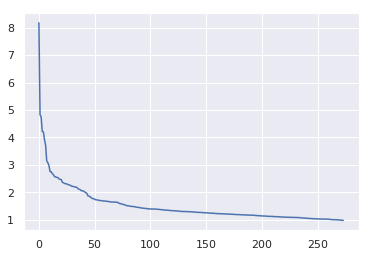

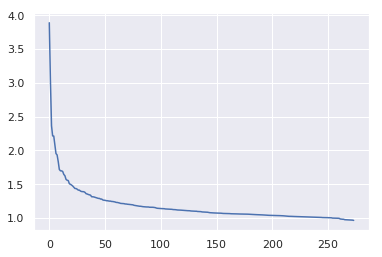

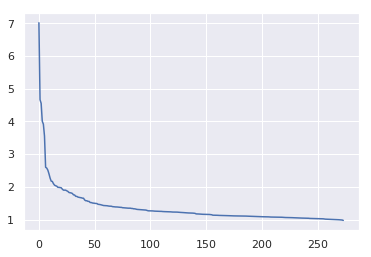

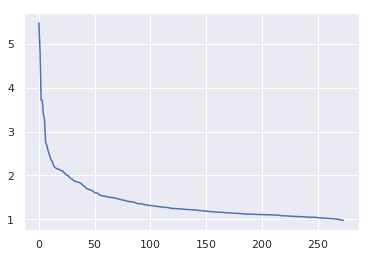

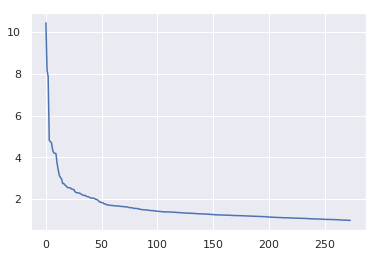

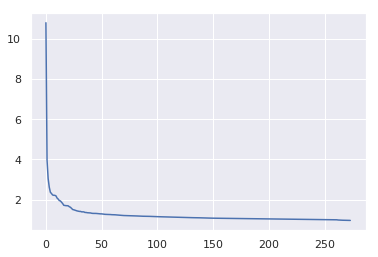

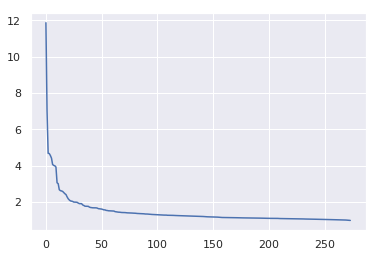

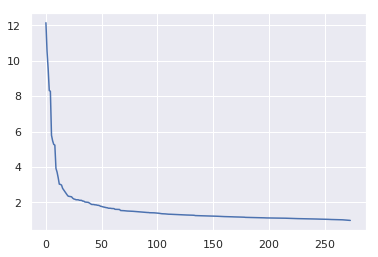

Epoch 1/200
43634/43634 [==============================] - 4s 94us/step - loss: 7.2039 - softmax_loss: 7.2039 - center_loss: 134.3432
Epoch 2/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.8855 - softmax_loss: 6.8855 - center_loss: 468.9212
Epoch 3/200
43634/43634 [==============================] - 2s 41us/step - loss: 6.5995 - softmax_loss: 6.5995 - center_loss: 1133.8412
Epoch 4/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.3692 - softmax_loss: 6.3692 - center_loss: 1911.7719
Epoch 5/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.0755 - softmax_loss: 6.0755 - center_loss: 2892.5583
Epoch 6/200
43634/43634 [==============================] - 2s 40us/step - loss: 5.7938 - softmax_loss: 5.7938 - center_loss: 3990.8528
Epoch 7/200
43634/43634 [==============================] - 2s 39us/step - loss: 5.5874 - softmax_loss: 5.5874 - center_loss: 4764.9648
Epoch 8/200
43634/43634 [==============================] 

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.2 0 done
Epoch 1/200
43634/43634 [==============================] - 2s 40us/step - loss: 7.2135 - softmax_loss: 7.2135 - center_loss: 114.1254
Epoch 2/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.9139 - softmax_loss: 6.9139 - center_loss: 428.6891
Epoch 3/200
43634/43634 [==============================] - 2s 41us/step - loss: 6.6305 - softmax_loss: 6.6305 - center_loss: 1031.5371
Epoch 4/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.4029 - softmax_loss: 6.4029 - center_loss: 1709.8241
Epoch 5/200
43634/43634 [==============================] - 2s 39us/step - loss: 6.1178 - softmax_loss: 6.1178 - center_loss: 2644.0201
Epoch 6/200
43634/43634 [==============================] - 2s 39us/step - loss: 5.8506 - softmax_loss: 5.8506 - center_loss: 3748.4082
Epoch 7/200
43634/43634 [==============================] - 2s 40us/step - loss: 5.6300 - softmax_loss: 5.6300 - center_loss: 4594.4427
Epoch 8/200
43634/43634 [=====================

[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.4s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.5min finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    0.0s finished


0.2 1 done
Epoch 1/200
43634/43634 [==============================] - 2s 39us/step - loss: 7.2108 - softmax_loss: 7.2108 - center_loss: 129.8099
Epoch 2/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.9083 - softmax_loss: 6.9083 - center_loss: 438.5039
Epoch 3/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.6288 - softmax_loss: 6.6288 - center_loss: 1063.6768
Epoch 4/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.4092 - softmax_loss: 6.4092 - center_loss: 1786.4770
Epoch 5/200
43634/43634 [==============================] - 2s 38us/step - loss: 6.1487 - softmax_loss: 6.1487 - center_loss: 2746.2942
Epoch 6/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.8896 - softmax_loss: 5.8896 - center_loss: 3931.3918
Epoch 7/200
43634/43634 [==============================] - 2s 38us/step - loss: 5.7003 - softmax_loss: 5.7003 - center_loss: 4742.3753
Epoch 8/200
43634/43634 [=====================

In [ ]:
noisy_pixel_perc_list = [0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9,1.0]
# noisy_pixel_perc_list = [0.9,1.0]
# noisy_pixel_perc_list = [1,2,3,4,5,6,7,8,9,10]
# noisy_pixel_perc_list = [10]

net_epochs = 200

a_list = {}
b_list = {}
c_list= {}
d_list = {}
e_list = {}
f_list = {}
g_list = {}
h_list = {}
data_dump = {}
rst_dump = {}
for noisy_perc in noisy_pixel_perc_list:
    
    a_list[noisy_perc] = []
    b_list[noisy_perc] = []
    c_list[noisy_perc] = []
    d_list[noisy_perc] = []
    e_list[noisy_perc] = []
    f_list[noisy_perc] = []
    g_list[noisy_perc] = []
    h_list[noisy_perc] = []


#     初始化数据集
    for i in range(4+1,len(batch_dict)+1):
        del batch_dict[i]
        del cell_dict[i]
        del label_dict[i]
        del pos_dict[i]
    
    
    for i in range(4):
        simu_base = i+1
        cur_batch_num = len(batch_dict)
#         simu_data_1,simu_cellidx = simulate_data(simu_base,2,0,noisy_perc,250)
        simu_data_1,simu_cellidx = simulate_data(simu_base,1,3,0,int(noisy_perc*274))
#         simu_data_1,simu_cellidx = simulate_data(simu_base,4,noisy_perc,0,250)



        batch_dict[cur_batch_num+1] = simu_data_1
        # batch_dict[cur_batch_num+1] = 111
        cell_dict[cur_batch_num+1] = simu_cellidx
        label_dict[cur_batch_num+1] =  (cur_batch_num+1)*np.ones(shape=(simu_data_1.shape[0],))
        pos_dict[cur_batch_num+1] = np.hstack([pos_dict[simu_base],1+np.arange(simu_data_1.shape[0]-pos_dict[simu_base].shape[0])])
    
    
    # 有label情况的处理

    # 1.147 0.025
    batch_num_list = [1,2,3,4,5,6,7,8]
    # 5行
    # 1,2,3,4,5,6
    # batch_num = 4
    top_n_var = 250
    train_x_all = None
    cell_idx_all = None
    cell_type_all = None
    cell_pos_all = None
    batch_idx_all = None
    num_cells_all = 0


    for batch_num in batch_num_list:
        train_x = batch_dict[batch_num]
        # train_x = eval('batch_dict_{norm_type}[batch_num]'.format(norm_type=norm_type))
        # train_x = batch_dict[batch_num]
        cell_idx = cell_dict[batch_num]
        cell_type = label_dict[batch_num]
        cell_pos = pos_dict[batch_num]
        # batch_FE = FE_dict[batch_num]
        cell_related_ind = (cell_idx!=0)

        num_cells = int(np.max(cell_idx))
        # num_cells = 2
        train_x = train_x[cell_related_ind,:]

        cell_idx = cell_idx[cell_related_ind]
        cell_type = cell_type[cell_related_ind]
        # cell_type = np.ones(shape=cell_idx.shape)
        cell_pos = cell_pos[cell_related_ind]





        var_li = []
        normed_var_li = []
        for i in range(train_x.shape[1]):
            cur_col = train_x[:,i]
        #     cur_col= cur_row/np.sum(cur_col)
        #     cur_entropy = entropy(cur_col)
            cur_var = np.var(cur_col)
            cur_normed_var = cur_var/np.mean(cur_col)
        #     entropy_li.append(cur_entropy)
            var_li.append(cur_var)
            normed_var_li.append(cur_normed_var)
        # entropy_li = np.array(entropy_li)
        var_li = np.array(var_li)
        normed_var_li = np.array(normed_var_li)
        sort_ind = np.flip(np.argsort(normed_var_li),axis=0)
        sort_val = np.flip(np.sort(normed_var_li),axis=0)
        plt.plot(sort_val)
        plt.show()


    #     train_x = train_x/np.percentile(train_x,80,axis=1,keepdims=True)
    #     train_x = np.log(train_x+1)


        if train_x_all is None:
            train_x_all = train_x
        else:
            train_x_all = np.vstack([train_x_all,train_x])
        if cell_idx_all is None:
            cell_idx_all = cell_idx
        else:
            cell_idx_all = np.hstack([cell_idx_all,cell_idx+np.max(cell_idx_all)])
        if cell_type_all is None:
            cell_type_all = cell_type
        else:
            cell_type_all = np.hstack([cell_type_all,cell_type])
        if cell_pos_all is None:
            cell_pos_all = cell_pos
        else:
            cell_pos_all = np.hstack([cell_pos_all,cell_pos])
        if batch_idx_all is None:
            batch_idx_all = batch_num*np.ones(shape=(cell_idx.shape))
        else:
            batch_idx_all = np.hstack([batch_idx_all,batch_num*np.ones(shape=(cell_idx.shape))])


    train_x = train_x_all
    cell_idx = cell_idx_all
    cell_type = cell_type_all
    cell_pos = cell_pos_all
    batch_idx = batch_idx_all
    num_cells = np.max(cell_idx)
    # train_x = StandardScaler().fit_transform(train_x)

    
    SIMS_input = Input(shape=(train_x.shape[1],))
    target_input = Input(shape=(1,))
    activa='relu'
    use_bias = False
    d1 = Dense(512,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(SIMS_input)
    # d1 = Dense(1024,activation=activa,kernel_initializer='random_uniform')(d1)


    d2 = Dense(256,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d1)
    # d2 = Dense(512,activation=activa,kernel_initializer='random_uniform')(d2)
    d2 = Dense(low_dim,activation='linear',kernel_initializer='random_uniform',use_bias=use_bias)(d2)


    # d3 = Dense(64,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d2)
    # d3 = Dense(256,activation=activa,kernel_initializer='random_uniform')(d3)


    # d4 = Dense(low_dim,activation=activa,kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty))(d3)
    d4 = Dense(num_cells,activation='linear',kernel_initializer=glorot_normal(),kernel_regularizer=l2(l2_penalty),use_bias=use_bias)(d2)
    ####################MLP################################################################################
    centerloss_embed_layer = Embedding(num_cells, low_dim)(target_input)
    centerloss_out = Lambda(lambda x: K.sum(K.square(x[0]-x[1][:,0]), 1, keepdims=True), name='center')([d2,centerloss_embed_layer])



    softmax_out = Activation('softmax',name='softmax')(d4)

    softmax_model = Model([SIMS_input,target_input],[softmax_out,centerloss_out])
    softmax_model.compile(optimizer=sgd(),loss=['categorical_crossentropy',lambda y_true,y_pred:y_pred],loss_weights=[1,0])
    onehot_label = keras.utils.to_categorical(cell_idx-1,num_cells)
    rep_list = []
    for k in range(5):
        reset_weights(softmax_model)
        history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=net_epochs,shuffle=True,batch_size=128)
        t=100
        logit_model = Model(SIMS_input,d4)
        pred_logit = logit_model.predict(train_x)
        pred_t_softmax = np.exp(pred_logit/t)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        # softmax_representation_list.append(np.transpose(pred_t_softmax))
        rep = np.transpose(pred_t_softmax)
        rep_list.append(rep)
        mean_profile_list = []
        for i in range(num_cells):
            mean_profile_list.append(np.mean(train_x[cell_idx==i+1,:],axis=0))
        mean_profile_list = np.array(mean_profile_list)


        _,unique_idx = np.unique(cell_idx,return_index=True)
        true_y = cell_type[unique_idx]
        np.unique(true_y)




        true_yy = true_y.copy()
        true_yy[true_yy>4] = true_yy[true_yy>4]
        from sklearn.model_selection import *
        from sklearn.model_selection import cross_val_score
        from sklearn.svm import *
        from sklearn.neighbors import *
        kf = StratifiedKFold(n_splits=5,shuffle=True)
        # for train,test in kf.split(mean_profile_list,true_y):

        #     print(train.shape)
        #     print(test.shape)

        clf = SVC(verbose=True)
        clf2 = SVC(verbose=True)
        knn1 = KNeighborsClassifier(metric='euclidean')
        knn2 = KNeighborsClassifier(metric='correlation')
        mean_profile_list_pca = PCA(n_components=10)
        mean_profile_list_pca.fit(mean_profile_list)
        mean_profile_list_10 = mean_profile_list_pca.transform(mean_profile_list)
        mean_profile_list_tsne = umap.UMAP(n_components=2,metric='euclidean').fit_transform(mean_profile_list)
        rep_tsne = umap.UMAP(n_components=2,metric='correlation').fit_transform(rep)
        rep_pca = PCA(n_components=10)
        rep_pca.fit(rep)
        rep_10 = rep_pca.transform(rep)
        a=cross_val_score(knn1, mean_profile_list, true_yy, scoring='accuracy',cv=kf,verbose=1)
        b=cross_val_score(knn2, rep, true_yy, scoring='accuracy',cv=kf,verbose=1)
        c = cross_val_score(knn1, mean_profile_list_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
        d = cross_val_score(knn2, rep_10, true_yy, scoring='accuracy',cv=kf,verbose=1)
        e = cross_val_score(knn1, mean_profile_list_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)
        f = cross_val_score(knn1, rep_tsne, true_yy, scoring='accuracy',cv=kf,verbose=1)
        
        cur_corr_mat = squareform(pdist(rep),'correlation')
        cur_corr_mat = 1/(1+cur_corr_mat)


        cur_rep_label = SpectralClustering(n_clusters=8,affinity='precomputed').fit_predict(cur_corr_mat)
#         cur_mean_label = SpectralClustering(n_clusters=4,affinity='rbf').fit_predict(mean_profile_list)
        cur_mean_label = KMeans(n_clusters=8,init='k-means++').fit_predict(mean_profile_list)
        g = metrics.adjusted_rand_score(cur_rep_label, true_yy)
        h = metrics.adjusted_rand_score(cur_mean_label, true_yy)
        
        
        a_list[noisy_perc].append(a)
        b_list[noisy_perc].append(b)

        c_list[noisy_perc].append(c)

        d_list[noisy_perc].append(d)

        e_list[noisy_perc].append(e)

        
        f_list[noisy_perc].append(f)
        g_list[noisy_perc].append(g)
        h_list[noisy_perc].append(h)



        print(noisy_perc,k,'done')


    data_dump[noisy_perc] = {
        'rep':rep_list,
        'mean':mean_profile_list,
        'true_y':true_y
    }

        
rst_dump['a'] = a_list
rst_dump['b'] = b_list
rst_dump['c'] = c_list
rst_dump['d'] = d_list
rst_dump['e'] = e_list
rst_dump['f'] = f_list
rst_dump['g'] = g_list
rst_dump['h'] = h_list


pickle.dump(data_dump,open('cellline_dist_data_1028.pkl','wb'))
pickle.dump(rst_dump,open('cellline_dist_rst_1028.pkl','wb'))


# 跑完之后看一下最后一个数据（perc=1）是否是远来的的两倍











In [185]:
rst_dump['h']

{0.1: [0.1271172498205965,
  0.12629528456205386,
  0.12829414188288749,
  0.12779123367870163,
  0.12629528456205386],
 0.2: [0.12764970992664759,
  0.12793617993008657,
  0.12660186366939546,
  0.12815502990926161,
  0.12793617993008657],
 0.3: [0.12616878652943989,
  0.13180904213783728,
  0.12674105045448386,
  0.12701361134333164,
  0.126013535337821],
 0.4: [0.12804629024749503,
  0.12804629024749503,
  0.12886851565810822,
  0.12776322155310493,
  0.1281872077428006],
 0.5: [0.12664555895979995,
  0.12692262754420716,
  0.12694977277186895,
  0.12692262754420716,
  0.12606512469612133],
 0.6: [0.13176453986247944,
  0.12744853482629201,
  0.13038992239375538,
  0.12759211615819466,
  0.12744853482629201],
 0.7: [0.13077709049319519,
  0.12979780683628611,
  0.1317056920609915,
  0.12876063497993537,
  0.13380556445274333],
 0.8: [0.12784034561666194,
  0.13296312523394724,
  0.1281007595076229,
  0.13561628791747254,
  0.13418186689782749],
 0.9: [0.13432335677102028,
  0.134592

In [174]:
# cell line的随机加0像素点


# rst_dump = pickle.load(open('cellline_randadd_rst.pkl','rb'))


alg_map = {
    'a':'mean',
    'b':'softmax',
    'c':'mean+pca',
    'd':'softmax+pca',
    'e':'mean+tsne',
    'f':'softmax+tsne'
}
pd_dict = {
    'alg':[],
    'noise ratio':[],
    'score':[],
    'DR method':[],
    'representation':[]
}
for alg,val in rst_dump.items():
    for noise_ratio,score_mat in val.items():
        score_mat = np.array(score_mat)
        score_mat = score_mat.flatten()
        for score in score_mat:
            pd_dict['alg'].append(alg_map[alg])
            pd_dict['noise ratio'].append(noise_ratio)
            pd_dict['score'].append(score)
            if alg=='a' or alg=='b':
                pd_dict['DR method'].append('no DR')
            elif alg=='c' or alg=='d':
                pd_dict['DR method'].append('PCA')
            elif alg=='e' or alg=='f':
                pd_dict['DR method'].append('T-SNE')
            
            if alg in ['a','c','e']:
                pd_dict['representation'].append('mean')
            elif alg in ['b','d','f']:
                pd_dict['representation'].append('softmax')

pd_data = pd.DataFrame(pd_dict)
g = sns.catplot(x="noise ratio", y="score", hue="representation",col='DR method',
                capsize=.2, palette="Paired", height=6, aspect=.75,
                kind="point", data=pd_data)
g.despine(left=True)
plt.savefig('Cellline_randmul_rst.svg',transparent=True,format='svg')



            
    

KeyError: 'g'

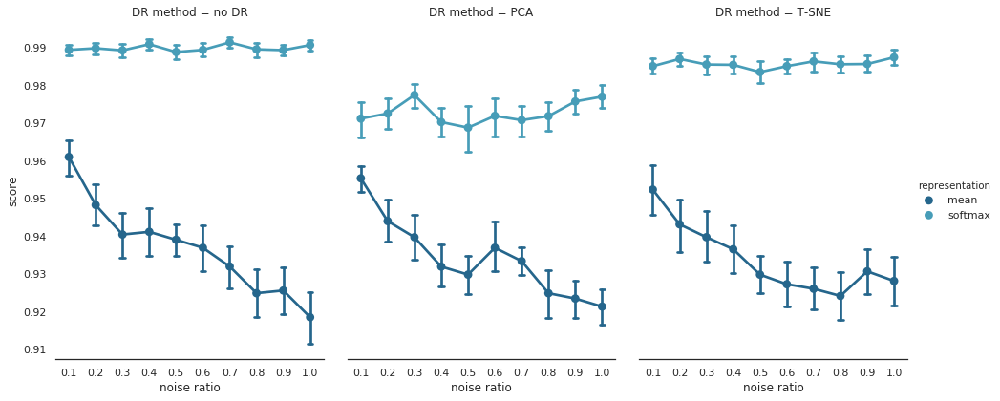

In [609]:
# cell line的随机加0像素点


# rst_dump = pickle.load(open('cellline_randadd_rst.pkl','rb'))


alg_map = {
    'a':'mean',
    'b':'softmax',
    'c':'mean+pca',
    'd':'softmax+pca',
    'e':'mean+tsne',
    'f':'softmax+tsne'
}
pd_dict = {
    'alg':[],
    'noise ratio':[],
    'score':[],
    'DR method':[],
    'representation':[]
}
for alg,val in rst_dump.items():
    for noise_ratio,score_mat in val.items():
        score_mat = np.array(score_mat)
        score_mat = score_mat.flatten()
        for score in score_mat:
            pd_dict['alg'].append(alg_map[alg])
            pd_dict['noise ratio'].append(noise_ratio)
            pd_dict['score'].append(score)
            if alg=='a' or alg=='b':
                pd_dict['DR method'].append('no DR')
            elif alg=='c' or alg=='d':
                pd_dict['DR method'].append('PCA')
            elif alg=='e' or alg=='f':
                pd_dict['DR method'].append('T-SNE')
            
            if alg in ['a','c','e']:
                pd_dict['representation'].append('mean')
            elif alg in ['b','d','f']:
                pd_dict['representation'].append('softmax')

pd_data = pd.DataFrame(pd_dict)
g = sns.catplot(x="noise ratio", y="score", hue="representation",col='DR method',
                capsize=.2, palette="YlGnBu_d", height=6, aspect=.75,
                kind="point", data=pd_data)
g.despine(left=True)

            
    

In [146]:
rst_dump = pickle.load(open('cellline_randmul_rst_randmul2_1025.pkl','rb'))



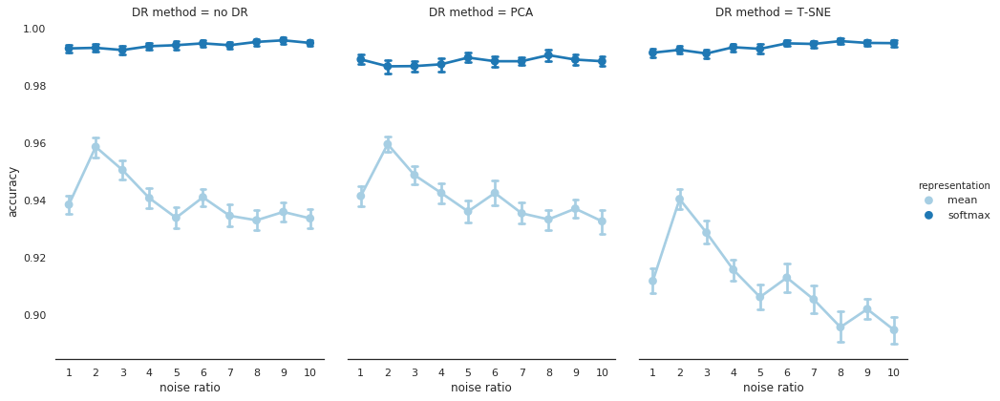

In [149]:
# cell line的随机加0像素点

sns.set(style='white')


alg_map = {
    'a':'mean',
    'b':'softmax',
    'c':'mean+pca',
    'd':'softmax+pca',
    'e':'mean+tsne',
    'f':'softmax+tsne'
}
pd_dict = {
    'alg':[],
    'noise ratio':[],
    'accuracy':[],
    'DR method':[],
    'representation':[]
}
for alg,val in rst_dump.items():
    for noise_ratio,score_mat in val.items():
        score_mat = np.array(score_mat)
        score_mat = score_mat.flatten()
        for score in score_mat:
            pd_dict['alg'].append(alg_map[alg])
            pd_dict['noise ratio'].append(noise_ratio)
            pd_dict['accuracy'].append(score)
            if alg=='a' or alg=='b':
                pd_dict['DR method'].append('no DR')
            elif alg=='c' or alg=='d':
                pd_dict['DR method'].append('PCA')
            elif alg=='e' or alg=='f':
                pd_dict['DR method'].append('T-SNE')
            
            if alg in ['a','c','e']:
                pd_dict['representation'].append('mean')
            elif alg in ['b','d','f']:
                pd_dict['representation'].append('softmax')

pd_data = pd.DataFrame(pd_dict)
g = sns.catplot(x="noise ratio", y="accuracy", hue="representation",col='DR method',
                capsize=.2, palette="Paired", height=6, aspect=.75,
                kind="point", data=pd_data)
g.despine(left=True)
plt.savefig('Cellline_randmul_rst.svg',transparent=True,format='svg')


            
    

In [140]:
np.unique(true_label)

array([ 1.,  2.,  3.,  4.])

In [138]:
rep = data_dump[8]['rep'][0]

cur_corr_mat = squareform(pdist(rep),'correlation')
cur_corr_mat = 1/(1+cur_corr_mat)


cur_label = SpectralClustering(n_clusters=4,affinity='precomputed').fit_predict(cur_corr_mat)



In [141]:
metrics.adjusted_rand_score(cur_label, true_label-1)

0.53585558962047897

In [ ]:
1+1

In [ ]:
# randadd/randmul/diffdist 都用最高的noisy做一下consensus clustering
from scipy.spatial.distance import *
softmax_representation_list = data_dump[8]['rep']
k_list = [2,3,4,5,6,7,8,9,10]
CM_list = [np.zeros(shape=(num_cells,num_cells))]*len(k_list)

times = 10
for n_time in range(times):
    rep_count = -1
    for rep in softmax_representation_list:
        cur_corr_mat = squareform(pdist(rep),'correlation')
        cur_corr_mat = 1/(1+cur_corr_mat)
        rep_count += 1
        for k in k_list:
            print(n_time,rep_count,k)
            cur_label = SpectralClustering(n_clusters=k,affinity='precomputed').fit_predict(cur_corr_mat)
            CM_list[k-2] = CM_list[k-2] + label2CM(cur_label)




0 0 2
0 0 3
0 0 4
0 0 5
0 0 6
0 0 7
0 0 8
0 0 9
0 0 10
0 1 2
0 1 3
0 1 4
0 1 5
0 1 6
0 1 7
0 1 8
0 1 9
0 1 10
0 2 2
0 2 3
0 2 4
0 2 5
0 2 6
0 2 7
0 2 8
0 2 9
0 2 10
0 3 2
0 3 3
0 3 4
0 3 5
0 3 6
0 3 7
0 3 8
0 3 9
0 3 10
0 4 2
0 4 3
0 4 4
0 4 5
0 4 6
0 4 7
0 4 8
0 4 9
0 4 10
0 5 2
0 5 3
0 5 4
0 5 5
0 5 6
0 5 7
0 5 8
0 5 9
0 5 10
0 6 2
0 6 3
0 6 4
0 6 5
0 6 6
0 6 7
0 6 8
0 6 9
0 6 10
0 7 2
0 7 3
0 7 4
0 7 5
0 7 6
0 7 7
0 7 8
0 7 9
0 7 10
0 8 2
0 8 3
0 8 4
0 8 5
0 8 6
0 8 7
0 8 8
0 8 9
0 8 10
0 9 2
0 9 3
0 9 4
0 9 5
0 9 6
0 9 7
0 9 8
0 9 9
0 9 10
1 0 2
1 0 3
1 0 4
1 0 5
1 0 6
1 0 7
1 0 8
1 0 9
1 0 10
1 1 2
1 1 3
1 1 4
1 1 5
1 1 6
1 1 7
1 1 8
1 1 9
1 1 10
1 2 2
1 2 3
1 2 4
1 2 5
1 2 6
1 2 7
1 2 8
1 2 9
1 2 10
1 3 2
1 3 3
1 3 4
1 3 5
1 3 6
1 3 7
1 3 8
1 3 9
1 3 10
1 4 2
1 4 3
1 4 4
1 4 5
1 4 6
1 4 7
1 4 8
1 4 9
1 4 10
1 5 2
1 5 3
1 5 4
1 5 5
1 5 6
1 5 7
1 5 8
1 5 9
1 5 10
1 6 2
1 6 3
1 6 4
1 6 5
1 6 6
1 6 7
1 6 8
1 6 9
1 6 10
1 7 2
1 7 3
1 7 4
1 7 5
1 7 6
1 7 7
1 7 8
1 7 9
1 7 10
1 8 2
1 8 

In [111]:
_,unique_idx = np.unique(cell_idx,return_index=True)
true_y = cell_type[unique_idx]

In [124]:
true_label = true_y.copy()
    
true_label[true_label>4] = true_label[true_label>4]-4

In [151]:
np.unique(true_label)

array([ 1.,  2.,  3.,  4.,  5.,  6.,  7.,  8.])

In [ ]:
sns.set()
# 绿的是hela红的是a549
# n_cluster_li = [2,3,4,5,6]
# # fig = plt.figure(figsize=(5,25))
# for CM in CM_list:
#     CM = CM/np.max(CM)
#     fig = plt.figure(figsize=(15,75))
    
#     for n_cluster in n_cluster_li:
#         consensus_label = SpectralClustering(n_clusters=n_cluster,affinity='precomputed').fit_predict(CM)
#         label_sort = np.argsort(consensus_label)
#         plt.subplot(1,5,n_cluster-1)
#         plt.imshow(CM[:,label_sort][label_sort,:])
# #     plt.hist(CM[:])
#     plt.show()
n_cluster_li = [2,3,4,5,6,7,8,9,10]
# n_cluster_li = [4]
fig = plt.figure(figsize=(15,75))
label_list = []
order_list = []
# fig = plt.figure(figsize=(5,25))
for i in range(len(CM_list)):
    CM = CM_list[i]
    CM = CM/np.max(CM)
#     plt.subplot(1,5,i+1)
#     consensus_label=AgglomerativeClustering(n_clusters=i+2,affinity='precomputed',linkage='average').fit_predict(1-CM)
    consensus_label = SpectralClustering(n_clusters=i+2,affinity='precomputed').fit_predict(CM)
    true_label = true_y.copy()
    
    true_label[true_label>4] = true_label[true_label>4]
    
    data_matrix = pd.DataFrame(1-CM)

#     labels = np.random.random_integers(0,5, size=50)
    lut = dict(zip(set(true_label), sns.hls_palette(len(set(true_label)), l=0.5, s=0.8)))
    row_colors = pd.DataFrame(true_label)[0].map(lut)
    
    
    
    
#     linkage = hc.linkage(sp.distance.squareform(1-CM), method='average')
    linkage_mat = hc.linkage(1-CM, method='single',optimal_ordering=True)
    order_list.append(leaves_list(linkage_mat))
#     sns.clustermap(1-CM, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),cmap='Reds')
#     sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(20,20),cmap='vlag',row_colors=row_colors,col_colors=row_colors,linewidths=.75)
#     sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),row_colors=row_colors,col_colors=row_colors)
    sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(20,20),cmap='vlag',row_colors=row_colors,col_colors=row_colors)



    label_list.append(consensus_label)
    label_sort = np.argsort(consensus_label)
    
#     plt.imshow(CM[:,label_sort][label_sort,:])
#     plt.hist(CM[:])
#     plt.savefig()
    plt.savefig('Cellline_CM_k{k}_8_new.svg'.format(k=i+2),transparent=True,format='svg')

    
#     plt.show()

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:42: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


In [156]:
metrics.adjusted_rand_score(true_label, label_list[2])

0.32777865883467566

In [ ]:
import matplotlib.cm as cm
PAC_list = []
AUCDF_list = []
delta_list = []
silhouette_list = []
prev_AUCDF = 1
a = 0.2
fig = plt.figure()
for i in range(len(CM_list)):
    CM = CM_list[i]
    CM = CM/CM[0,0]

    CM_flatten = CM.flatten()
    n_bins = 1000
#     plt.subplot(1,len(CM_list),i+1)
    n, bins, patches = plt.hist(CM_flatten, n_bins, histtype='step',cumulative=True, label=str(i+2),normed=True)
    bins = bins[0:-1]
    cur_PAC = n[bins>=1-a][0]-n[bins>=a][0]
    cur_AUCDF = np.sum(n)*(bins[1]-bins[0])
    PAC_list.append(cur_PAC)
    AUCDF_list.append(cur_AUCDF)
    if i==0:
        delta_list.append(cur_AUCDF)
    else:
        delta_list.append((cur_AUCDF-prev_AUCDF)/prev_AUCDF)
#     consensus_label = SpectralClustering(n_clusters=i+2,affinity='precomputed').fit_predict(CM)
#     consensus_label=AgglomerativeClustering(n_clusters=i+2,affinity='precomputed',linkage='complete').fit_predict(1-CM)
    consensus_label = label_list[i]
    silhouette_list.append(silhouette_score(1-CM,metric='precomputed',labels = consensus_label))
    prev_AUCDF = cur_AUCDF
    
    
    fig, ax1= plt.subplots(1, 1)
    cluster_labels = consensus_label
    silhouette_avg = silhouette_score(1-CM,metric='precomputed',labels = consensus_label)
    sample_silhouette_values = silhouette_samples(1-CM, metric='precomputed',labels = consensus_label)
    n_clusters = i+2
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for k={k}.".format(k=n_clusters))
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])
#     plt.savefig('AB-H_silhouette_k{k}.svg'.format(k=n_clusters),transparent=True,format='svg')


    
    
    
    
    
plt.legend(loc='right')
# plt.title('CDF')


plt.show()
plt.subplot(1,3,1)
plt.plot(np.arange(len(CM_list))+2,np.array(PAC_list))
plt.title('PAC')
plt.subplot(1,3,2)
plt.plot(np.arange(len(CM_list))+2,np.array(silhouette_list))
plt.title('silhouette')

plt.subplot(1,3,3)
plt.plot(np.arange(len(CM_list))+2,np.array(delta_list))
plt.title('delta')

plt.show()

In [13]:
_,unique_idx = np.unique(cell_idx,return_index=True)
true_y = cell_type[unique_idx]
np.unique(true_y)

array([1, 2, 3, 4], dtype=int32)

In [ ]:
# consensus clustering
# step 1:首先得到n个softmax空间的表示
n_softmax = 3
t_list = [10,30,50,70,90]

softmax_representation_list = []
logit_model = Model(SIMS_input,d4)

for i in range(n_softmax):
    reset_weights(softmax_model)
    
    history=softmax_model.fit([train_x,cell_idx-1],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=100,shuffle=True,batch_size=128)
    
    for t in t_list:
        print(i)
    #     history=softmax_model.fit([train_x,cur_label],[onehot_label,np.ones(shape=cell_idx.shape)],epochs=50,shuffle=True,batch_size=64,verbose=True)

        pred_logit = logit_model.predict(train_x)
        pred_t_softmax = np.exp(pred_logit/t)
        pred_t_softmax = pred_t_softmax/np.sum(pred_t_softmax,axis=1,keepdims=True)
        softmax_representation_list.append(np.transpose(pred_t_softmax))



Epoch 1/100
21817/21817 [==============================] - 1s 46us/step - loss: 6.4399 - softmax_loss: 6.4399 - center_loss: 34.5011
Epoch 2/100
21817/21817 [==============================] - 1s 45us/step - loss: 5.5596 - softmax_loss: 5.5596 - center_loss: 322.2345
Epoch 3/100
21817/21817 [==============================] - 1s 45us/step - loss: 4.6881 - softmax_loss: 4.6881 - center_loss: 786.7553
Epoch 4/100
21817/21817 [==============================] - 1s 46us/step - loss: 4.2191 - softmax_loss: 4.2191 - center_loss: 1122.4354
Epoch 5/100
21817/21817 [==============================] - 1s 47us/step - loss: 3.8201 - softmax_loss: 3.8201 - center_loss: 1414.3117
Epoch 6/100
21817/21817 [==============================] - 1s 46us/step - loss: 3.5271 - softmax_loss: 3.5271 - center_loss: 1647.5832
Epoch 7/100
21817/21817 [==============================] - 1s 45us/step - loss: 3.2943 - softmax_loss: 3.2943 - center_loss: 1831.6530
Epoch 8/100
21817/21817 [==============================] - 

performing k=2,rep=0,tsne perplexity=20,metric=euclidean
performing k=3,rep=0,tsne perplexity=20,metric=euclidean
performing k=4,rep=0,tsne perplexity=20,metric=euclidean
performing k=5,rep=0,tsne perplexity=20,metric=euclidean
performing k=6,rep=0,tsne perplexity=20,metric=euclidean
performing k=2,rep=0,tsne perplexity=20,metric=correlation
performing k=3,rep=0,tsne perplexity=20,metric=correlation
performing k=4,rep=0,tsne perplexity=20,metric=correlation
performing k=5,rep=0,tsne perplexity=20,metric=correlation
performing k=6,rep=0,tsne perplexity=20,metric=correlation
performing k=2,rep=0,tsne perplexity=30,metric=cosine
performing k=3,rep=0,tsne perplexity=30,metric=cosine
performing k=4,rep=0,tsne perplexity=30,metric=cosine
performing k=5,rep=0,tsne perplexity=30,metric=cosine
performing k=6,rep=0,tsne perplexity=30,metric=cosine
performing k=2,rep=0,tsne perplexity=30,metric=euclidean
performing k=3,rep=0,tsne perplexity=30,metric=euclidean
performing k=4,rep=0,tsne perplexity

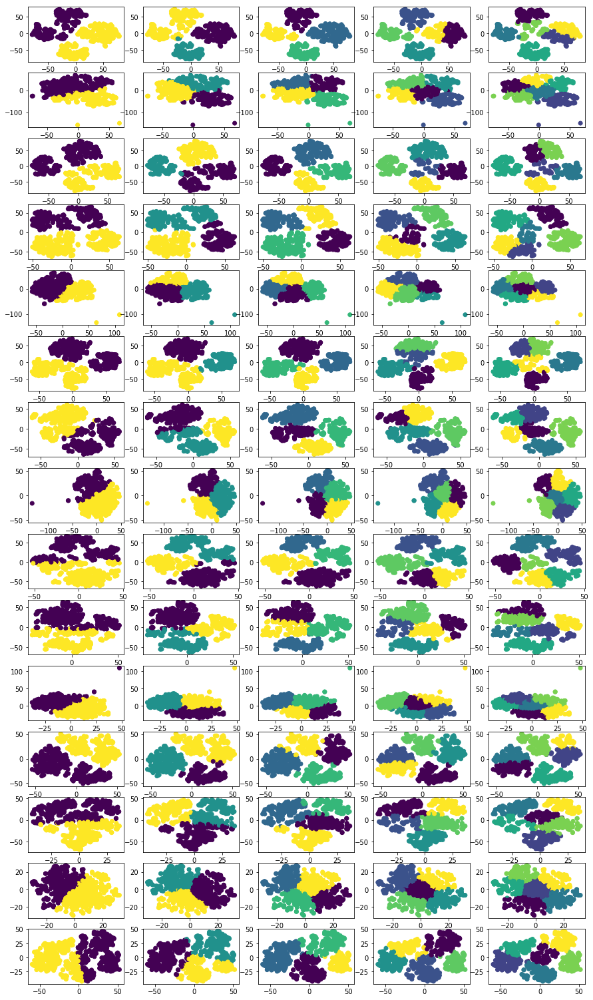

performing k=2,rep=0,umap neighbors=5,metric=cosine
performing k=3,rep=0,umap neighbors=5,metric=cosine
performing k=4,rep=0,umap neighbors=5,metric=cosine
performing k=5,rep=0,umap neighbors=5,metric=cosine
performing k=6,rep=0,umap neighbors=5,metric=cosine
performing k=2,rep=0,umap neighbors=5,metric=euclidean
performing k=3,rep=0,umap neighbors=5,metric=euclidean
performing k=4,rep=0,umap neighbors=5,metric=euclidean
performing k=5,rep=0,umap neighbors=5,metric=euclidean
performing k=6,rep=0,umap neighbors=5,metric=euclidean
performing k=2,rep=0,umap neighbors=5,metric=correlation
performing k=3,rep=0,umap neighbors=5,metric=correlation
performing k=4,rep=0,umap neighbors=5,metric=correlation
performing k=5,rep=0,umap neighbors=5,metric=correlation
performing k=6,rep=0,umap neighbors=5,metric=correlation
performing k=2,rep=0,umap neighbors=10,metric=cosine
performing k=3,rep=0,umap neighbors=10,metric=cosine
performing k=4,rep=0,umap neighbors=10,metric=cosine
performing k=5,rep=0,

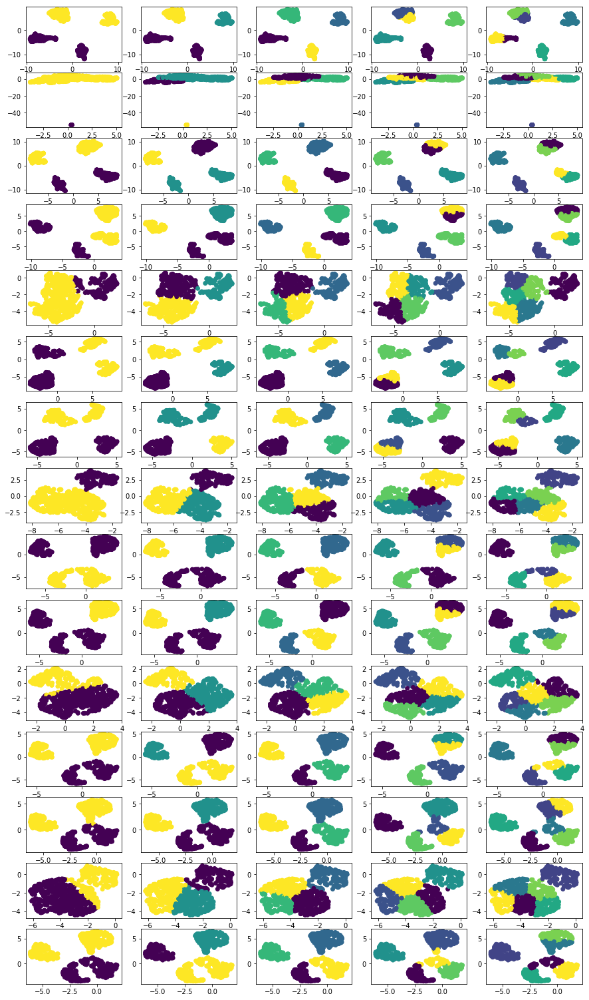

performing k=2,rep=1,tsne perplexity=10,metric=cosine
performing k=3,rep=1,tsne perplexity=10,metric=cosine
performing k=4,rep=1,tsne perplexity=10,metric=cosine
performing k=5,rep=1,tsne perplexity=10,metric=cosine
performing k=6,rep=1,tsne perplexity=10,metric=cosine
performing k=2,rep=1,tsne perplexity=10,metric=euclidean
performing k=3,rep=1,tsne perplexity=10,metric=euclidean
performing k=4,rep=1,tsne perplexity=10,metric=euclidean
performing k=5,rep=1,tsne perplexity=10,metric=euclidean
performing k=6,rep=1,tsne perplexity=10,metric=euclidean
performing k=2,rep=1,tsne perplexity=10,metric=correlation
performing k=3,rep=1,tsne perplexity=10,metric=correlation
performing k=4,rep=1,tsne perplexity=10,metric=correlation
performing k=5,rep=1,tsne perplexity=10,metric=correlation
performing k=6,rep=1,tsne perplexity=10,metric=correlation
performing k=2,rep=1,tsne perplexity=20,metric=cosine
performing k=3,rep=1,tsne perplexity=20,metric=cosine
performing k=4,rep=1,tsne perplexity=20,me

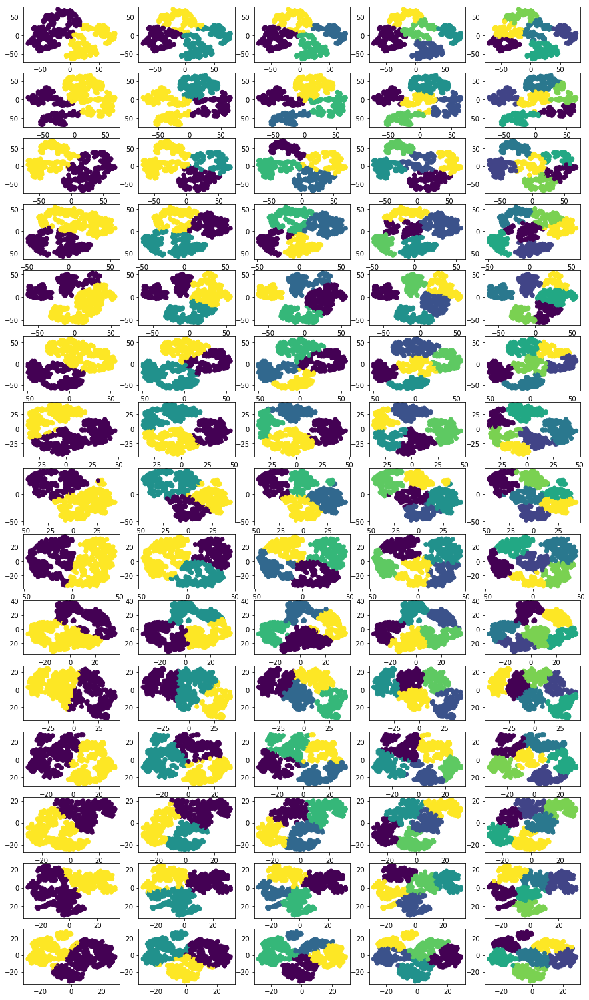

performing k=2,rep=1,umap neighbors=5,metric=cosine
performing k=3,rep=1,umap neighbors=5,metric=cosine
performing k=4,rep=1,umap neighbors=5,metric=cosine
performing k=5,rep=1,umap neighbors=5,metric=cosine
performing k=6,rep=1,umap neighbors=5,metric=cosine
performing k=2,rep=1,umap neighbors=5,metric=euclidean
performing k=3,rep=1,umap neighbors=5,metric=euclidean
performing k=4,rep=1,umap neighbors=5,metric=euclidean
performing k=5,rep=1,umap neighbors=5,metric=euclidean
performing k=6,rep=1,umap neighbors=5,metric=euclidean
performing k=2,rep=1,umap neighbors=5,metric=correlation
performing k=3,rep=1,umap neighbors=5,metric=correlation
performing k=4,rep=1,umap neighbors=5,metric=correlation
performing k=5,rep=1,umap neighbors=5,metric=correlation
performing k=6,rep=1,umap neighbors=5,metric=correlation
performing k=2,rep=1,umap neighbors=10,metric=cosine
performing k=3,rep=1,umap neighbors=10,metric=cosine
performing k=4,rep=1,umap neighbors=10,metric=cosine
performing k=5,rep=1,

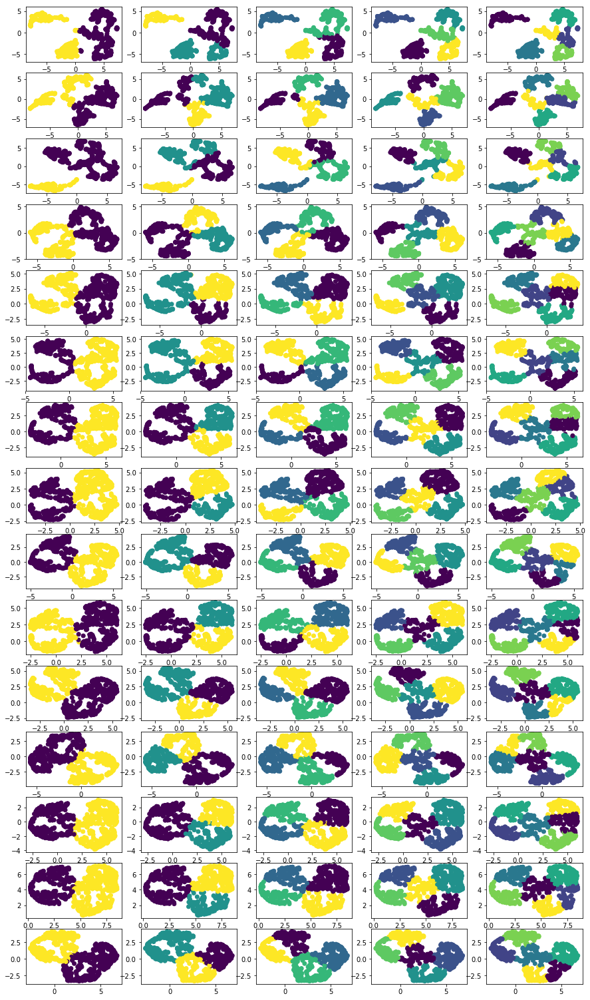

performing k=2,rep=2,tsne perplexity=10,metric=cosine
performing k=3,rep=2,tsne perplexity=10,metric=cosine
performing k=4,rep=2,tsne perplexity=10,metric=cosine
performing k=5,rep=2,tsne perplexity=10,metric=cosine
performing k=6,rep=2,tsne perplexity=10,metric=cosine
performing k=2,rep=2,tsne perplexity=10,metric=euclidean
performing k=3,rep=2,tsne perplexity=10,metric=euclidean
performing k=4,rep=2,tsne perplexity=10,metric=euclidean
performing k=5,rep=2,tsne perplexity=10,metric=euclidean
performing k=6,rep=2,tsne perplexity=10,metric=euclidean
performing k=2,rep=2,tsne perplexity=10,metric=correlation
performing k=3,rep=2,tsne perplexity=10,metric=correlation
performing k=4,rep=2,tsne perplexity=10,metric=correlation
performing k=5,rep=2,tsne perplexity=10,metric=correlation
performing k=6,rep=2,tsne perplexity=10,metric=correlation
performing k=2,rep=2,tsne perplexity=20,metric=cosine
performing k=3,rep=2,tsne perplexity=20,metric=cosine
performing k=4,rep=2,tsne perplexity=20,me

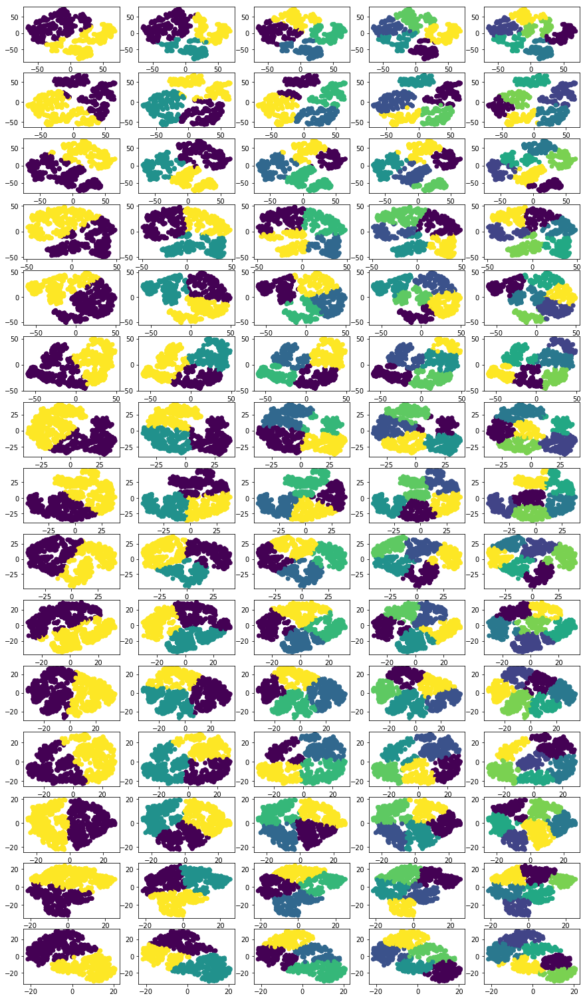

performing k=2,rep=2,umap neighbors=5,metric=cosine
performing k=3,rep=2,umap neighbors=5,metric=cosine
performing k=4,rep=2,umap neighbors=5,metric=cosine
performing k=5,rep=2,umap neighbors=5,metric=cosine
performing k=6,rep=2,umap neighbors=5,metric=cosine
performing k=2,rep=2,umap neighbors=5,metric=euclidean
performing k=3,rep=2,umap neighbors=5,metric=euclidean
performing k=4,rep=2,umap neighbors=5,metric=euclidean
performing k=5,rep=2,umap neighbors=5,metric=euclidean
performing k=6,rep=2,umap neighbors=5,metric=euclidean
performing k=2,rep=2,umap neighbors=5,metric=correlation
performing k=3,rep=2,umap neighbors=5,metric=correlation
performing k=4,rep=2,umap neighbors=5,metric=correlation
performing k=5,rep=2,umap neighbors=5,metric=correlation
performing k=6,rep=2,umap neighbors=5,metric=correlation
performing k=2,rep=2,umap neighbors=10,metric=cosine
performing k=3,rep=2,umap neighbors=10,metric=cosine
performing k=4,rep=2,umap neighbors=10,metric=cosine
performing k=5,rep=2,

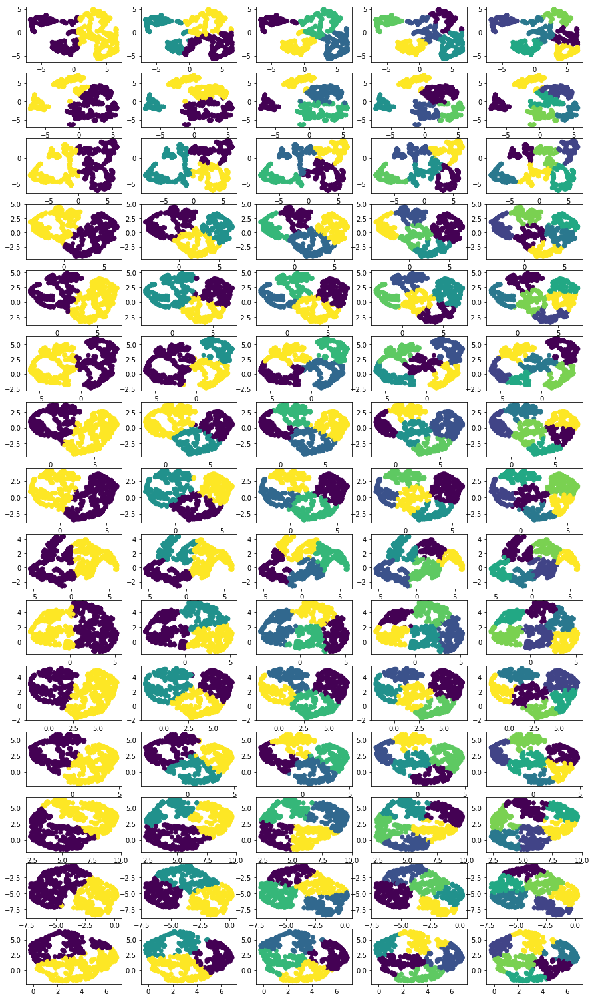

performing k=2,rep=3,tsne perplexity=10,metric=cosine
performing k=3,rep=3,tsne perplexity=10,metric=cosine
performing k=4,rep=3,tsne perplexity=10,metric=cosine
performing k=5,rep=3,tsne perplexity=10,metric=cosine
performing k=6,rep=3,tsne perplexity=10,metric=cosine
performing k=2,rep=3,tsne perplexity=10,metric=euclidean
performing k=3,rep=3,tsne perplexity=10,metric=euclidean
performing k=4,rep=3,tsne perplexity=10,metric=euclidean
performing k=5,rep=3,tsne perplexity=10,metric=euclidean
performing k=6,rep=3,tsne perplexity=10,metric=euclidean
performing k=2,rep=3,tsne perplexity=10,metric=correlation
performing k=3,rep=3,tsne perplexity=10,metric=correlation
performing k=4,rep=3,tsne perplexity=10,metric=correlation
performing k=5,rep=3,tsne perplexity=10,metric=correlation
performing k=6,rep=3,tsne perplexity=10,metric=correlation
performing k=2,rep=3,tsne perplexity=20,metric=cosine
performing k=3,rep=3,tsne perplexity=20,metric=cosine
performing k=4,rep=3,tsne perplexity=20,me

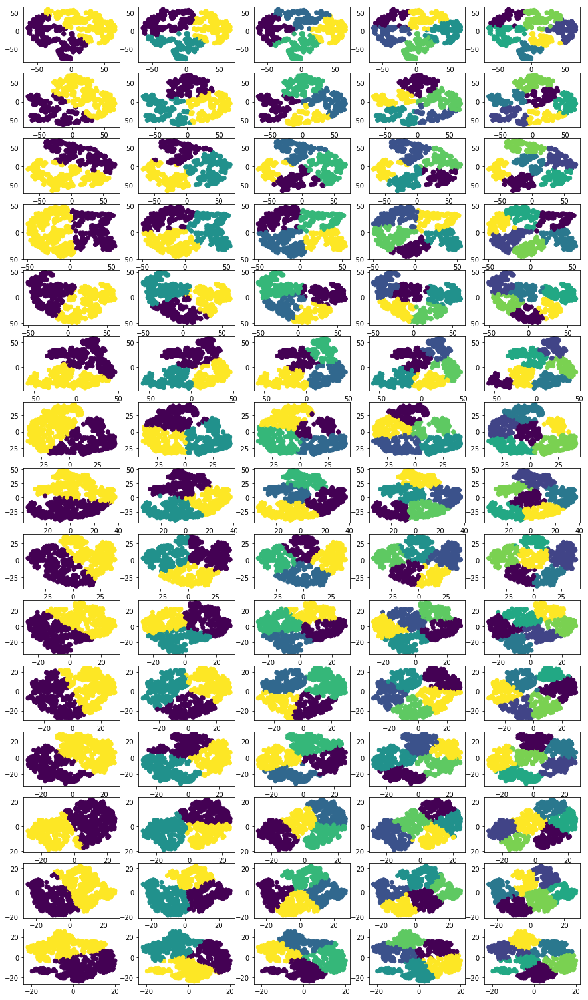

performing k=2,rep=3,umap neighbors=5,metric=cosine
performing k=3,rep=3,umap neighbors=5,metric=cosine
performing k=4,rep=3,umap neighbors=5,metric=cosine
performing k=5,rep=3,umap neighbors=5,metric=cosine
performing k=6,rep=3,umap neighbors=5,metric=cosine
performing k=2,rep=3,umap neighbors=5,metric=euclidean
performing k=3,rep=3,umap neighbors=5,metric=euclidean
performing k=4,rep=3,umap neighbors=5,metric=euclidean
performing k=5,rep=3,umap neighbors=5,metric=euclidean
performing k=6,rep=3,umap neighbors=5,metric=euclidean
performing k=2,rep=3,umap neighbors=5,metric=correlation
performing k=3,rep=3,umap neighbors=5,metric=correlation
performing k=4,rep=3,umap neighbors=5,metric=correlation
performing k=5,rep=3,umap neighbors=5,metric=correlation
performing k=6,rep=3,umap neighbors=5,metric=correlation
performing k=2,rep=3,umap neighbors=10,metric=cosine
performing k=3,rep=3,umap neighbors=10,metric=cosine
performing k=4,rep=3,umap neighbors=10,metric=cosine
performing k=5,rep=3,

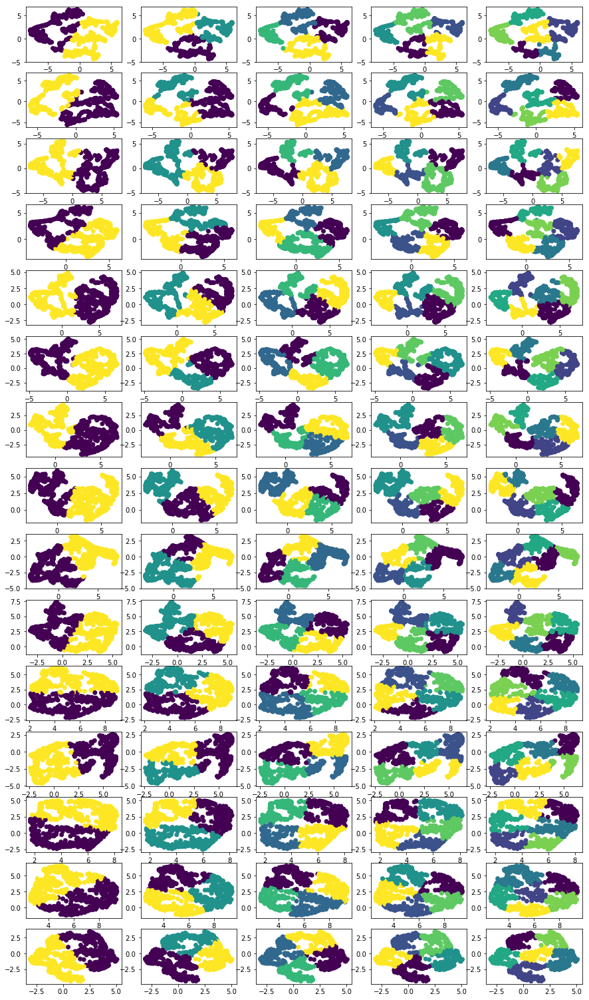

performing k=2,rep=4,tsne perplexity=10,metric=cosine
performing k=3,rep=4,tsne perplexity=10,metric=cosine
performing k=4,rep=4,tsne perplexity=10,metric=cosine
performing k=5,rep=4,tsne perplexity=10,metric=cosine
performing k=6,rep=4,tsne perplexity=10,metric=cosine
performing k=2,rep=4,tsne perplexity=10,metric=euclidean
performing k=3,rep=4,tsne perplexity=10,metric=euclidean
performing k=4,rep=4,tsne perplexity=10,metric=euclidean
performing k=5,rep=4,tsne perplexity=10,metric=euclidean
performing k=6,rep=4,tsne perplexity=10,metric=euclidean
performing k=2,rep=4,tsne perplexity=10,metric=correlation
performing k=3,rep=4,tsne perplexity=10,metric=correlation
performing k=4,rep=4,tsne perplexity=10,metric=correlation
performing k=5,rep=4,tsne perplexity=10,metric=correlation
performing k=6,rep=4,tsne perplexity=10,metric=correlation
performing k=2,rep=4,tsne perplexity=20,metric=cosine
performing k=3,rep=4,tsne perplexity=20,metric=cosine
performing k=4,rep=4,tsne perplexity=20,me

In [ ]:
# step 2:每个representation 跑tsne／umap，用cosine，encildean，corr，和3个不同的参数
import umap
embed_dim = 2
tsne_perplexity_list = [10,20,30,40,50]
umap_neighbor_list = [5,10,15,20,30]
metric_list = ['cosine','euclidean','correlation']
k_list = [2,3,4,5,6]
# k_list = [2]
CM_list = [np.zeros(shape=(num_cells,num_cells))]*len(k_list)
times = 1

for n_time in range(times):
#     cur_CM = np.zeros(shape=(num_cells,num_cells))
    rep_count = -1
    for rep in softmax_representation_list:
        rep_count += 1
        plot_count = 0
#         先是tsne
        fig = plt.figure(figsize=(15,27))
        for p in tsne_perplexity_list:
        
            for m in metric_list:
                cur_embed = TSNE(n_components=embed_dim,metric=m,perplexity=p,verbose=False,method='exact').fit_transform(rep)
                for k in k_list:
                    print('performing k={k},rep={rep_count},tsne perplexity={p},metric={m}'.format(k=k,rep_count=rep_count,p=p,m=m))
                    
                    plot_count += 1
#                     cur_label = SpectralClustering(n_clusters=k).fit_predict(cur_embed)
                    
                    cur_label = KMeans(n_clusters=k,init='k-means++').fit_predict(cur_embed)
                
#                 展示tsne的结果
                
                    plt.subplot(len(tsne_perplexity_list)*len(metric_list),len(k_list),plot_count)
                    plt.scatter(cur_embed[:,0],cur_embed[:,1],c=cur_label)
                    CM_list[k-2] = CM_list[k-2] + label2CM(cur_label)
        plt.show()
        plot_count = 0
#         再是umap
        fig = plt.figure(figsize=(15,27))
        for p in umap_neighbor_list:
        
            for m in metric_list:
                
                cur_embed = umap.UMAP(n_components=embed_dim,metric=m,n_neighbors=p,verbose=False).fit_transform(rep)
                for k in k_list:
                    print('performing k={k},rep={rep_count},umap neighbors={p},metric={m}'.format(k=k,rep_count=rep_count,p=p,m=m))
                    plot_count += 1
                    
#                     cur_label = SpectralClustering(n_clusters=k).fit_predict(cur_embed)
                    cur_label = KMeans(n_clusters=k,init='k-means++').fit_predict(cur_embed)

#                 展示umap的结果
                    plt.subplot(len(umap_neighbor_list)*len(metric_list),len(k_list),plot_count)

                    plt.scatter(cur_embed[:,0],cur_embed[:,1],c=cur_label)
                    CM_list[k-2] = CM_list[k-2] + label2CM(cur_label)
        
        plt.show()
        
    

In [113]:
rep2

array([[256, 362, 656, ..., 111,  57,  80],
       [402, 656, 630, ..., 656,  71,  57],
       [664, 638, 403, ...,  80,  84, 111],
       ..., 
       [472,  32,  13, ...,  24, 150, 225],
       [ 32,  12,  24, ..., 479,  24, 528],
       [  0,   0,   0, ..., 704, 704, 704]])

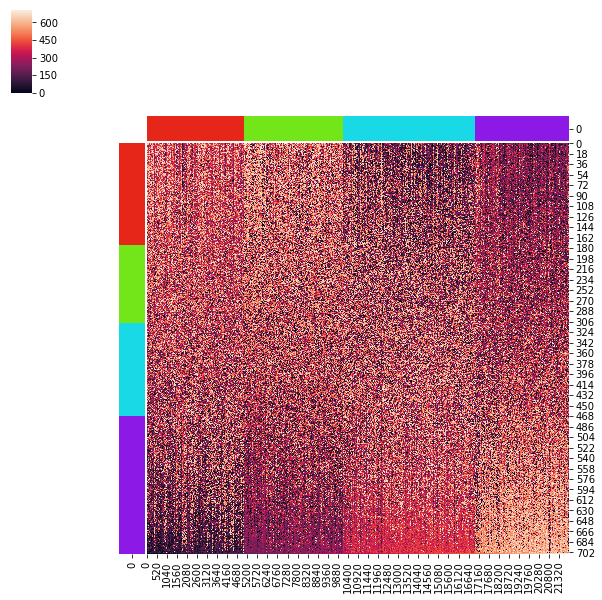

In [110]:
# ax = sns.heatmap(rep2)
true_label = true_y
    
    
data_matrix = pd.DataFrame(rep2)

#     labels = np.random.random_integers(0,5, size=50)
lut = dict(zip(set(true_label), sns.hls_palette(len(set(true_label)), l=0.5, s=0.8)))
row_colors = pd.DataFrame(true_label)[0].map(lut)

lut = dict(zip(set(cell_type), sns.hls_palette(len(set(cell_type)), l=0.5, s=0.8)))
col_colors = pd.DataFrame(cell_type)[0].map(lut)

ax = sns.clustermap(data_matrix,row_cluster=False,col_cluster=False,row_colors=row_colors,col_colors=col_colors)
fig = plt.figure(figsize=(100,100))
# ax.get_figure().savefig("softmax_rank_clustermap.png")
ax.savefig("softmax_rank_clustermap2.png")


plt.show()

In [99]:
_,unique_idx = np.unique(cell_idx,return_index=True)
true_y = cell_type[unique_idx]

In [564]:
true_y_mean2 = np.ones(shape = (num_cells,))
true_y_mean2[mean_i_list>=2] = 1
true_y_mean2[mean_br_list>=2] = 2

In [100]:
true_y

array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2,
       2, 2,

In [218]:
true_y.shape

(705,)

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/ipykernel/__main__.py:39: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix


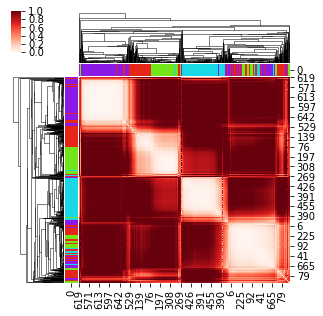

In [221]:
# n_cluster_li = [2,3,4,5,6]
# # fig = plt.figure(figsize=(5,25))
# for CM in CM_list:
#     CM = CM/np.max(CM)
#     fig = plt.figure(figsize=(15,75))
    
#     for n_cluster in n_cluster_li:
#         consensus_label = SpectralClustering(n_clusters=n_cluster,affinity='precomputed').fit_predict(CM)
#         label_sort = np.argsort(consensus_label)
#         plt.subplot(1,5,n_cluster-1)
#         plt.imshow(CM[:,label_sort][label_sort,:])
# #     plt.hist(CM[:])
#     plt.show()
# n_cluster_li = [2,3,4,5,6]
n_cluster_li = [4]
fig = plt.figure(figsize=(15,75))
label_list = []
order_list = []
# fig = plt.figure(figsize=(5,25))
for i in range(len(CM_list)):
    CM = CM_list[i]
    CM = CM/np.max(CM)
#     plt.subplot(1,5,i+1)
#     consensus_label=AgglomerativeClustering(n_clusters=i+2,affinity='precomputed',linkage='average').fit_predict(1-CM)
    consensus_label = SpectralClustering(n_clusters=i+2,affinity='precomputed').fit_predict(CM)
    true_label = true_y
    
    
    data_matrix = pd.DataFrame(1-CM)

#     labels = np.random.random_integers(0,5, size=50)
    lut = dict(zip(set(true_label), sns.hls_palette(len(set(true_label)), l=0.5, s=0.8)))
    row_colors = pd.DataFrame(true_label)[0].map(lut)
    
    
    
    
#     linkage = hc.linkage(sp.distance.squareform(1-CM), method='average')
    linkage_mat = hc.linkage(1-CM, method='single',optimal_ordering=True)
    order_list.append(leaves_list(linkage_mat))
#     sns.clustermap(1-CM, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),cmap='Reds')
    sns.clustermap(data_matrix, row_linkage=linkage_mat, col_linkage=linkage_mat,figsize=(5,5),cmap='Reds',row_colors=row_colors,col_colors=row_colors)

    label_list.append(consensus_label)
    label_sort = np.argsort(consensus_label)
    
#     plt.imshow(CM[:,label_sort][label_sort,:])
#     plt.hist(CM[:])
    plt.show()

In [214]:
np.unique(label_dict[7])

array([0, 1, 2], dtype=int32)

In [374]:
label_list

[array([2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1,
        2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1], dtype=int32),
 array([2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1,
        2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1], dtype=int32),
 array([2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1,
        2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1], dtype=int32),
 array([2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1,
        2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1], dtype=int32),
 array([2, 2, 2, 1, 1, 1, 2, 1, 1, 2, 1, 2, 2, 2, 1, 1, 2, 1, 2, 1, 1, 2, 1,
        2, 1, 1, 1, 2, 1, 2, 2, 2, 1, 2, 2, 1, 2, 1, 2, 1, 2, 1, 1, 1, 1, 1,
        1], dtype=int32)]

/home/yzy/anaconda3/envs/tensorflow/lib/python3.6/site-packages/matplotlib/axes/_axes.py:545: UserWarning: No labelled objects found. Use label='...' kwarg on individual plots.
  warnings.warn("No labelled objects found. "


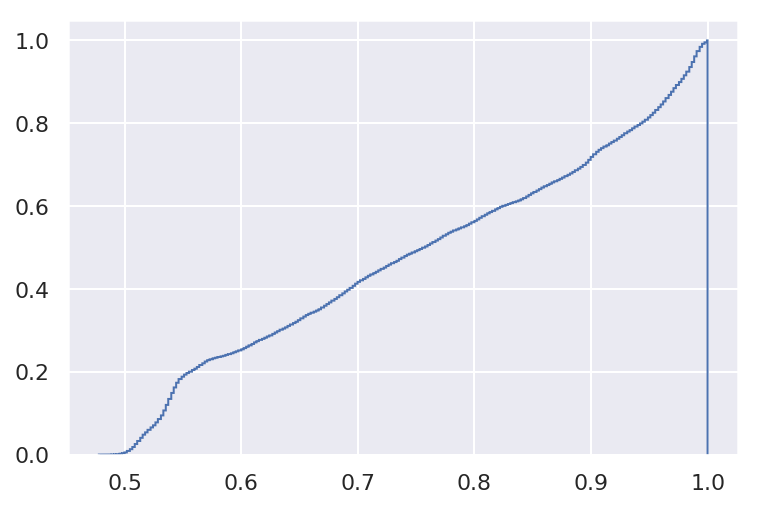

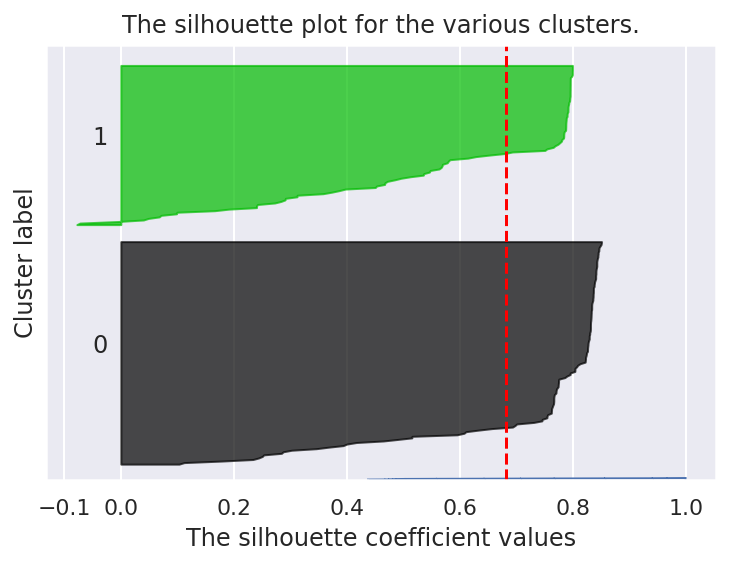

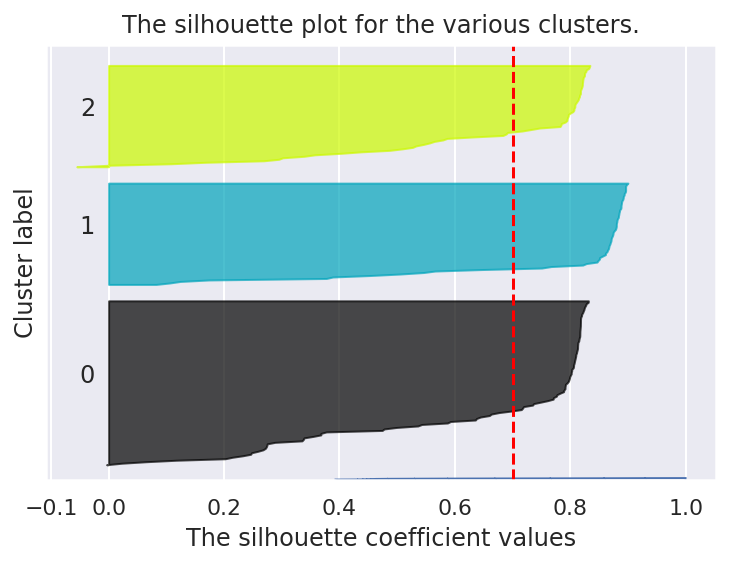

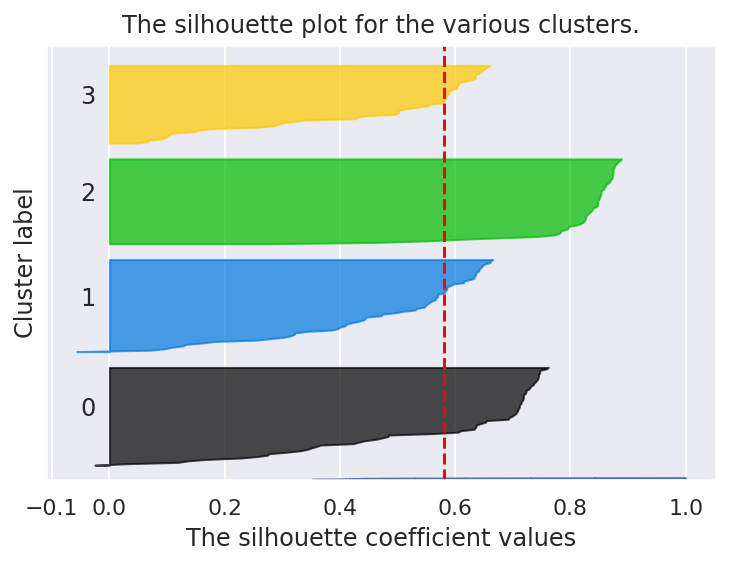

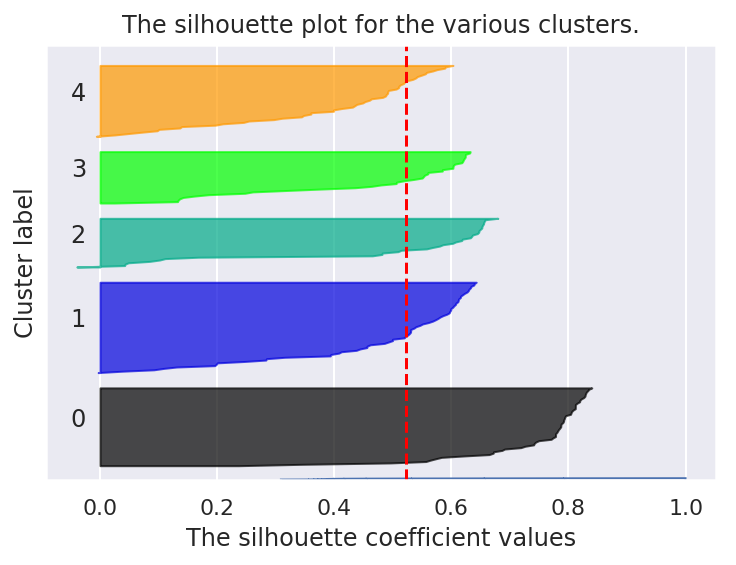

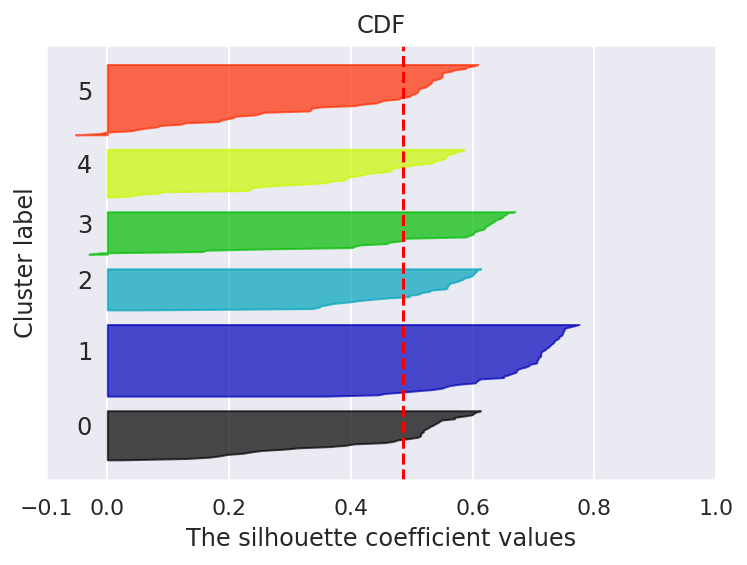

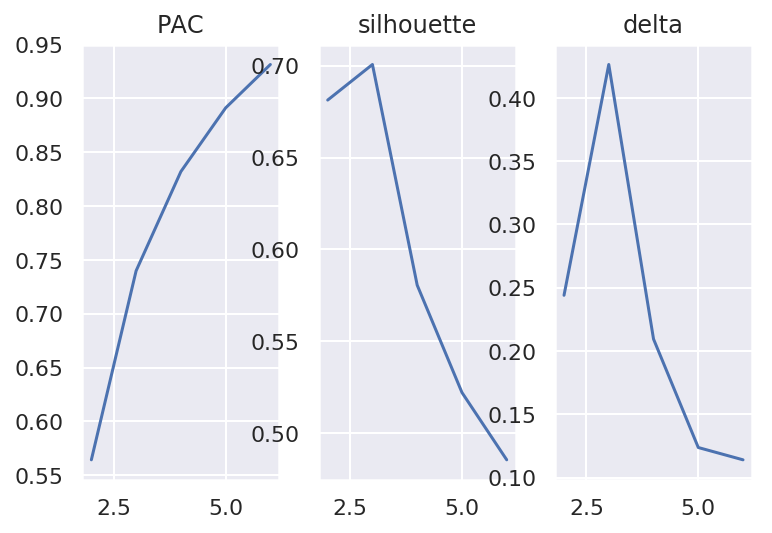

In [514]:
import matplotlib.cm as cm
PAC_list = []
AUCDF_list = []
delta_list = []
silhouette_list = []
prev_AUCDF = 1
a = 0.2
fig = plt.figure()
for i in range(len(CM_list)):
    CM = CM_list[i]
    CM = CM/CM[0,0]

    CM_flatten = CM.flatten()
    n_bins = 1000
#     plt.subplot(1,len(CM_list),i+1)
    n, bins, patches = plt.hist(CM_flatten, n_bins, histtype='step',cumulative=True, label=str(i+2),normed=True)
    bins = bins[0:-1]
    cur_PAC = n[bins>=1-a][0]-n[bins>=a][0]
    cur_AUCDF = np.sum(n)*(bins[1]-bins[0])
    PAC_list.append(cur_PAC)
    AUCDF_list.append(cur_AUCDF)
    if i==0:
        delta_list.append(cur_AUCDF)
    else:
        delta_list.append((cur_AUCDF-prev_AUCDF)/prev_AUCDF)
#     consensus_label = SpectralClustering(n_clusters=i+2,affinity='precomputed').fit_predict(CM)
#     consensus_label=AgglomerativeClustering(n_clusters=i+2,affinity='precomputed',linkage='complete').fit_predict(1-CM)
    consensus_label = label_list[i]
    silhouette_list.append(silhouette_score(1-CM,metric='precomputed',labels = consensus_label))
    prev_AUCDF = cur_AUCDF
    
    
    fig, ax1= plt.subplots(1, 1)
    cluster_labels = consensus_label
    silhouette_avg = silhouette_score(1-CM,metric='precomputed',labels = consensus_label)
    sample_silhouette_values = silhouette_samples(1-CM, metric='precomputed',labels = consensus_label)
    n_clusters = i+2
    y_lower = 10
    for i in range(n_clusters):
        # Aggregate the silhouette scores for samples belonging to
        # cluster i, and sort them
        ith_cluster_silhouette_values = \
            sample_silhouette_values[cluster_labels == i]

        ith_cluster_silhouette_values.sort()

        size_cluster_i = ith_cluster_silhouette_values.shape[0]
        y_upper = y_lower + size_cluster_i

        color = cm.nipy_spectral(float(i) / n_clusters)
        ax1.fill_betweenx(np.arange(y_lower, y_upper),
                          0, ith_cluster_silhouette_values,
                          facecolor=color, edgecolor=color, alpha=0.7)

        # Label the silhouette plots with their cluster numbers at the middle
        ax1.text(-0.05, y_lower + 0.5 * size_cluster_i, str(i))

        # Compute the new y_lower for next plot
        y_lower = y_upper + 10  # 10 for the 0 samples

    ax1.set_title("The silhouette plot for the various clusters.")
    ax1.set_xlabel("The silhouette coefficient values")
    ax1.set_ylabel("Cluster label")

    # The vertical line for average silhouette score of all the values
    ax1.axvline(x=silhouette_avg, color="red", linestyle="--")

    ax1.set_yticks([])  # Clear the yaxis labels / ticks
    ax1.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

    
    
    
    
    
plt.legend(loc='right')
plt.title('CDF')
plt.show()
plt.subplot(1,3,1)
plt.plot(np.arange(len(CM_list))+2,np.array(PAC_list))
plt.title('PAC')
plt.subplot(1,3,2)
plt.plot(np.arange(len(CM_list))+2,np.array(silhouette_list))
plt.title('silhouette')

plt.subplot(1,3,3)
plt.plot(np.arange(len(CM_list))+2,np.array(delta_list))
plt.title('delta')

plt.show()

In [208]:
num_cells

162

In [378]:
from scipy.stats import wasserstein_distance

cell_pixel_dict = {}
pixel_count = []
for i in range(num_cells):
    cur_pixels = train_x[cell_idx==i+1,:]
    cell_pixel_dict[i] = cur_pixels
    pixel_count.append(cur_pixels.shape[0])

dist_mat = np.zeros(shape=(num_features,num_cells,num_cells))
for k in range(num_features):
    print(k)
    
    for i in range(num_cells):
        for j in range(num_cells):
            cur_dist = wasserstein_distance(cell_pixel_dict[i][:,k],cell_pixel_dict[j][:,k])
            dist_mat[k,i,j] = cur_dist



0
1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273


In [379]:
# 给定label，计算wbratio的matrix，找差异物质
select_k = 0
label = label_list[select_k]
n_label = np.unique(label).shape[0]
wbr_mat_list = np.zeros(shape=(num_features,n_label,n_label))

for i in range(num_features):
    cur_dist_mat = dist_mat[i,:,:]
    cur_wbr_mat = np.zeros(shape=(n_label,n_label))
    for j in range(n_label):
        for k in range(n_label):
            within_sum_j = np.sum(dist_mat[i,:,:][label==j,:][:,label==j])
            within_sum_k = np.sum(dist_mat[i,:,:][label==k,:][:,label==k])
            between_sum_1 = np.sum(dist_mat[i,:,:][label==j,:][:,label==k])
            between_sum_2 = np.sum(dist_mat[i,:,:][label==k,:][:,label==j])
            cur_wbr_mat[j,k] = (within_sum_j+within_sum_k)/(between_sum_1+between_sum_2)
    wbr_mat_list[i,:,:] = cur_wbr_mat

In [383]:
a = []
b = [1,2]
c = [3,4]
a.extend(b)
a.extend(c)
a

[1, 2, 3, 4]

0 1 31


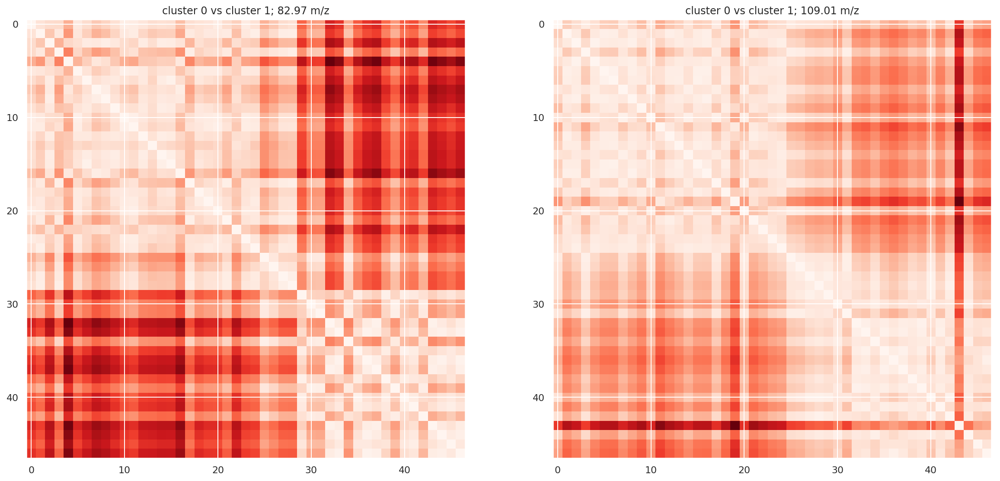

In [384]:
# sorted_label_idx = np.argsort(label)
# matter_list = [51.01, 51.02, 51.99, 52.96, 53.04, 54.01, 54.04, 56.02, 56.06, 57.02, 57.04, 60.0, 64.97, 64.99, 65.96, 66.97, 68.05, 69.04, 70.01, 70.97, 70.98, 71.93, 72.97, 73.05, 79.42, 81.05, 81.95, 81.99, 82.03, 82.97, 84.05, 85.04, 86.0, 87.06, 88.02, 88.97, 90.01, 91.03, 92.02, 93.01, 93.04, 93.99, 94.03, 95.03, 95.96, 96.01, 96.05, 96.93, 97.93, 97.97, 101.03, 104.01, 105.03, 105.97, 106.03, 106.99, 107.03, 108.02, 109.01, 109.04, 109.98, 110.03, 110.98, 111.03, 111.96, 112.96, 113.04, 113.97, 114.93, 115.0, 117.02, 118.03, 120.02, 121.04, 122.03, 123.02, 123.99, 124.04, 124.97, 125.04, 126.05, 126.96, 127.06, 127.95, 128.05, 128.96, 129.11, 130.95, 131.03, 132.03, 133.01, 134.05, 135.04, 136.01, 136.29, 142.07, 143.05, 143.95, 144.04, 145.04, 146.04, 146.95, 147.02, 148.04, 149.04, 149.88, 150.05, 150.89, 150.98, 151.05, 151.89, 151.95, 153.02, 153.96, 154.07, 154.95, 156.94, 157.04, 157.92, 158.05, 159.04, 160.04, 161.04, 162.05, 163.02, 164.04, 165.03, 165.92, 166.92, 167.94, 168.06, 168.94, 169.95, 170.09, 170.94, 171.96, 172.03, 172.96, 173.05, 174.05, 176.05, 178.04, 180.05, 182.07, 183.93, 184.95, 185.07, 185.92, 186.06, 186.92, 187.97, 188.06, 189.06, 190.05, 191.05, 192.06, 193.05, 194.06, 201.06, 202.06, 202.91, 203.91, 204.05, 204.91, 205.06, 205.92, 206.06, 206.92, 207.05, 208.08, 208.93, 209.09, 209.94, 210.08, 210.94, 212.95, 213.89, 214.05, 216.06, 218.07, 221.07, 222.07, 223.89, 224.93, 225.92, 226.94, 228.9, 229.91, 230.85, 232.08, 232.87, 233.06, 233.87, 242.89, 243.9, 244.88, 245.89, 246.89, 247.88, 248.9, 249.9, 251.19, 253.21, 254.86, 255.22, 256.23, 261.86, 262.88, 263.88, 264.89, 265.87, 266.87, 268.88, 269.24, 269.89, 271.88, 277.21, 279.22, 281.24, 282.24, 282.87, 283.26, 284.87, 285.88, 287.88, 290.85, 291.86, 292.83, 293.84, 301.85, 302.86, 303.86, 304.86, 306.86, 308.85, 309.88, 314.84, 321.85, 322.86, 323.85, 324.85, 325.85, 333.82, 341.83, 342.84, 344.84, 346.85, 348.84, 350.82, 362.83, 363.83, 364.83, 365.83, 367.58, 380.81, 381.8, 382.82, 384.84, 386.83, 387.82, 402.81, 403.81, 404.81, 412.77, 424.81, 426.8, 433.77, 434.75, 440.78, 450.74, 456.75, 464.77, 504.79, 514.73, 520.75, 526.74, 542.74, 566.74, 576.68, 588.75, 668.68, 794.57, 795.58, 861.55, 883.56, 885.56]
matters_candidate = [50.74, 51.01, 51.02, 51.98, 51.99, 52.96, 52.98, 53.04, 54.01, 54.04, 56.02, 56.06, 57.02, 57.04, 60.0, 64.97, 64.99, 65.96, 66.97, 68.05, 69.04, 70.01, 70.97, 70.98, 71.93, 72.97, 73.05, 79.43, 81.05, 81.95, 81.99, 82.03, 82.97, 84.05, 85.04, 86.0, 87.06, 88.02, 88.97, 90.01, 91.03, 92.02, 93.01, 93.04, 93.99, 94.03, 95.03, 95.96, 96.01, 96.05, 96.93, 97.93, 97.97, 101.03, 104.01, 105.03, 105.97, 106.03, 106.99, 107.03, 108.02, 109.01, 109.04, 109.98, 110.03, 110.98, 111.02, 111.96, 112.96, 113.04, 113.97, 114.93, 115.0, 117.02, 118.03, 120.02, 121.04, 122.03, 123.02, 123.99, 124.04, 124.97, 125.04, 126.04, 126.96, 127.06, 127.95, 128.05, 128.96, 129.11, 130.95, 131.03, 132.03, 133.01, 134.05, 135.04, 136.01, 136.29, 142.07, 143.04, 143.95, 144.04, 145.04, 146.04, 146.95, 147.02, 148.04, 149.04, 149.88, 150.05, 150.89, 150.99, 151.05, 151.89, 151.95, 153.02, 153.96, 154.06, 154.94, 156.94, 157.04, 157.93, 158.05, 159.04, 160.04, 161.04, 162.04, 163.02, 164.04, 165.03, 165.91, 166.92, 167.94, 168.06, 168.94, 169.95, 170.08, 170.94, 171.96, 172.03, 172.96, 173.05, 174.05, 176.04, 178.04, 180.05, 182.07, 183.93, 184.94, 185.06, 185.93, 186.05, 186.93, 187.97, 188.06, 189.05, 190.05, 191.05, 192.06, 193.04, 194.06, 201.06, 201.91, 202.06, 202.91, 203.91, 204.05, 204.91, 205.05, 205.92, 206.06, 206.92, 207.05, 208.08, 208.92, 209.09, 209.94, 210.08, 210.94, 212.96, 213.9, 214.05, 216.05, 218.06, 221.06, 222.07, 223.89, 224.93, 225.92, 226.94, 228.9, 229.91, 230.86, 232.07, 232.88, 233.06, 233.88, 242.89, 243.9, 244.88, 245.89, 246.89, 247.89, 248.9, 249.91, 253.22, 254.86, 255.23, 256.23, 261.87, 262.88, 263.88, 264.89, 265.88, 266.88, 268.88, 269.89, 271.89, 281.25, 282.25, 282.87, 283.27, 284.86, 285.87, 287.88, 290.86, 291.86, 292.86, 293.85, 301.85, 302.86, 303.87, 304.86, 306.85, 308.85, 309.88, 314.84, 321.85, 322.85, 323.85, 324.84, 325.85, 333.83, 341.83, 342.84, 344.83, 346.84, 348.85, 350.82, 362.82, 363.83, 364.83, 365.83, 367.59, 380.81, 381.81, 382.81, 384.82, 386.82, 387.82, 402.8, 403.81, 404.81, 412.78, 424.8, 426.8, 433.77, 434.76, 440.77, 450.75, 455.75, 456.75, 464.76, 494.72];

sorted_label_idx = order_list[select_k]
CM = CM_list[select_k]
CM = CM/CM[0,0]
idx_list = []
for i in range(n_label):
    for j in range(i+1,n_label):
        fig = plt.figure(figsize=(20,20))
        
        cur_diff_matter_idx0 = np.argsort(wbr_mat_list[:,i,j])[0]
        cur_diff_matter_idx1 = np.argsort(wbr_mat_list[:,i,j])[1]
#         idx_list.append(cur_diff_matter_idx0)
#         idx_list.append(cur_diff_matter_idx1)
        to_add = list(np.argsort(wbr_mat_list[:,i,j])[0:10])
        idx_list.extend(to_add)
        print(i,j,cur_diff_matter_idx0+2)
        plt.grid(False)
        plt.axis('off')
        plt.subplot(1,2,1)
        plt.imshow(dist_mat[cur_diff_matter_idx0,:,:][sorted_label_idx,:][:,sorted_label_idx],cmap='Reds')
        plt.title('cluster {i} vs cluster {j}; {matter} m/z'.format(i=i,j=j,matter=matter_list[cur_diff_matter_idx0]))
        plt.subplot(1,2,2)
        plt.imshow(dist_mat[cur_diff_matter_idx1,:,:][sorted_label_idx,:][:,sorted_label_idx],cmap='Reds')
        plt.title('cluster {i} vs cluster {j}; {matter} m/z'.format(i=i,j=j,matter=matter_list[cur_diff_matter_idx1]))
        
        
        
#         plt.imshow(CM[sorted_label_idx,:][:,sorted_label_idx],cmap='Reds')
#         hybrid_mat = get_hybrid_mat(a,b)
        plt.show()

In [385]:
matter_mean_list = []
for i in range(num_features):
    cur_matter_mean = np.zeros(shape=(num_cells,))
    for j in range(num_cells):
        cur_cell_intensity = np.mean(train_x[:,i][cell_idx==j+1])
        cur_matter_mean[j] = cur_cell_intensity
    matter_mean_list.append(cur_matter_mean)

In [386]:

idx_func = np.vectorize(ind2ij)
cell_median_list = []
for i in range(num_cells):
    cur_cell_pos = pos_dict[batch_num][cell_dict[batch_num]==i+1]
    median_i = int(np.median(idx_func(cur_cell_pos,256,0)))
    median_j = int(np.median(idx_func(cur_cell_pos,256,1)))
    cell_median_list.append([median_i,median_j])
cell_median_list = np.array(cell_median_list)-1

In [77]:
distance_mat = distance_matrix(cell_median_list,cell_median_list)
intensity_diff_mat_list = []
np.zeros(shape=(num_cells,num_cells))
for i in range(num_features):
    cur_matter_mean = matter_mean_list[i]
    intensity_diff_mat = np.zeros(shape=(num_cells,num_cells))
    for j in range(num_cells):
        cur_matter_intensity = cur_matter_mean[j]
        neighbor_matter_intensity = cur_matter_intensity - cur_matter_mean
        intensity_diff_mat[j,:] = neighbor_matter_intensity
    intensity_diff_mat_list.append(intensity_diff_mat)

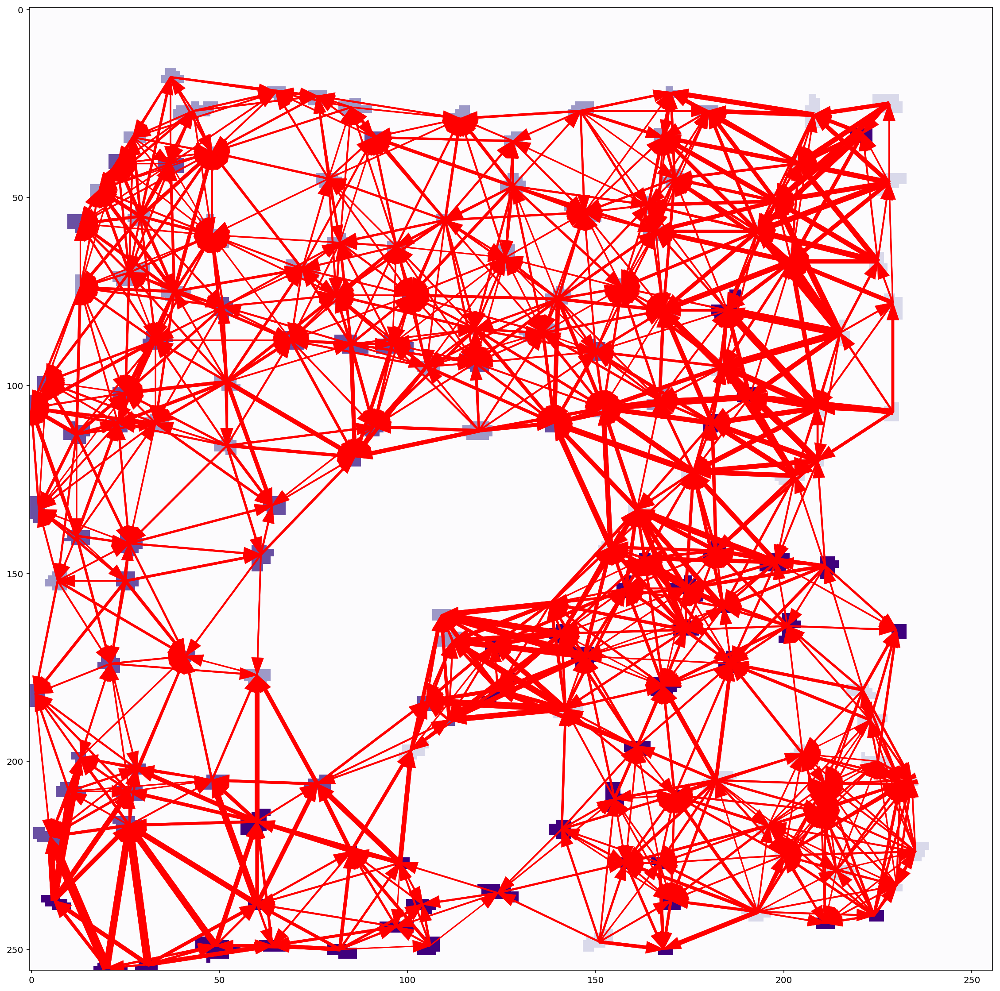

In [39]:
kth_matter = 217

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# X = csr_matrix()
# Tcsr = minimum_spanning_tree(X)
# Tcsr.toarray().astype(int)

distance_threshold = 40
k_neighbors = 3
arrow_mini_gap = 1
# labeled_img = label_dict[batch_num][np.argsort(pos_dict[batch_num])]
# labeled_img = labeled_img.reshape((256,256))
labeled_img = get_labeling(label_list[2],cell_idx)
labeled_img = labeled_img.reshape((256,256))

fig = plt.figure(figsize=(20,20))
plt.imshow(labeled_img,cmap='Purples')
intensity_diff_mat = intensity_diff_mat_list[kth_matter]
for i in range(num_cells):
    cur_distance_row = distance_mat[i,:]
    selected_neighbors = (cur_distance_row<=distance_threshold)
#     selected_neighbors = (Tcsr[i,:]>0)
    
#     selected_neighbors = np.zeros(shape=(num_cells,))
#     selected_neighbors[np.argsort(cur_distance_row)[0:k_neighbors]] = 1
    
    selected_neighbors[i] = False
    for j in range(num_cells):
        if selected_neighbors[j]==False:
            continue
#         line_width = 3*np.abs(intensity_diff_mat[i,j])/np.max(np.abs(intensity_diff_mat))
        line_width = 3*(dist_mat[kth_matter,i,j]/np.max(dist_mat[kth_matter,:,:]))
#         print(line_width)
        if intensity_diff_mat[i,j]>0:
            
#             plt.arrow(cell_median_list[j,1],cell_median_list[j,1],np.abs(cell_median_list[j,0]-cell_median_list[i,0]),np.abs(cell_median_list[j,1]-cell_median_list[i,1]),head_width=2)
            plt.arrow(cell_median_list[j,1],cell_median_list[j,0],-(cell_median_list[j,1]-cell_median_list[i,1]),-(cell_median_list[j,0]-cell_median_list[i,0]),head_width=3,length_includes_head=True,width=line_width,color='red')
            
        else:
#             plt.arrow(cell_median_list[i,0],cell_median_list[i,1],np.abs(cell_median_list[j,0]-cell_median_list[i,0]),np.abs(cell_median_list[j,1]-cell_median_list[i,1]),head_width=2)
            plt.arrow(cell_median_list[i,1],cell_median_list[i,0],-(cell_median_list[i,1]-cell_median_list[j,1]),-(cell_median_list[i,0]-cell_median_list[j,0]),head_width=3,length_includes_head=True,width=line_width,color='red')
            
plt.show()

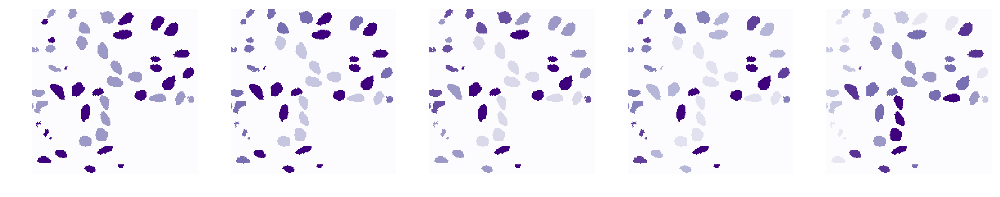

In [377]:
fig_width = 20
fig = plt.figure(figsize=(fig_width,fig_width*len(label_list)))
for i in range(len(label_list)):
    cur_labeling = get_labeling(label_list[i],cell_idx)

    img = cur_labeling.reshape((256,256))
    plt.subplot(1,len(label_list),i+1)
#     with sns.axes_style("white"):
#     plt.imshow(x)
    plt.grid(False)
    plt.axis('off')
    plt.imshow(img,cmap='Purples')
#     plt.colorbar()
    
plt.show()

In [188]:
network_colors

network  node  hemi
1        1     lh      [0.8167028311697733, 0.5345122109266688, 0.575...
               rh      [0.8167028311697733, 0.5345122109266688, 0.575...
5        1     lh      [0.7256380093027939, 0.5865684184445076, 0.451...
               rh      [0.7256380093027939, 0.5865684184445076, 0.451...
6        1     lh      [0.601243246823196, 0.6281411529879642, 0.4495...
               rh      [0.601243246823196, 0.6281411529879642, 0.4495...
         2     lh      [0.601243246823196, 0.6281411529879642, 0.4495...
               rh      [0.601243246823196, 0.6281411529879642, 0.4495...
7        1     lh      [0.4542447259142938, 0.6576596537208662, 0.513...
               rh      [0.4542447259142938, 0.6576596537208662, 0.513...
         2     lh      [0.4542447259142938, 0.6576596537208662, 0.513...
               rh      [0.4542447259142938, 0.6576596537208662, 0.513...
         3     lh      [0.4542447259142938, 0.6576596537208662, 0.513...
               rh      [0.45424

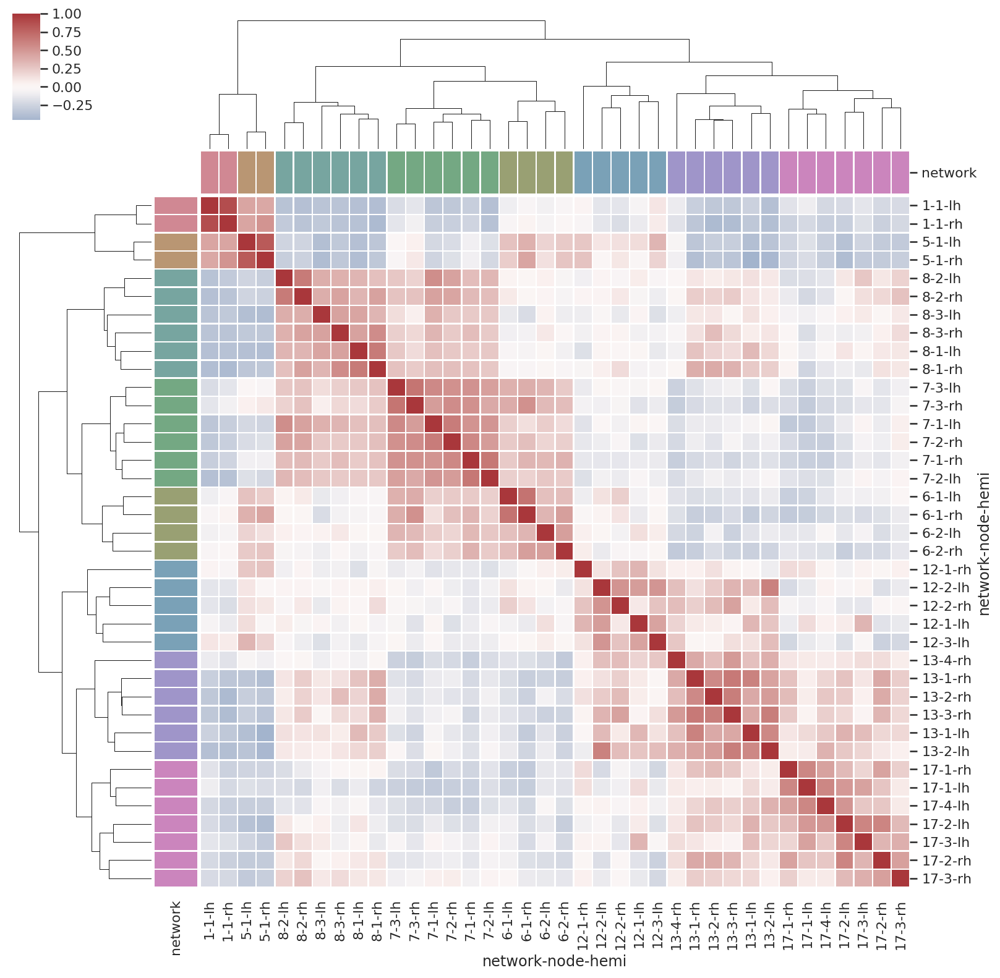

In [186]:
import pandas as pd
import seaborn as sns
import ssl
sns.set()
ssl._create_default_https_context = ssl._create_unverified_context

# Load the brain networks example dataset
df = sns.load_dataset("brain_networks", header=[0, 1, 2], index_col=0)

# Select a subset of the networks
used_networks = [1, 5, 6, 7, 8, 12, 13, 17]
used_columns = (df.columns.get_level_values("network")
                          .astype(int)
                          .isin(used_networks))
df = df.loc[:, used_columns]

# Create a categorical palette to identify the networks
network_pal = sns.husl_palette(8, s=.45)
network_lut = dict(zip(map(str, used_networks), network_pal))

# Convert the palette to vectors that will be drawn on the side of the matrix
networks = df.columns.get_level_values("network")
network_colors = pd.Series(networks, index=df.columns).map(network_lut)

# Draw the full plot
sns.clustermap(df.corr(), center=0, cmap="vlag",
               row_colors=network_colors, col_colors=network_colors,
               linewidths=.75, figsize=(13, 13))

In [ ]:
idx_list

In [ ]:
sns.clustermap(a[idx_list,:][:,sorted_label_idx],col_cluster=True,col_colors=label_list[select_k])
plt.show()

In [ ]:
label_list[select_k]

In [ ]:
a[idx_list,:][:,sorted_label_idx].shape

In [ ]:
import ssl

fmri = sns.load_dataset("fmri")
ax = sns.lineplot(x="timepoint", y="signal", hue="event",data=fmri)

In [ ]:
fmri

In [ ]:
sns.set(style="whitegrid")
iris = sns.load_dataset("iris")

# "Melt" the dataset to "long-form" or "tidy" representation


In [ ]:
iris

In [ ]:
iris = pd.melt(iris, "species", var_name="measurement")

In [ ]:
iris

In [ ]:
# Initialize the figure
f, ax = plt.subplots()
sns.despine(bottom=True, left=True)

# Show each observation with a scatterplot
sns.stripplot(x="value", y="measurement", hue="species",
              data=iris, dodge=True, jitter=True,
              alpha=.25, zorder=1)

In [ ]:
import seaborn as sns
sns.lineplot()

In [ ]:
import seaborn as sns; sns.set()
import matplotlib.pyplot as plt
fmri = sns.load_dataset("fmri")
# ax = sns.lineplot(x="timepoint", y="signal", data=fmri)
ax = sns.lineplot(x="timepoint", y="signal", hue="event",data=fmri)
plt.show()

In [388]:
wasserstein_distance_mat = dist_mat
CM_mat = CM_list[select_k]
idx_list = np.unique(np.array(idx_list))
pd_dict = {'cluster_comb':[]}
for i in range(num_cells):
    for j in range(i+1,num_cells):
        i_cluster = label_list[select_k][i]
        j_cluster = label_list[select_k][j]
#         if i_cluster == j_cluster:
#             continue
        cluster_comb = sorted([i_cluster,j_cluster])
        pd_dict['cluster_comb'].append('cluster {c0} vs {c1}'.format(c0=cluster_comb[0],c1=cluster_comb[1]))
        for k in idx_list:
            if pd_dict.get(str(matter_list[k])) is None:
                pd_dict[str(matter_list[k])] = [wasserstein_distance_mat[k,i,j]]
            else:
                pd_dict[str(matter_list[k])].append(wasserstein_distance_mat[k,i,j])
            

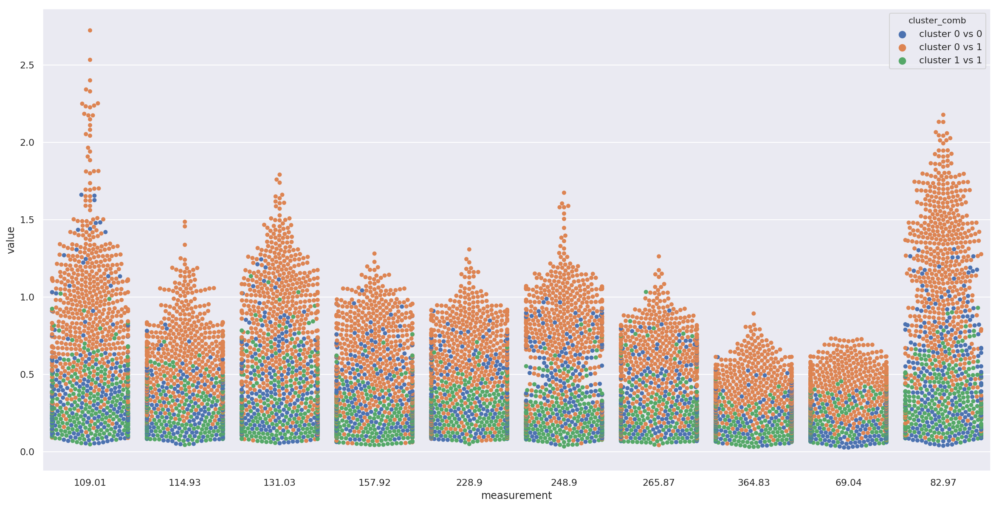

In [390]:
pd_swarm = pd.DataFrame(data=pd_dict)
# iris = pd.melt(iris, "species", var_name="measurement")
pd_swarm = pd.melt(pd_swarm,'cluster_comb',var_name='measurement')
plt.figure(figsize=(20,10))
sns_plot=sns.swarmplot(x="measurement", y="value", hue="cluster_comb", data=pd_swarm)
sns_plot.get_figure().savefig("swarmplot6.png")
plt.show()

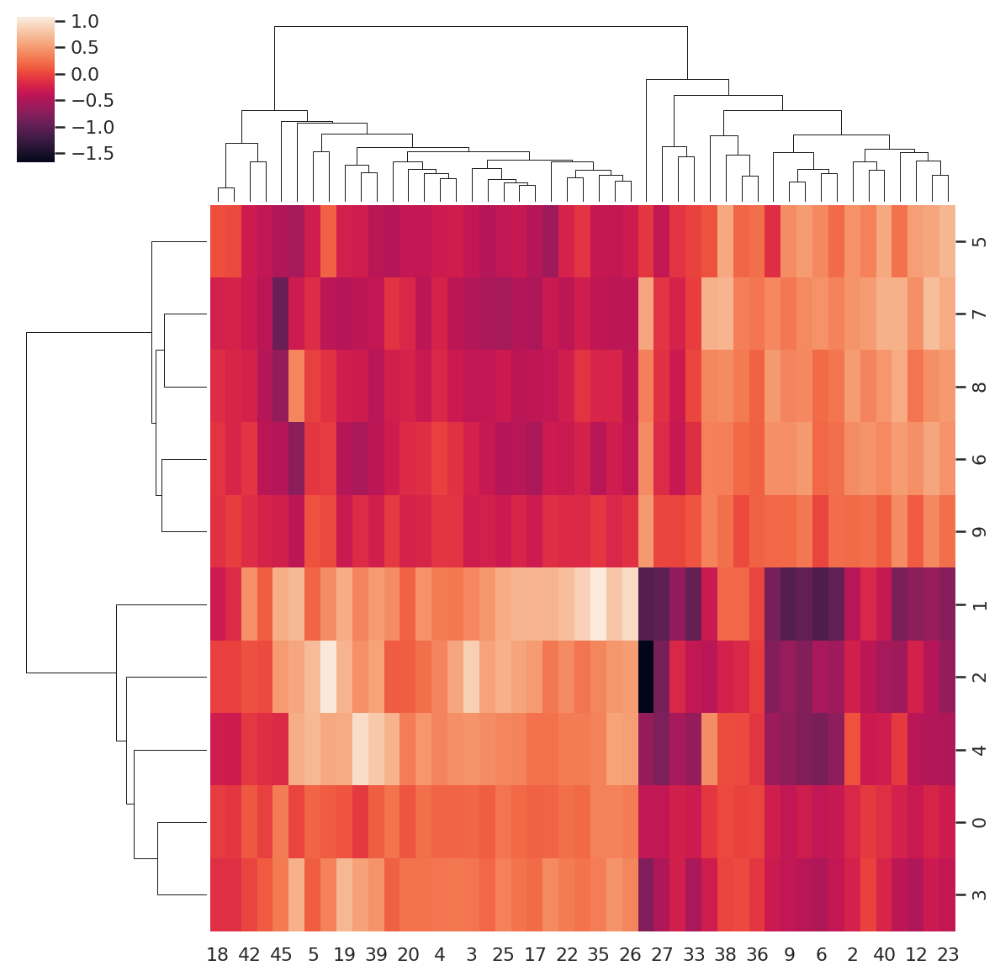

In [391]:
sns.clustermap(np.array(matter_mean_list)[idx_list,:])

In [538]:
# br_sample = sio.loadmat('/home/yzy/SIMS/468br_skno_br.mat')
# br_sample = br_sample['br_sample'][cell_related_ind,0]

i_sample = bri_dict[2][:,1]
mean_i_list = []
max_i_list = []
br_sample = bri_dict[2][:,0]
mean_br_list = []
max_br_list = []
for i in range(num_cells):
#     cur_br = (br_sample[cell_dict[7][np.argsort(pos_dict[7])]==i+1])
    cur_i = i_sample[cell_related_ind][cell_idx==i+1]
    cur_br = br_sample[cell_related_ind][cell_idx==i+1]
    
#     cur_br = br_sample[cell_idx==i+1]
    mean_i_list.append(np.mean(cur_i))
    max_i_list.append(np.max(cur_i))
    mean_br_list.append(np.mean(cur_br))
    max_br_list.append(np.max(cur_br))
mean_i_list = np.array(mean_i_list)
max_i_list = np.array(max_i_list)
mean_br_list = np.array(mean_br_list)
max_br_list = np.array(max_br_list)

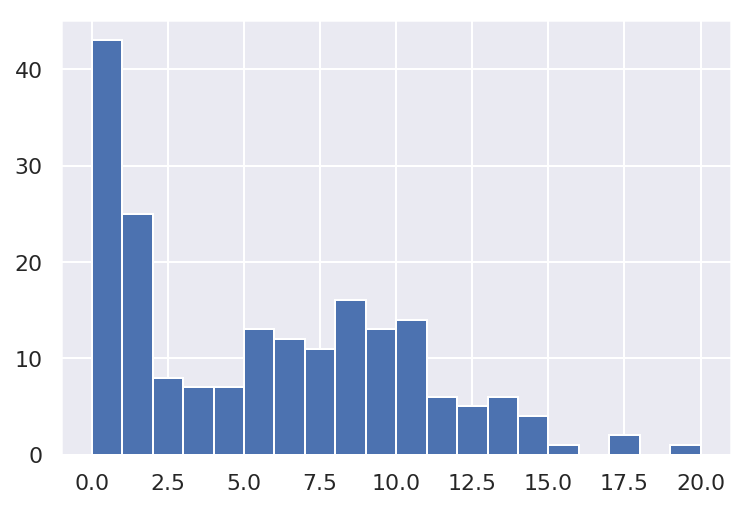

In [547]:
binwidth = 1
data = mean_br_list
plt.hist(data,bins=np.arange(np.min(data), np.max(data) + binwidth, binwidth))
plt.show()

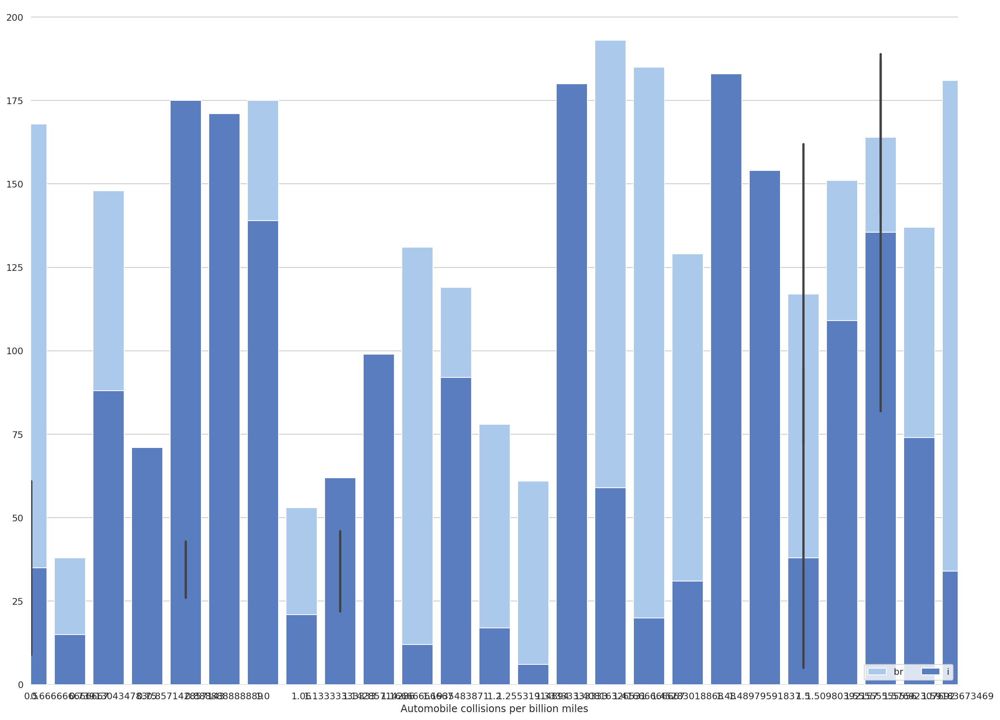

In [557]:
pd_dict = {
    'br':mean_br_list,
    'i':mean_i_list,
    'cell_no':np.arange(num_cells)
}
pd_data = pd.DataFrame(pd_dict)
f, ax = plt.subplots(figsize=(20, 15))
sns.set(style="whitegrid")
sns.set_color_codes("pastel")
sns.barplot(x="br", y="cell_no", data=pd_data,
            label="br", color="b")

# Plot the crashes where alcohol was involved
sns.set_color_codes("muted")
sns.barplot(x="i", y="cell_no", data=pd_data,
            label="i", color="b")

# Add a legend and informative axis label
ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 24), ylabel="",
       xlabel="Automobile collisions per billion miles")
sns.despine(left=True, bottom=True)

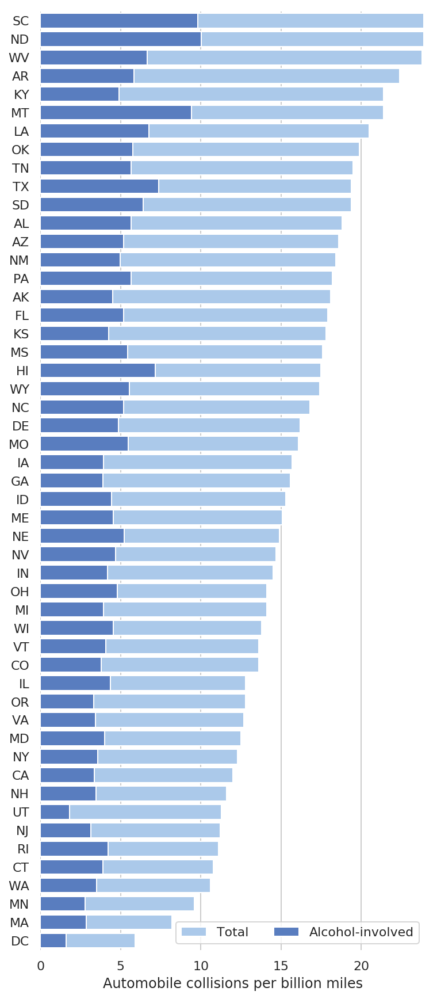

In [560]:
import seaborn as sns
import matplotlib.pyplot as plt
sns.set(style="whitegrid")

# Initialize the matplotlib figure
f, ax = plt.subplots(figsize=(6, 15))

# Load the example car crash dataset
crashes = sns.load_dataset("car_crashes").sort_values("total", ascending=False)

# Plot the total crashes
sns.set_color_codes("pastel")
sns.barplot(x="total", y="abbrev", data=crashes,
            label="Total", color="b")

# Plot the crashes where alcohol was involved
sns.set_color_codes("muted")
sns.barplot(x="alcohol", y="abbrev", data=crashes,
            label="Alcohol-involved", color="b")

# Add a legend and informative axis label
ax.legend(ncol=2, loc="lower right", frameon=True)
ax.set(xlim=(0, 24), ylabel="",
       xlabel="Automobile collisions per billion miles")
sns.despine(left=True, bottom=True)

In [561]:
crashes

,total,speeding,alcohol,not_distracted,no_previous,ins_premium,ins_losses,abbrev
40,23.9,9.082,9.799,22.944,19.359,858.97,116.29,SC
34,23.9,5.497,10.038,23.661,20.554,688.75,109.72,ND
48,23.8,8.092,6.664,23.086,20.706,992.61,152.56,WV
3,22.4,4.032,5.824,21.056,21.280,827.34,142.39,AR
17,21.4,4.066,4.922,16.692,16.264,872.51,137.13,KY
26,21.4,8.346,9.416,17.976,18.190,816.21,85.15,MT
18,20.5,7.175,6.765,14.965,20.090,1281.55,194.78,LA
36,19.9,6.368,5.771,18.308,18.706,881.51,178.86,OK
42,19.5,4.095,5.655,15.990,15.795,767.91,155.57,TN
43,19.4,7.760,7.372,17.654,16.878,1004.75,156.83,TX


In [559]:
len(mean_br_list)

194

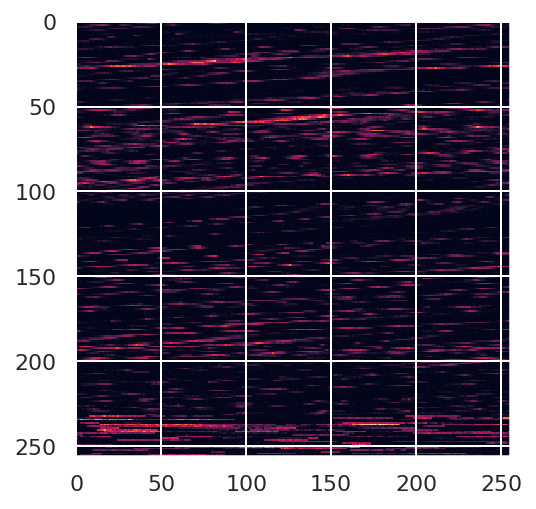

In [497]:
# img = batch_dict[7][:,0][np.argsort(pos_dict[7])]
# img = br_sample[np.argsort(pos_dict[7])]
img = bri_dict[1][:,1]
img = img.reshape((256,256))
plt.imshow(img)
plt.show()

In [495]:
bri_dict[1].shape

(65536, 2)

In [393]:
np.sum(true_y==2)

21

In [115]:

a = np.array([[1,2,3],[4,5,6]])
sio.savemat('a_test',{'a':a})